In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install scanpy python-igraph leidenalg mellon gseapy slingshot

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 28.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 98.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 63.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 597.5/597.5 kB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.9/169.9 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.4/172.4 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.2/144.2 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.0/261.0 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.

In [ ]:
# --- Librerías ---
import scanpy as sc
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import plotly.express as px

# --- 1. Cargar objeto AnnData ---
adata = sc.read_h5ad("/content/drive/MyDrive/MCF7_3_5_7_DIAS/META and SUB CLUSTERS/reactome_and_itsmetaclusters.h5ad")

In [ ]:
adata

AnnData object with n_obs × n_vars = 7290 × 3676
    obs: 'barcodes', 'Day', 'leiden', 'agglo_phate', 'ABC Transporter Disorders R-HSA-5619084_SCORE', 'ABC-family Proteins Mediated Transport R-HSA-382556_SCORE', 'ADORA2B Mediated Anti-Inflammatory Cytokine Production R-HSA-9660821_SCORE', 'AKT Phosphorylates Targets In Cytosol R-HSA-198323_SCORE', 'ALK Mutants Bind TKIs R-HSA-9700645_SCORE', 'APC-Cdc20 Mediated Degradation Of Nek2A R-HSA-179409_SCORE', 'APC/C-mediated Degradation Of Cell Cycle Proteins R-HSA-174143_SCORE', 'APC/C:Cdc20 Mediated Degradation Of Cyclin B R-HSA-174048_SCORE', 'APC/C:Cdc20 Mediated Degradation Of Securin R-HSA-174154_SCORE', 'APC/C:Cdc20 Mediated Degradation Of Mitotic Proteins R-HSA-176409_SCORE', 'APC/C:Cdh1 Mediated Degradation Of Cdc20 And APC/C:Cdh1 Targets In Late Mitosis/Early G1 R-HSA-174178_SCORE', 'APC:Cdc20 Mediated Degradation Of Cell Cycle Proteins Before Cycle Checkpoint Satisfied R-HSA-179419_SCORE', 'ATF4 Activates Genes In Response To Endop

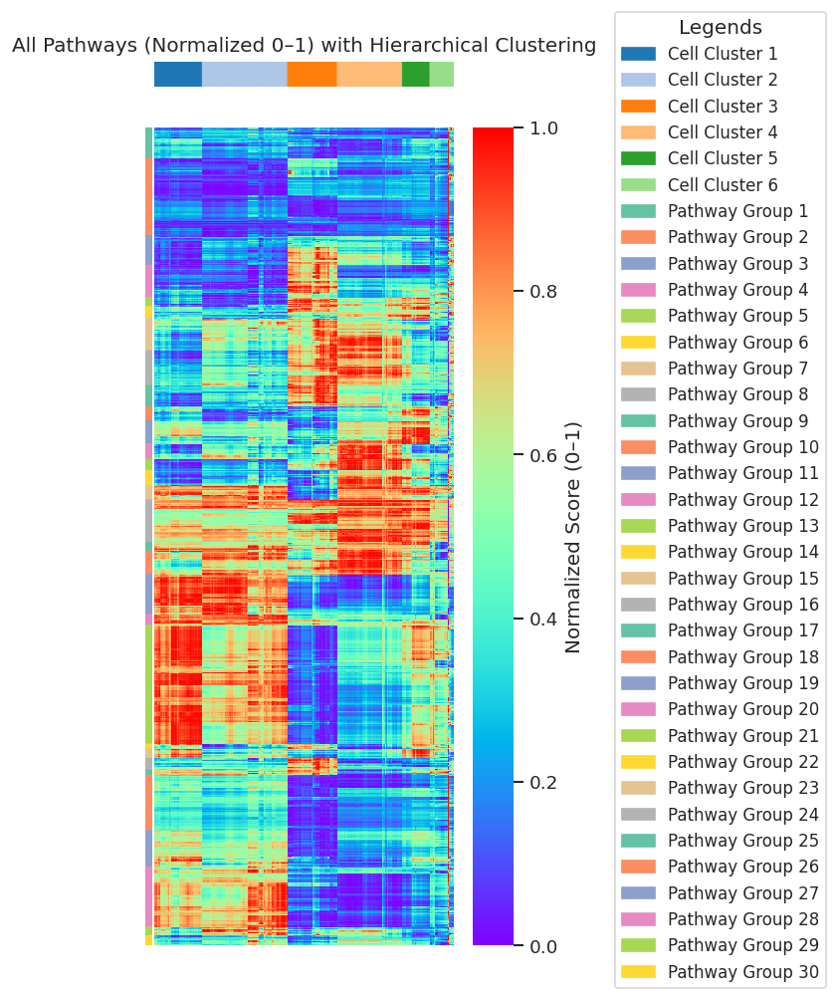

In [ ]:
# --- Libraries ---
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy.cluster.hierarchy import linkage, leaves_list, fcluster
from sklearn.preprocessing import MinMaxScaler

# --- 1. Select score columns ---
score_columns = [col for col in adata.obs.columns if col.endswith("_SCORE")]
df = adata.obs[score_columns].dropna()

# --- 2. Normalize each pathway (row of the heatmap) from 0 to 1 ---
df_norm = pd.DataFrame(MinMaxScaler().fit_transform(df),
                       index=df.index,
                       columns=df.columns)

# --- 3. Hierarchical clustering on cells (heatmap columns) ---
linkage_cols = linkage(df_norm.values, method="ward")
col_order_idx = leaves_list(linkage_cols)
col_order = df_norm.index[col_order_idx]

# --- 4. Hierarchical clustering on pathways (heatmap rows) ---
linkage_rows = linkage(df_norm.T.values, method="complete")
row_order_idx = leaves_list(linkage_rows)
row_order = df_norm.columns[row_order_idx]

# --- 5. Assign hierarchical cell clusters (k=6) ---
cell_cluster_labels = fcluster(linkage_cols, 6, criterion='maxclust')
adata.obs["hierarchical_cluster"] = pd.Categorical(cell_cluster_labels.astype(str))

# --- 6. Group pathways into modules (row clusters, k=15) ---
k_pathways = 30
row_cluster_labels = fcluster(linkage_rows, k_pathways, criterion='maxclust')
row_palette = sns.color_palette("Set2", k_pathways)
row_lut = dict(zip(range(1, k_pathways + 1), row_palette))
row_labels_reordered = [row_cluster_labels[df_norm.columns.get_loc(p)] for p in row_order]
row_colors = np.array([row_lut[i] for i in row_labels_reordered]).reshape(-1, 1, 3)

# --- 7. Colors for cell clusters aligned to column order ---
cell_labels_reordered = [cell_cluster_labels[i] for i in col_order_idx]
unique_cell_clusters = sorted(set(cell_labels_reordered))
palette = sns.color_palette("tab20", len(unique_cell_clusters))
lut = dict(zip([str(i) for i in unique_cell_clusters], palette))
rgb_clusters = np.array([lut[str(i)] for i in cell_labels_reordered]).reshape(1, -1, 3)

# --- 8. Heatmap visualization ---
fig, ax = plt.subplots(figsize=(4, 8))
sns.heatmap(
    df_norm.loc[col_order, row_order].T,
    cmap="rainbow",
    ax=ax,
    xticklabels=False,
    yticklabels=False,
    cbar_kws={"label": "Normalized Score (0–1)"}
)
ax.set_title("All Pathways (Normalized 0–1) with Hierarchical Clustering")

# --- 9. Helper functions for color bars ---
def add_bar(ax, rgb, y_offset=0.01, height=0.03):
    x_start, x_end = ax.get_xlim()
    ax_inset = ax.inset_axes([0, 1 + y_offset, 1, height], transform=ax.transAxes)
    ax_inset.imshow(rgb, aspect="auto", extent=[x_start, x_end, 0, 1])
    ax_inset.axis("off")

def add_side_bar(ax, rgb, x_offset=-0.03, width=0.02):
    y_start, y_end = ax.get_ylim()
    ax_inset = ax.inset_axes([x_offset, 0, width, 1], transform=ax.transAxes)
    ax_inset.imshow(rgb, aspect="auto", extent=[0, 1, y_end, y_start])
    ax_inset.axis("off")

# --- 10. Add color bars ---
add_bar(ax, rgb_clusters, y_offset=0.05, height=0.03)
add_side_bar(ax, row_colors, x_offset=-0.03, width=0.02)

# --- 11. Legends ---
handles_col = [mpatches.Patch(color=lut[str(c)], label=f"Cell Cluster {c}") for c in unique_cell_clusters]
handles_row = [mpatches.Patch(color=row_lut[i], label=f"Pathway Group {i}") for i in range(1, k_pathways + 1)]
fig.legend(handles=handles_col + handles_row, title="Legends",
           bbox_to_anchor=(1.01, 0.5), loc="center left", fontsize="small")

plt.tight_layout()
plt.show()



Cluster 1 - Top differentially expressed pathways:
                                                                         pathway     t_stat  pval
                                          Hedgehog Off State R-HSA-5610787_SCORE 144.631384   0.0
                    GLI3 Is Processed To GLI3R By Proteasome R-HSA-5610785_SCORE 143.158830   0.0
                                                   Translation R-HSA-72766_SCORE 141.401205   0.0
Cross-presentation Of Soluble Exogenous Antigens (Endosomes) R-HSA-1236978_SCORE 140.431205   0.0
                           Degradation Of GLI2 By Proteasome R-HSA-5610783_SCORE 140.220551   0.0
                           Degradation Of GLI1 By Proteasome R-HSA-5610780_SCORE 140.220551   0.0
                                          tRNA Aminoacylation R-HSA-379724_SCORE 139.755982   0.0
                                              PCP/CE Pathway R-HSA-4086400_SCORE 136.457879   0.0
                       Mitochondrial Translation Termination R-HSA

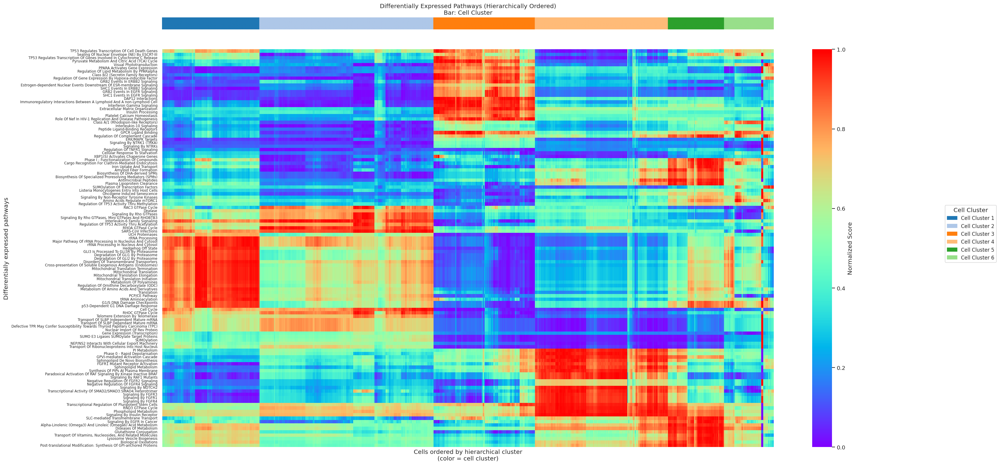

In [ ]:
from scipy.stats import ttest_ind

df_clustered = df_norm.copy()
df_clustered["cell_cluster"] = adata.obs.loc[df_norm.index, "hierarchical_cluster"].astype(str)

# Store results here
top_pathways_by_cluster = {}

for cluster in unique_cell_clusters:
    mask = df_clustered["cell_cluster"] == str(cluster)
    cluster_cells = df_clustered[mask]
    other_cells = df_clustered[~mask]
    t_stats = []
    pvals = []
    for pathway in score_columns:
        t, p = ttest_ind(cluster_cells[pathway], other_cells[pathway], equal_var=False)
        t_stats.append(t)
        pvals.append(p)
    # DataFrame with results
    df_t = pd.DataFrame({
        "pathway": score_columns,
        "t_stat": t_stats,
        "pval": pvals
    })
    # Filter for positive t and p<0.05, top 20
    df_t = df_t[df_t["t_stat"] > 0].sort_values("t_stat", ascending=False).head(20)
    top_pathways_by_cluster[cluster] = df_t

# Show differentially expressed pathways for each cluster
for cluster, df_t in top_pathways_by_cluster.items():
    print(f"\nCluster {cluster} - Top differentially expressed pathways:")
    print(df_t[["pathway", "t_stat", "pval"]].to_string(index=False))

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
from scipy.cluster.hierarchy import linkage, leaves_list
import matplotlib.patches as mpatches

# --- 1. Gather all top pathways from the cell clusters ---
all_top_pathways = sorted(set(
    sum([df_t["pathway"].tolist() for df_t in top_pathways_by_cluster.values()], [])
))

# --- 2. Clean pathway names ---
def clean_pathway(name):
    # Remove patterns like R-HSA-XXXXX-SCORE (including decimals)
    name = re.sub(r'R-HSA-\d+(\.\d+)?-SCORE$', '', name)
    name = re.sub(r'R-HSA-\d+(\.\d+)?', '', name)
    name = re.sub(r'_SCORE$', '', name)
    return name.strip()

all_top_pathways_clean = [clean_pathway(p) for p in all_top_pathways]

# --- 3. Subset of the matrix: ordered cells, selected pathways ---
df_subset = df_norm[all_top_pathways].loc[col_order]

# --- 4. Hierarchical clustering ONLY on the selected pathways ---
linkage_rows_DE = linkage(df_subset.T.values, method="complete")
row_order_idx_DE = leaves_list(linkage_rows_DE)
row_order_DE = df_subset.columns[row_order_idx_DE]

# --- 5. Clean pathway names for the final row order ---
ytick_labels = [clean_pathway(p) for p in row_order_DE]

# --- 6. Color bar for cell cluster on X-axis ---
cell_labels_reordered = [cell_cluster_labels[i] for i in col_order_idx]
unique_cell_clusters = sorted(set(cell_labels_reordered))
palette = sns.color_palette("tab20", len(unique_cell_clusters))
lut = dict(zip([str(i) for i in unique_cell_clusters], palette))
rgb_clusters = np.array([lut[str(i)] for i in cell_labels_reordered]).reshape(1, -1, 3)

# --- 7. Function for the color bar ---
def add_bar(ax, rgb, y_offset=0.01, height=0.03):
    x_start, x_end = ax.get_xlim()
    ax_inset = ax.inset_axes([0, 1 + y_offset, 1, height], transform=ax.transAxes)
    ax_inset.imshow(rgb, aspect="auto", extent=[x_start, x_end, 0, 1])
    ax_inset.axis("off")

# --- 8. Heatmap with small Y labels ---
fig, ax = plt.subplots(figsize=(min(26, 1+0.37*len(all_top_pathways)), 13))
sns.heatmap(
    df_subset[row_order_DE].T,
    cmap="rainbow",
    ax=ax,
    xticklabels=False,    # No cell labels (too many)
    yticklabels=ytick_labels,  # Clean pathway names here
    cbar_kws={"label": "Normalized Score"}
)
ax.set_title("Differentially Expressed Pathways (Hierarchically Ordered)\nBar: Cell Cluster")
add_bar(ax, rgb_clusters, y_offset=0.05, height=0.03)
ax.set_xlabel("Cells ordered by hierarchical cluster\n(color = cell cluster)")
ax.set_ylabel("Differentially expressed pathways")

# --- 9. Make the Y-axis labels small HERE ---
ax.tick_params(axis='y', labelsize=7)  # <--- Adjust Y-axis font size here

# --- 10. Color legend for cell clusters ---
handles_col = [mpatches.Patch(color=lut[str(c)], label=f"Cell Cluster {c}") for c in unique_cell_clusters]
fig.legend(handles=handles_col, title="Cell Cluster", bbox_to_anchor=(1.01, 0.5), loc="center left", fontsize="small")

plt.tight_layout()
plt.show()


In [ ]:
!pip install PyComplexHeatmap


/usr/local/lib/python3.12/dist-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Starting plotting HeatmapAnnotations


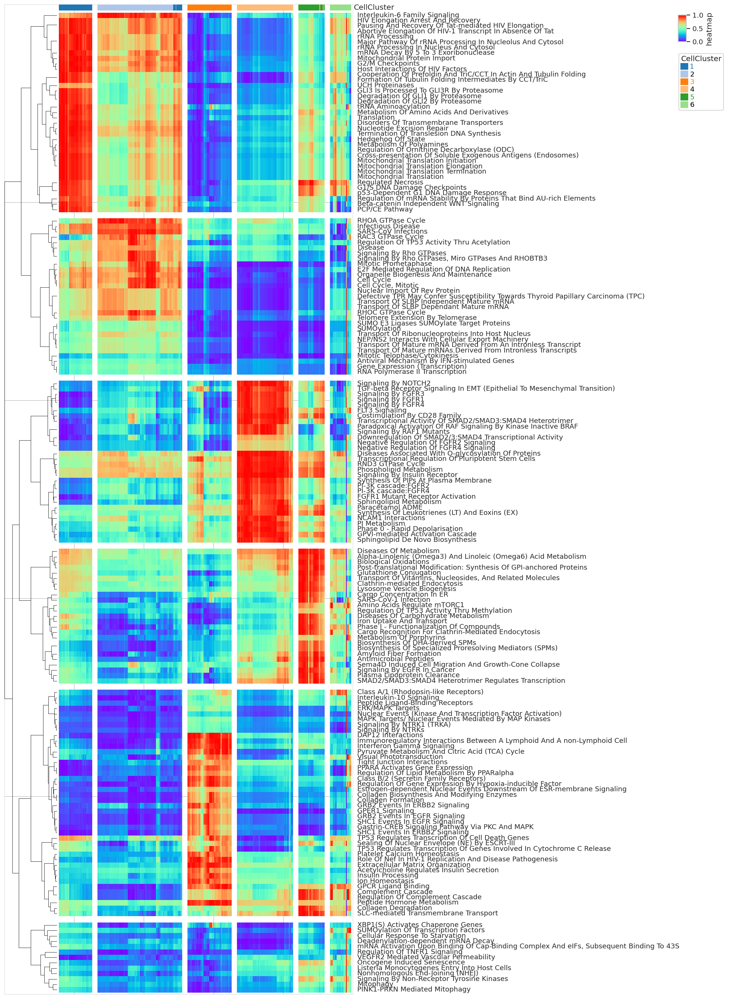

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
from collections import Counter
from scipy.stats import ttest_ind
from scipy.cluster.hierarchy import linkage, leaves_list
import PyComplexHeatmap as pch

# --- 1. Differential T-test per cluster ---
df_clustered = df_norm.copy()
df_clustered["cell_cluster"] = adata.obs.loc[df_norm.index, "hierarchical_cluster"].astype(str)
unique_cell_clusters = sorted(df_clustered["cell_cluster"].unique())

top_pathways_by_cluster = {}
for cluster in unique_cell_clusters:
    mask = df_clustered["cell_cluster"] == str(cluster)
    cluster_cells = df_clustered[mask]
    other_cells = df_clustered[~mask]
    t_stats, pvals = [], []
    for pathway in score_columns:
        t, p = ttest_ind(cluster_cells[pathway], other_cells[pathway], equal_var=False)
        t_stats.append(t)
        pvals.append(p)
    df_t = pd.DataFrame({"pathway": score_columns, "t_stat": t_stats, "pval": pvals})
    df_t = df_t[df_t["t_stat"] > 0].sort_values("t_stat", ascending=False).head(30)
    top_pathways_by_cluster[cluster] = df_t

# --- 2. Merge pathways from all clusters ---
all_top_pathways = sorted(set(
    sum([df_t["pathway"].tolist() for df_t in top_pathways_by_cluster.values()], [])
))

def clean_pathway(name):
    name = re.sub(r'R-HSA-\d+(\.\d+)?-SCORE$', '', name)
    name = re.sub(r'R-HSA-\d+(\.\d+)?', '', name)
    name = re.sub(r'_SCORE$', '', name)
    return name.strip()

# --- 3. Subset pathway/cell matrix and row clustering ---
df_subset = df_norm[all_top_pathways]  # Rows = cells, columns = pathways

# --- 4. Hierarchical clustering order of pathways (heatmap rows) ---
linkage_rows_DE = linkage(df_subset.T.values, method="ward")
row_order_idx_DE = leaves_list(linkage_rows_DE)
row_order_DE = df_subset.columns[row_order_idx_DE]

# --- 5. Unique clean names for labels ---
ytick_labels_raw = [clean_pathway(p) for p in row_order_DE]
counts = Counter(ytick_labels_raw)
ytick_labels, seen = [], {}
for label in ytick_labels_raw:
    seen[label] = seen.get(label, 0) + 1
    ytick_labels.append(f"{label} [{seen[label]}]" if counts[label] > 1 else label)

assert len(ytick_labels) == len(row_order_DE)
assert len(set(ytick_labels)) == len(ytick_labels)

# --- 6. Assign labels to rows of the final matrix (transpose: pathways x cells) ---
mat = df_subset[row_order_DE].T
mat.index = ytick_labels

# --- 7. Colors for the cell clusters ---
cell_clusters = df_clustered["cell_cluster"].loc[mat.columns].astype(str)
cell_palette = sns.color_palette("tab20", len(cell_clusters.unique()))
cell_colors = dict(zip(sorted(cell_clusters.unique()), cell_palette))

col_ha = pch.HeatmapAnnotation(
    CellCluster=pch.anno_simple(cell_clusters, colors=cell_colors, legend=True),
    axis=1
)

# --- 8. Figure size and main plot ---
n_rows = mat.shape[0]
height = 25  # Adjust height depending on number of pathways
width = 10

plt.figure(figsize=(width, height))
cm = pch.ClusterMapPlotter(
    data=mat,
    top_annotation=col_ha,
    show_rownames=True,
    show_colnames=False,
    row_dendrogram=True,
    col_dendrogram=False,

    row_split=6,              # Number of modules for pathways
    row_split_gap=3,

    col_split=6,              # Number of modules for pathways
    col_split_gap=3,

    cmap='rainbow',
    legend=True,
    legend_gap=5,
    legend_vpad=2,
    verbose=0,
    row_cluster_method="ward",
    row_cluster_metric="euclidean",

    col_cluster_method="ward",
    col_cluster_metric="euclidean",

    yticklabels=True,
    row_dendrogram_size=30
)

# --- 9. Adjust heatmap label sizes ---
for label in cm.ax_heatmap.get_yticklabels():
    label.set_visible(True)
    label.set_fontsize(0.02)  # Adjust if you have many pathways

plt.show()


#APLICAR PHATE Y LOS SCORE!

In [ ]:
#adata.obsm['X_phate_normalized']
#adata.obs. si terminan con SCORE <--- de esa manera  <-- visualiza todas las vias score haz un panel de 3 figuras


/tmp/ipython-input-4010202001.py:104: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




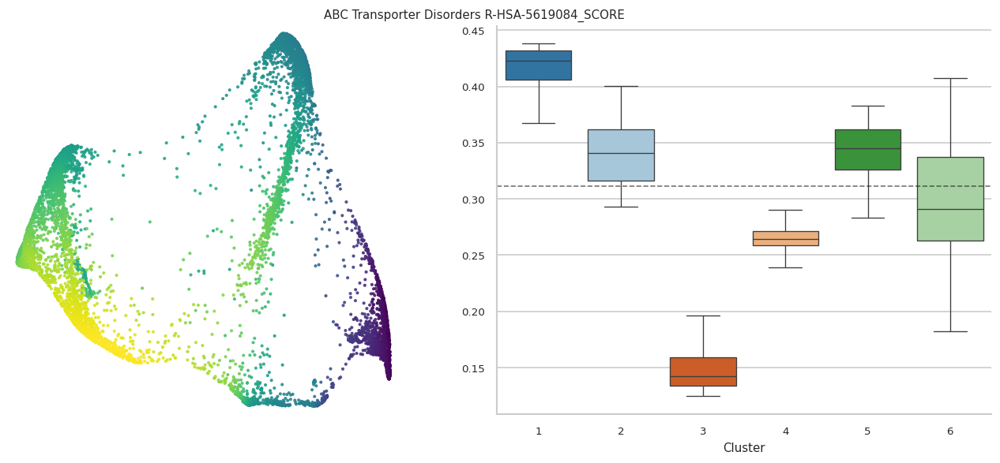

/tmp/ipython-input-4010202001.py:104: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




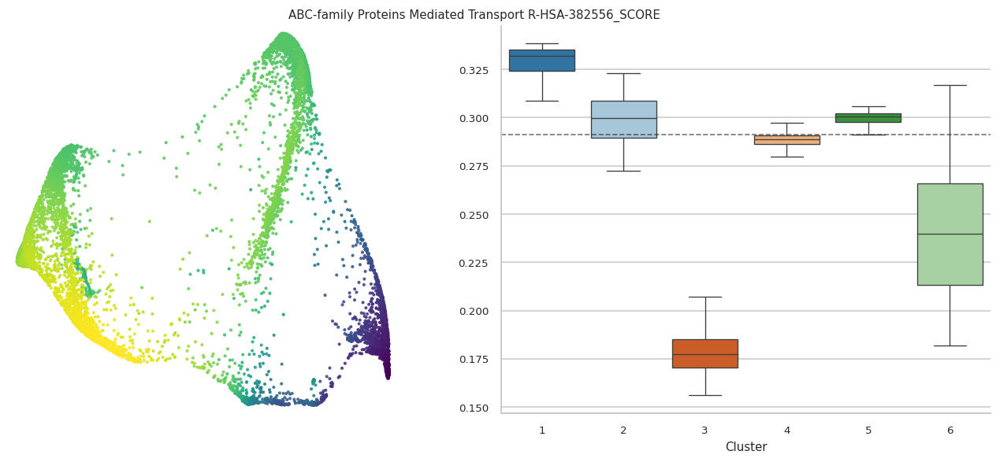

/tmp/ipython-input-4010202001.py:104: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




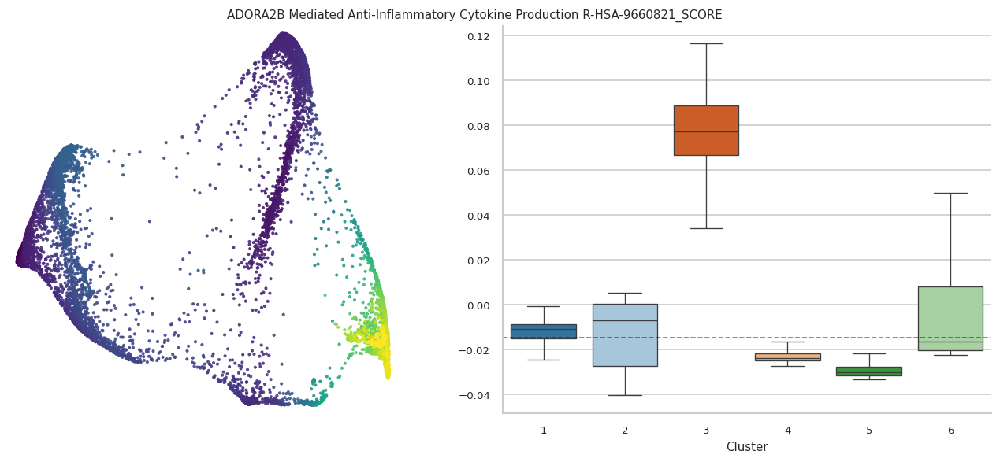

/tmp/ipython-input-4010202001.py:104: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




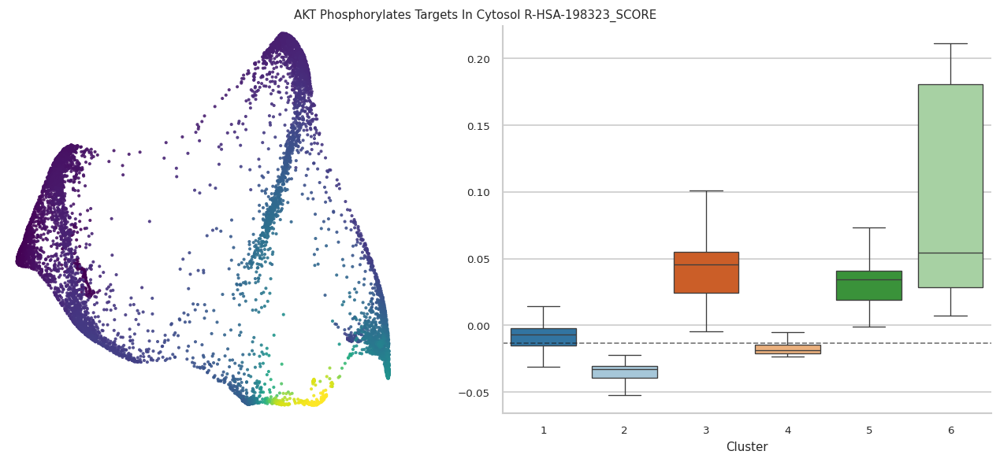

/tmp/ipython-input-4010202001.py:104: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




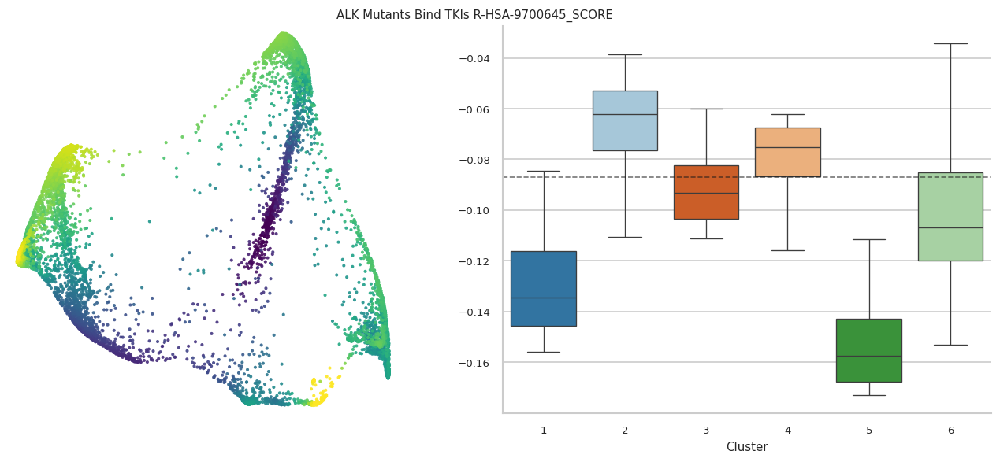

/tmp/ipython-input-4010202001.py:104: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




KeyboardInterrupt: 

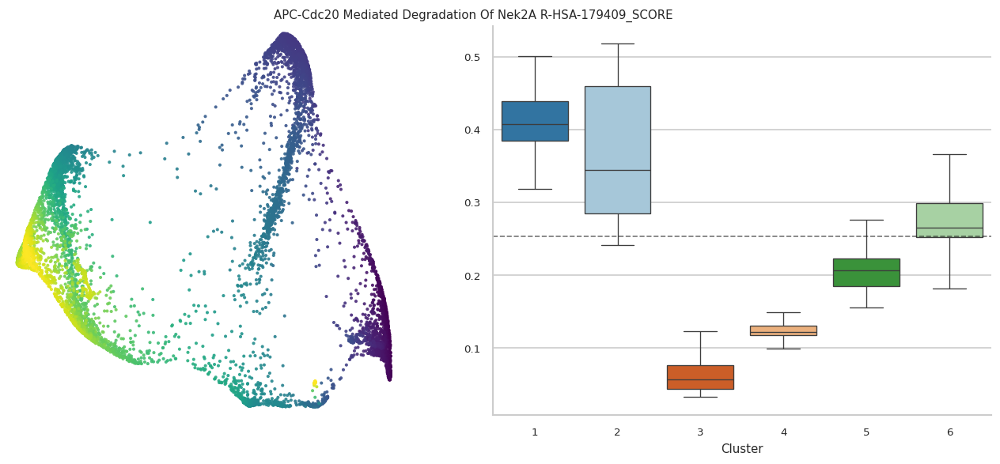

In [66]:
# ==== PHATE ULTRA-MINIMAL + BOXPLOT por clúster (suptítulo arriba, sin ylabel en boxplot) ====
import os, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.colors import Normalize
import matplotlib as mpl

# ---------------- Ajustes ----------------
FIGDIR = "./figs"; os.makedirs(FIGDIR, exist_ok=True)
OUTPDF = os.path.join(FIGDIR, "phate_scores_minimal_PHATE+BOX.pdf")
cluster_col = "hierarchical_cluster"   # requerido para boxplot

# Paleta fija 1–6 para el boxplot
CLUSTER_COLORS_FIXED = {
    "1": "#1f77b4",  # azul oscuro
    "2": "#9ecae1",  # azul claro
    "3": "#e6550d",  # naranja fuerte
    "4": "#fdae6b",  # naranja claro
    "5": "#2ca02c",  # verde oscuro
    "6": "#a1d99b",  # verde claro
}

sns.set_theme(context="notebook", style="whitegrid")
mpl.rcParams["figure.dpi"] = 120

# ---------------- Cargar AnnData ----------------
try:
    ad = adata.copy()
except NameError:
    ad = adata_original.copy()

# PHATE
if "X_phate_normalized" not in ad.obsm:
    raise KeyError("No encuentro adata.obsm['X_phate_normalized'].")
XY = np.asarray(ad.obsm["X_phate_normalized"])
if XY.shape[1] < 2:
    raise ValueError("X_phate_normalized debe tener ≥ 2 dimensiones.")
x_phate, y_phate = XY[:, 0], XY[:, 1]

# Clúster
if cluster_col not in ad.obs.columns:
    raise KeyError(f"No existe '{cluster_col}' en adata.obs.")
ad.obs[cluster_col] = ad.obs[cluster_col].astype(str)
try:
    cluster_order = sorted(ad.obs[cluster_col].unique(), key=lambda s: int(s))
except Exception:
    cluster_order = sorted(ad.obs[cluster_col].unique())
palette_box = {k: CLUSTER_COLORS_FIXED.get(k, "#bdbdbd") for k in cluster_order}

# SCOREs
score_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
if not score_cols:
    raise ValueError("No encontré columnas en adata.obs que terminen con 'SCORE'.")

def robust_limits(v, lo=1, hi=99):
    v = pd.Series(v).replace([np.inf, -np.inf], np.nan).dropna().values
    if v.size == 0: return (0.0, 1.0)
    vmin, vmax = np.percentile(v, [lo, hi]).astype(float)
    if not np.isfinite(vmin): vmin = np.nanmin(v)
    if not np.isfinite(vmax): vmax = np.nanmax(v)
    if vmin == vmax: vmax = vmin + 1e-6
    return vmin, vmax

CMAP_SEQ = "viridis"
POINT_SIZE = 6
POINT_ALPHA = 0.9

with PdfPages(OUTPDF) as pdf:
    for col in score_cols:
        s = pd.to_numeric(ad.obs[col], errors="coerce").astype(float)
        vmin, vmax = robust_limits(s.values, 1, 99)
        norm = Normalize(vmin=vmin, vmax=vmax)
        order = np.argsort(s.fillna(s.median()).values)

        # 1×2: PHATE minimal + BOXPLOT
        fig, axes = plt.subplots(1, 2, figsize=(11, 4.6), constrained_layout=True)
        ax0, ax1 = axes
        fig.patch.set_facecolor("white")

        # PHATE ultra-minimal
        sca = ax0.scatter(
            x_phate[order], y_phate[order],
            c=s.values[order], s=POINT_SIZE, cmap=CMAP_SEQ, norm=norm,
            alpha=POINT_ALPHA, linewidths=0, rasterized=True
        )
        ax0.set_xticks([]); ax0.set_yticks([])
        ax0.set_xlabel(""); ax0.set_ylabel("")
        for sp in ax0.spines.values(): sp.set_visible(False)
        ax0.set_aspect("equal", "box")
        ax0.margins(0.02)
        ax0.set_facecolor("white")

        # Suptítulo un poco más arriba (evita solapar con los gráficos)
        fig.suptitle(col, fontsize=9, y=1.03)

        # BOXPLOT por clúster (sin etiqueta de eje Y)
        plot_df = pd.DataFrame({cluster_col: ad.obs[cluster_col], "score": s}).dropna()
        if plot_df.empty:
            ax1.text(0.5, 0.5, "Sin datos válidos", ha="center", va="center")
        else:
            sns.boxplot(
                data=plot_df, x=cluster_col, y="score",
                order=cluster_order, palette=palette_box,
                showfliers=False, linewidth=0.8, ax=ax1
            )
            med = float(np.nanmedian(plot_df["score"]))
            ax1.axhline(med, color="k", ls="--", lw=1, alpha=0.6)
            ax1.set_xlabel("Cluster", fontsize=9)
            ax1.set_ylabel("")  # <- quitar etiqueta del eje Y
            ax1.spines[["top", "right"]].set_visible(False)
            plt.setp(ax1.get_xticklabels(), rotation=0, ha="center", fontsize=8)
            plt.setp(ax1.get_yticklabels(), fontsize=8)

        # Guardar y mostrar
        pdf.savefig(fig, dpi=300, bbox_inches="tight", pad_inches=0.06)
        plt.show()
        plt.close(fig)

print(f"✅ PDF guardado en: {OUTPDF}")
print(f"Vías detectadas (terminan en 'SCORE'): {len(score_cols)}")


In [57]:
# ==== 1) LISTAR / FILTRAR vías (cols que terminan en SCORE) con PALABRAS CLAVE ====
import re
import numpy as np
import pandas as pd

try:
    ad = adata.copy()
except NameError:
    ad = adata_original.copy()

# ----- Configura tus palabras clave -----
KEYWORDS_INCLUDE = ["glucose",'Glyco','EMT','Epithelial To Mesenchymal Transition','FOXO','gene expression','NOTCH2','Oncogene induce'
]
MATCH_MODE = "any"   # "any" = contiene CUALQUIERA; "all" = contiene TODAS
KEYWORDS_EXCLUDE = [
    # ej: "mouse", "test"
]

def _norm(s: str) -> str:
    return re.sub(r"\s+", " ", str(s).lower())

# Detecta columnas SCORE (insensible a mayúsculas)
ALL_SCORES = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
if not ALL_SCORES:
    raise ValueError("No encontré columnas en adata.obs que terminen con 'SCORE'.")

# --- Filtro por palabras clave ---
if KEYWORDS_INCLUDE:
    inc = [k.lower() for k in KEYWORDS_INCLUDE]
    if MATCH_MODE not in {"any", "all"}:
        raise ValueError("MATCH_MODE debe ser 'any' o 'all'.")
    def keep(col):
        col_n = _norm(col)
        has_inc = (any(k in col_n for k in inc) if MATCH_MODE=="any"
                   else all(k in col_n for k in inc))
        if not has_inc:
            return False
        if KEYWORDS_EXCLUDE:
            exc = [k.lower() for k in KEYWORDS_EXCLUDE]
            if any(k in col_n for k in exc):
                return False
        return True
    FILTERED_SCORES = [c for c in ALL_SCORES if keep(c)]
else:
    # sin keywords -> no filtrar
    FILTERED_SCORES = sorted(ALL_SCORES)

# Imprime listas
print(f"Total vías (SCORE): {len(ALL_SCORES)}")
print(f"Vías tras filtro: {len(FILTERED_SCORES)}\n")
for i, c in enumerate(sorted(FILTERED_SCORES)):
    print(f"{i:>3d}: {c}")

# Úsalo después en el panel:
SELECTED_SCORES = sorted(FILTERED_SCORES)
# Ejemplo: si quieres ajustar manualmente, edita SELECTED_SCORES después de ver la lista.


Total vías (SCORE): 966
Vías tras filtro: 31

  0: Activation Of Gene Expression By SREBF (SREBP) R-HSA-2426168_SCORE
  1: Asparagine N-linked Glycosylation R-HSA-446203_SCORE
  2: BMAL1:CLOCK,NPAS2 Activates Circadian Gene Expression R-HSA-1368108_SCORE
  3: Diseases Associated With Glycosaminoglycan Metabolism R-HSA-3560782_SCORE
  4: Diseases Associated With O-glycosylation Of Proteins R-HSA-3906995_SCORE
  5: Diseases Of Glycosylation R-HSA-3781865_SCORE
  6: Epigenetic Regulation Of Gene Expression R-HSA-212165_SCORE
  7: Estrogen-dependent Gene Expression R-HSA-9018519_SCORE
  8: FOXO-mediated Transcription Of Cell Cycle Genes R-HSA-9617828_SCORE
  9: FOXO-mediated Transcription Of Cell Death Genes R-HSA-9614657_SCORE
 10: FOXO-mediated Transcription Of Oxidative Stress, Metabolic And Neuronal Genes R-HSA-9615017_SCORE
 11: FOXO-mediated Transcription R-HSA-9614085_SCORE
 12: Gene Expression (Transcription) R-HSA-74160_SCORE
 13: Glucose Metabolism R-HSA-70326_SCORE
 14: Glycogen

In [ ]:
SELECTED_SCORES =

['Asparagine N-linked Glycosylation R-HSA-446203_SCORE',
 'Diseases Associated With Glycosaminoglycan Metabolism R-HSA-3560782_SCORE',
 'Diseases Associated With O-glycosylation Of Proteins R-HSA-3906995_SCORE',
 'Diseases Of Glycosylation R-HSA-3781865_SCORE',
 'Glucose Metabolism R-HSA-70326_SCORE',
 'Glycogen Metabolism R-HSA-8982491_SCORE',
 'Glycolysis R-HSA-70171_SCORE',
 'Glycosaminoglycan Metabolism R-HSA-1630316_SCORE',
 'Glycosphingolipid Metabolism R-HSA-1660662_SCORE',
 'O-glycosylation Of TSR Domain-Containing Proteins R-HSA-5173214_SCORE',
 'O-linked Glycosylation Of Mucins R-HSA-913709_SCORE',
 'O-linked Glycosylation R-HSA-5173105_SCORE',
 'Regulation Of Glycolysis By Fructose 2,6-Bisphosphate Metabolism R-HSA-9634600_SCORE']

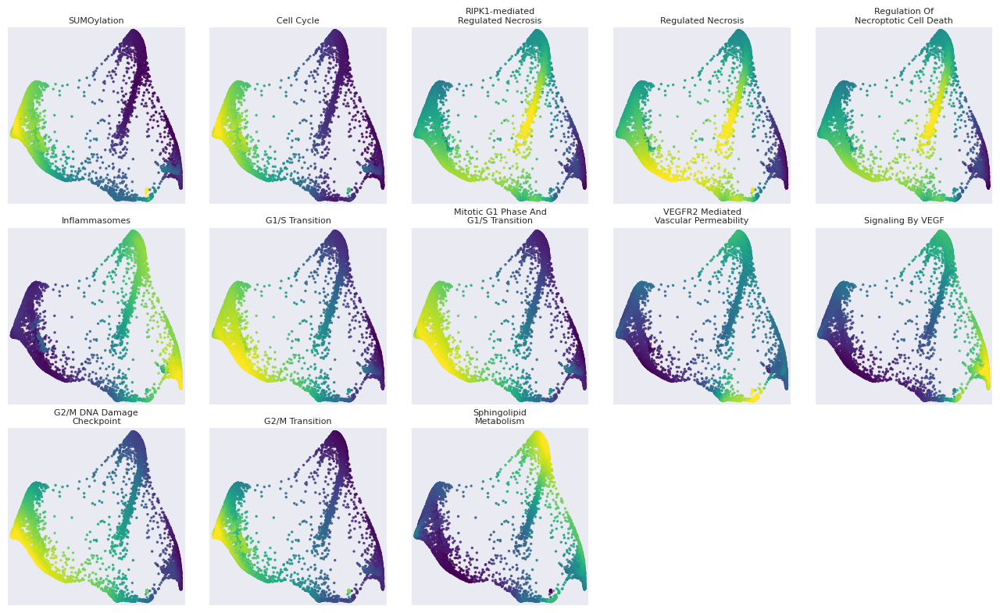

✅ PDF guardado en: ./figs/phate_panel_selected_scores_wrapped.pdf


In [65]:
import re, textwrap

def wrap_title(s, width=22, max_lines=3, add_ellipsis=True):
    """
    Limpia y envuelve el título en varias líneas.
    - width: nº máx. de caracteres por línea
    - max_lines: nº máx. de líneas
    """
    s = str(s)
    s = re.sub(r"\s*SCORE\s*$", "", s, flags=re.I)            # quita 'SCORE' final
    s = re.sub(r"R-HSA-\d+(\.\d+)?", "", s, flags=re.I)       # quita IDs Reactome
    s = s.replace("_", " ")
    s = re.sub(r"\s+", " ", s).strip()

    lines = textwrap.wrap(s, width=width, break_long_words=False, break_on_hyphens=False)
    if len(lines) > max_lines:
        lines = lines[:max_lines]
        if add_ellipsis:
            lines[-1] = lines[-1].rstrip(".") + "…"
    return "\n".join(lines)


# === Panel PHATE minimalista con títulos envueltos ===
import os, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.colors import Normalize

N_COLS = 5
CMAP_SEQ = "viridis"
POINT_SIZE = 6
POINT_ALPHA = 0.9
TITLE_WIDTH = 22      # <= ajusta a tu gusto
TITLE_MAX_LINES = 3
FIGDIR = "./figs"; os.makedirs(FIGDIR, exist_ok=True)
OUTPDF = os.path.join(FIGDIR, "phate_panel_selected_scores_wrapped.pdf")

try:
    ad = adata.copy()
except NameError:
    ad = adata_original.copy()

if "X_phate_normalized" not in ad.obsm:
    raise KeyError("No encuentro adata.obsm['X_phate_normalized'].")
XY = np.asarray(ad.obsm["X_phate_normalized"])
x_phate, y_phate = XY[:, 0], XY[:, 1]

# Si no definiste SELECTED_SCORES antes, toma todas (o filtradas) como fallback:
if "SELECTED_SCORES" not in globals() or not SELECTED_SCORES:
    SELECTED_SCORES = sorted([c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)])

def robust_limits(v, lo=1, hi=99):
    v = pd.Series(v, dtype=float).replace([np.inf, -np.inf], np.nan).dropna().values
    if v.size == 0: return (0.0, 1.0)
    vmin, vmax = np.percentile(v, [lo, hi]).astype(float)
    if not np.isfinite(vmin): vmin = np.nanmin(v)
    if not np.isfinite(vmax): vmax = np.nanmax(v)
    if vmin == vmax: vmax = vmin + 1e-6
    return vmin, vmax

K = len(SELECTED_SCORES)
N_ROWS = (K + N_COLS - 1) // N_COLS
fig_w, fig_h = 2.6 * N_COLS, 2.6 * N_ROWS

with PdfPages(OUTPDF) as pdf:
    fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(fig_w, fig_h))
    axes = np.atleast_1d(axes).ravel()
    for ax in axes[K:]:
        ax.set_visible(False)

    for ax, col in zip(axes, SELECTED_SCORES):
        s = pd.to_numeric(ad.obs[col], errors="coerce").astype(float)
        vmin, vmax = robust_limits(s.values, 1, 99)
        norm = Normalize(vmin=vmin, vmax=vmax)
        order = np.argsort(s.fillna(np.nanmedian(s)).values)

        ax.scatter(
            x_phate[order], y_phate[order],
            c=s.values[order], s=POINT_SIZE,
            cmap=CMAP_SEQ, norm=norm,
            alpha=POINT_ALPHA, linewidths=0, rasterized=True
        )
        ax.set_xticks([]); ax.set_yticks([])
        ax.set_xlabel(""); ax.set_ylabel("")
        for sp in ax.spines.values(): sp.set_visible(False)
        ax.set_aspect("equal", "box")
        ax.margins(0.02)
        # <<< aquí envolvemos el título >>>
        ax.set_title(wrap_title(col, width=TITLE_WIDTH, max_lines=TITLE_MAX_LINES), fontsize=8, pad=4)

    plt.tight_layout(pad=0.6)
    plt.show()
    pdf.savefig(fig, dpi=300, bbox_inches="tight", pad_inches=0.05)
    plt.close(fig)

print(f"✅ PDF guardado en: {OUTPDF}")


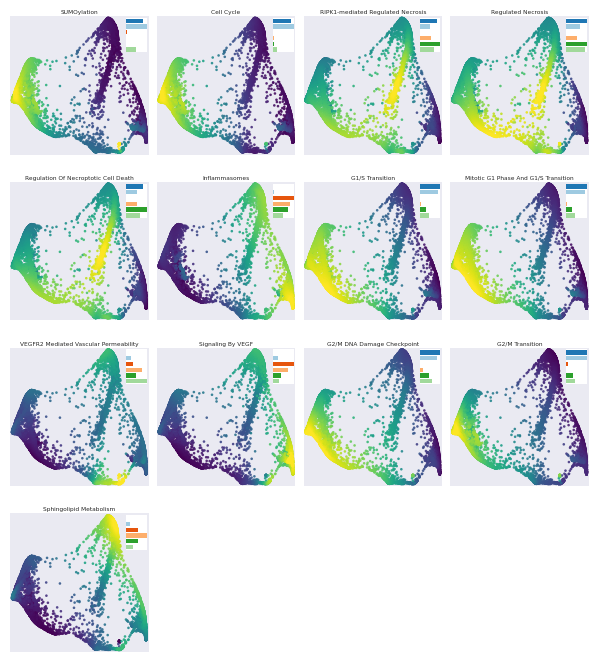

✅ Guardado: ./figs/phate_panel_ultra_delgado.pdf


In [64]:
# === PHATE ULTRA-DELGADO + mini-barras por clúster (1–6) ===
import os, re, textwrap
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# ---------- parámetros ----------
N_COLS = 4
PT_SZ = 3.5           # <- un poco más grande para PDF
PT_ALPHA = 0.9
CMAP = "viridis"
TITLE_WIDTH = 80
TITLE_LINES = 2
TITLE_FONTSIZE = 4.2
FIG_CELL_W = 1.35
FIG_CELL_H = 1.75
WSPACE = 0.06
HSPACE = 0.08
PDF_DPI = 400         # <- 300–600 es lo más estable
MINIBAR_W = "15%"
MINIBAR_H = "25%"
MINIBAR_BORDERPAD = 0.15
RASTERIZE_AXES = True # <- rasteriza el eje (no el scatter)

FIGDIR = "./figs"; os.makedirs(FIGDIR, exist_ok=True)
OUTPDF = os.path.join(FIGDIR, "phate_panel_ultra_delgado.pdf")
cluster_col = "hierarchical_cluster"

# Paleta fija 1–6
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}
CL_ORDER = ["1","2","3","4","5","6"]
GRAY = "#bdbdbd"

def wrap_title(s, width=16, max_lines=2):
    s = re.sub(r"\s*SCORE\s*$", "", str(s), flags=re.I)
    s = re.sub(r"R-HSA-\d+(\.\d+)?", "", s, flags=re.I)
    s = re.sub(r"\s+", " ", s.replace("_", " ")).strip()
    lines = textwrap.wrap(s, width=width, break_long_words=False, break_on_hyphens=False)
    if len(lines) > max_lines:
        lines = lines[:max_lines]; lines[-1] = lines[-1].rstrip(".")+"…"
    return "\n".join(lines)

def robust_limits(v, lo=1, hi=99):
    v = pd.Series(v, dtype=float).replace([np.inf,-np.inf], np.nan).dropna().values
    if v.size == 0: return (0.0,1.0)
    vmin, vmax = np.percentile(v, [lo, hi]).astype(float)
    if vmin == vmax: vmax = vmin + 1e-6
    return vmin, vmax

def add_cluster_minibar(ax, clusters_ser, scores_ser):
    df = pd.DataFrame({"cluster":clusters_ser.astype(str).values,
                       "val":pd.to_numeric(scores_ser, errors="coerce").values}).dropna()
    if df.empty: return
    means = df.groupby("cluster")["val"].mean()
    vals = np.array([means.get(c, np.nan) for c in CL_ORDER], float)
    if np.all(np.isnan(vals)): return
    mmin, mmax = np.nanmin(vals), np.nanmax(vals)
    norm = (vals - mmin)/(mmax - mmin) if mmax > mmin else np.full_like(vals, 0.5)
    colors = [CL_COL.get(c, GRAY) for c in CL_ORDER]

    inset = inset_axes(ax, width=MINIBAR_W, height=MINIBAR_H,
                       loc="upper right", borderpad=MINIBAR_BORDERPAD)
    y = np.arange(len(CL_ORDER))[::-1]
    inset.barh(y, norm, color=colors, edgecolor="none", height=0.75)
    inset.set_xlim(0,1); inset.set_ylim(-0.5, len(y)-0.5)
    inset.set_xticks([]); inset.set_yticks([])
    for sp in inset.spines.values(): sp.set_visible(False)
    inset.set_facecolor("white")

# ------- datos -------
try:
    ad = adata.copy()
except NameError:
    ad = adata_original.copy()

if "X_phate_normalized" not in ad.obsm:
    raise KeyError("Falta adata.obsm['X_phate_normalized'].")
XY = np.asarray(ad.obsm["X_phate_normalized"])
x_phate, y_phate = XY[:,0], XY[:,1]

if cluster_col not in ad.obs.columns:
    raise KeyError(f"Falta '{cluster_col}' en ad.obs.")
ad.obs[cluster_col] = ad.obs[cluster_col].astype(str)

# Vías seleccionadas (si no hay, primeras 10 que terminen en SCORE)
if "SELECTED_SCORES" not in globals() or not SELECTED_SCORES:
    import re
    SELECTED_SCORES = sorted([c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)])[:10]

K = len(SELECTED_SCORES)
N_ROWS = (K + N_COLS - 1)//N_COLS
fig_w = max(6.0, FIG_CELL_W * N_COLS)
fig_h = max(3.2, FIG_CELL_H * N_ROWS)

with PdfPages(OUTPDF) as pdf:
    fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(fig_w, fig_h))
    axes = np.atleast_1d(axes).ravel()
    for ax in axes[K:]:
        ax.set_visible(False)

    for ax, col in zip(axes, SELECTED_SCORES):
        s = pd.to_numeric(ad.obs[col], errors="coerce").astype(float)
        vmin, vmax = robust_limits(s.values, 1, 99)
        norm = Normalize(vmin=vmin, vmax=vmax)

        order = np.argsort(s.fillna(np.nanmedian(s)).values)

        # Rasteriza el eje completo por debajo de cierto zorder
        if RASTERIZE_AXES:
            ax.set_rasterization_zorder(1)

        ax.scatter(x_phate[order], y_phate[order],
                   c=s.values[order], s=PT_SZ, cmap=CMAP, norm=norm,
                   alpha=PT_ALPHA, linewidths=0, zorder=2)  # <- sin rasterized=True

        ax.set_xticks([]); ax.set_yticks([]); ax.set_xlabel(""); ax.set_ylabel("")
        for sp in ax.spines.values(): sp.set_visible(False)
        ax.set_aspect("equal", "box"); ax.margins(0.015)

        add_cluster_minibar(ax, ad.obs[cluster_col], s)
        ax.set_title(wrap_title(col, TITLE_WIDTH, TITLE_LINES),
                     fontsize=TITLE_FONTSIZE, pad=2.0)

    plt.subplots_adjust(left=0.02, right=0.985, top=0.97, bottom=0.04,
                        wspace=WSPACE, hspace=HSPACE)

    # GUARDA PRIMERO (para que no se “pierda” la capa raster)
    pdf.savefig(fig, dpi=PDF_DPI, bbox_inches="tight", pad_inches=0.02)
    # y luego muestra si quieres verlo en el notebook
    plt.show()
    plt.close(fig)

print(f"✅ Guardado: {OUTPDF}")


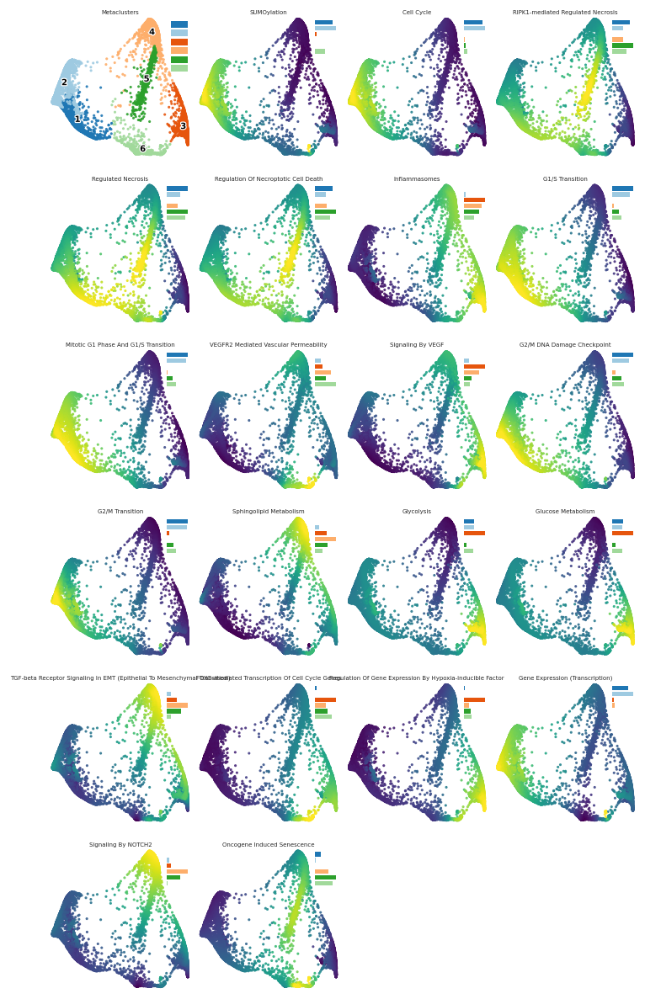

✅ Guardado: ./figs/phate_panel_ultra_delgado.pdf


In [69]:
# === PHATE ULTRA-DELGADO + mini-barras por clúster (1–6) + PANEL DE CLÚSTERES ===
import os, re, textwrap
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# ---------- parámetros ----------
N_COLS = 4
PT_SZ = 3.5
PT_ALPHA = 0.9
CMAP = "viridis"
TITLE_WIDTH = 80
TITLE_LINES = 2
TITLE_FONTSIZE = 4.2
FIG_CELL_W = 1.35
FIG_CELL_H = 1.75
WSPACE = 0.06
HSPACE = 0.08
PDF_DPI = 400
MINIBAR_W = "15%"
MINIBAR_H = "25%"
MINIBAR_BORDERPAD = 0.15
RASTERIZE_AXES = True

# NUEVO: mostrar panel de clústeres al inicio
SHOW_CLUSTER_PANEL = True
CLUSTER_PANEL_TITLE = "Metaclusters"

FIGDIR = "./figs"; os.makedirs(FIGDIR, exist_ok=True)
OUTPDF = os.path.join(FIGDIR, "phate_panel_ultra_delgado.pdf")
cluster_col = "hierarchical_cluster"

# Paleta fija 1–6
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}
CL_ORDER = ["1","2","3","4","5","6"]
GRAY = "#bdbdbd"

def wrap_title(s, width=16, max_lines=2):
    s = re.sub(r"\s*SCORE\s*$", "", str(s), flags=re.I)
    s = re.sub(r"R-HSA-\d+(\.\d+)?", "", s, flags=re.I)
    s = re.sub(r"\s+", " ", s.replace("_", " ")).strip()
    lines = textwrap.wrap(s, width=width, break_long_words=False, break_on_hyphens=False)
    if len(lines) > max_lines:
        lines = lines[:max_lines]; lines[-1] = lines[-1].rstrip(".")+"…"
    return "\n".join(lines)

def robust_limits(v, lo=1, hi=99):
    v = pd.Series(v, dtype=float).replace([np.inf,-np.inf], np.nan).dropna().values
    if v.size == 0: return (0.0,1.0)
    vmin, vmax = np.percentile(v, [lo, hi]).astype(float)
    if vmin == vmax: vmax = vmin + 1e-6
    return vmin, vmax

def add_cluster_minibar(ax, clusters_ser, scores_ser):
    df = pd.DataFrame({"cluster":clusters_ser.astype(str).values,
                       "val":pd.to_numeric(scores_ser, errors="coerce").values}).dropna()
    if df.empty: return
    means = df.groupby("cluster")["val"].mean()
    vals = np.array([means.get(c, np.nan) for c in CL_ORDER], float)
    if np.all(np.isnan(vals)): return
    mmin, mmax = np.nanmin(vals), np.nanmax(vals)
    norm = (vals - mmin)/(mmax - mmin) if mmax > mmin else np.full_like(vals, 0.5)
    colors = [CL_COL.get(c, GRAY) for c in CL_ORDER]

    inset = inset_axes(ax, width=MINIBAR_W, height=MINIBAR_H,
                       loc="upper right", borderpad=MINIBAR_BORDERPAD)
    y = np.arange(len(CL_ORDER))[::-1]
    inset.barh(y, norm, color=colors, edgecolor="none", height=0.75)
    inset.set_xlim(0,1); inset.set_ylim(-0.5, len(y)-0.5)
    inset.set_xticks([]); inset.set_yticks([])
    for sp in inset.spines.values(): sp.set_visible(False)
    inset.set_facecolor("white")

# NUEVO: panel de PHATE coloreado por clúster + mini-leyenda de colores
# === NUEVO: panel de PHATE coloreado por clúster + centroides ===
def draw_cluster_panel(ax, x, y, clust_ser):
    # Orden estable
    order_idx = np.argsort(clust_ser.values.astype(str))
    cvals = clust_ser.astype(str).values[order_idx]
    colors = np.array([CL_COL.get(c, GRAY) for c in cvals])

    if RASTERIZE_AXES:
        ax.set_rasterization_zorder(1)

    # Scatter PHATE coloreado
    ax.scatter(x[order_idx], y[order_idx],
               c=colors, s=PT_SZ, alpha=PT_ALPHA,
               linewidths=0, zorder=2)

    # Quitar etiquetas de ejes
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_xlabel(""); ax.set_ylabel("")
    for sp in ax.spines.values(): sp.set_visible(False)
    ax.set_aspect("equal", "box"); ax.margins(0.015)
    ax.set_title(CLUSTER_PANEL_TITLE, fontsize=TITLE_FONTSIZE, pad=2.0)

    # --- CENTROIDES con nombre de clúster ---
    df_xy = pd.DataFrame({"x":x, "y":y, "cl":clust_ser.astype(str)})
    centroids = df_xy.groupby("cl")[["x","y"]].mean()
    for cl, (cx, cy) in centroids.iterrows():
        ax.text(cx, cy, cl,
                color="black", fontsize=6, weight="bold",
                ha="center", va="center",
                path_effects=[plt.matplotlib.patheffects.withStroke(linewidth=1.5, foreground="white")])

    # mini-leyenda vertical compacta (colores 1–6)
    leg = inset_axes(ax, width="12%", height="38%", loc="upper right", borderpad=0.18)
    yb = np.arange(len(CL_ORDER))[::-1]
    leg.barh(yb, np.ones_like(yb), color=[CL_COL[c] for c in CL_ORDER], edgecolor="none", height=0.75)
    leg.set_xlim(0,1); leg.set_ylim(-0.5, len(yb)-0.5)
    leg.set_xticks([]); leg.set_yticks([])
    for sp in leg.spines.values(): sp.set_visible(False)
    leg.set_facecolor("white")

# ------- datos -------
try:
    ad = adata.copy()
except NameError:
    ad = adata_original.copy()

if "X_phate_normalized" not in ad.obsm:
    raise KeyError("Falta adata.obsm['X_phate_normalized'].")
XY = np.asarray(ad.obsm["X_phate_normalized"])
x_phate, y_phate = XY[:,0], XY[:,1]

if cluster_col not in ad.obs.columns:
    raise KeyError(f"Falta '{cluster_col}' en ad.obs.")
ad.obs[cluster_col] = ad.obs[cluster_col].astype(str)

# Vías seleccionadas (si no hay, primeras 10 que terminen en SCORE)
if "SELECTED_SCORES" not in globals() or not SELECTED_SCORES:
    import re
    SELECTED_SCORES = sorted([c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)])[:10]

K = len(SELECTED_SCORES)
EXTRA = 1 if SHOW_CLUSTER_PANEL else 0
TOTAL = K + EXTRA
N_ROWS = (TOTAL + N_COLS - 1)//N_COLS

fig_w = max(6.0, FIG_CELL_W * N_COLS)
fig_h = max(3.2, FIG_CELL_H * N_ROWS)

with PdfPages(OUTPDF) as pdf:
    fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(fig_w, fig_h))
    axes = np.atleast_1d(axes).ravel()

    # Oculta ejes sobrantes
    for ax in axes[TOTAL:]:
        ax.set_visible(False)

    cur_idx = 0

    # === (0) PANEL DE CLÚSTERES ===
    if SHOW_CLUSTER_PANEL:
        ax = axes[cur_idx]
        draw_cluster_panel(ax, x_phate, y_phate, ad.obs[cluster_col])
        cur_idx += 1

    # === (1..K) PANELES DE VÍAS ===
    for col in SELECTED_SCORES:
        ax = axes[cur_idx]
        s = pd.to_numeric(ad.obs[col], errors="coerce").astype(float)
        vmin, vmax = robust_limits(s.values, 1, 99)
        norm = Normalize(vmin=vmin, vmax=vmax)

        order = np.argsort(s.fillna(np.nanmedian(s)).values)

        if RASTERIZE_AXES:
            ax.set_rasterization_zorder(1)

        ax.scatter(x_phate[order], y_phate[order],
                   c=s.values[order], s=PT_SZ, cmap=CMAP, norm=norm,
                   alpha=PT_ALPHA, linewidths=0, zorder=2)

        ax.set_xticks([]); ax.set_yticks([]); ax.set_xlabel(""); ax.set_ylabel("")
        for sp in ax.spines.values(): sp.set_visible(False)
        ax.set_aspect("equal", "box"); ax.margins(0.015)

        add_cluster_minibar(ax, ad.obs[cluster_col], s)
        ax.set_title(wrap_title(col, TITLE_WIDTH, TITLE_LINES),
                     fontsize=TITLE_FONTSIZE, pad=2.0)

        cur_idx += 1
        if cur_idx >= len(axes): break

    plt.subplots_adjust(left=0.02, right=0.985, top=0.97, bottom=0.04,
                        wspace=WSPACE, hspace=HSPACE)

    pdf.savefig(fig, dpi=PDF_DPI, bbox_inches="tight", pad_inches=0.02)
    plt.show()
    plt.close(fig)

print(f"✅ Guardado: {OUTPDF}")


In [ ]:
# --- PHATE interactivo (Plotly) con hover de IDs ---
import re
import numpy as np
import pandas as pd
import plotly.express as px

# Usa tu AnnData: adata o adata_original
ad = adata.copy()  # o adata_original.copy()

# PHATE embebido
if "X_phate_normalized" not in ad.obsm:
    raise KeyError("Falta adata.obsm['X_phate_normalized'].")
XY = np.asarray(ad.obsm["X_phate_normalized"])
df = pd.DataFrame({
    "PHATE1": XY[:, 0],
    "PHATE2": XY[:, 1],
    "cell_id": ad.obs_names.astype(str).values
})

# Columna de color (elige una)
score_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
if "hierarchical_cluster" in ad.obs.columns:
    df["hierarchical_cluster"] = ad.obs["hierarchical_cluster"].astype(str).values

# >>> Cambia aquí: 'hierarchical_cluster' o alguna de score_cols <<<
color_by = "hierarchical_cluster" if "hierarchical_cluster" in df.columns else (score_cols[0] if score_cols else None)
if color_by is not None and color_by not in df.columns:
    df[color_by] = pd.to_numeric(ad.obs[color_by], errors="coerce")

# Paleta fija para clústeres 1–6 (si aplica)
cluster_colors = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}

fig = px.scatter(
    df, x="PHATE1", y="PHATE2",
    color=color_by,                        # puede ser None
    color_discrete_map=cluster_colors,     # solo afecta si es categórico (clusters)
    color_continuous_scale="Viridis",      # si es continuo (SCORE)
    hover_name="cell_id",                  # grande en el tooltip
    hover_data={
        "cell_id": False,                  # ya va en hover_name
        "PHATE1": ':.3f',
        "PHATE2": ':.3f',
        color_by: True if color_by else False
    },
)

# Estética y tamaño de puntos
fig.update_traces(marker=dict(size=4, opacity=0.9, line=dict(width=0)))
fig.update_layout(
    template="simple_white",
    xaxis_title="", yaxis_title="",
    legend_title_text=(color_by or ""),
    dragmode="pan",
    height=600, width=700,
    margin=dict(l=10, r=10, t=30, b=10),
)
fig.update_xaxes(showgrid=False, zeroline=False)
fig.update_yaxes(showgrid=False, zeroline=False, scaleanchor="x", scaleratio=1)

fig.show()

# --- Nota ---
# Cambia 'color_by' a cualquier columna de 'score_cols' para colorear por esa vía:
#   color_by = score_cols[0]  # por ejemplo
# y vuelve a ejecutar desde la creación de 'fig'.


In [ ]:
"3683", "12163" ,'7899',""

In [62]:
# ====== PALETA DEL USUARIO ======
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}

import re, numpy as np, pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.spatial import ConvexHull

def _merge_palette_with_auto(categories, base_pal=None):
    cats = pd.Index(categories).astype(str)
    pal = {}
    if base_pal:
        pal.update({str(k): v for k, v in base_pal.items()})
    missing = [c for c in cats if c not in pal]
    if missing:
        pool = []
        for name in ["Plotly", "D3", "Set3", "G10", "T10", "Alphabet", "Dark24", "Light24"]:
            pool += getattr(px.colors.qualitative, name)
        for i, cat in enumerate(missing):
            pal[cat] = pool[i % len(pool)]
    return pal

def _detect_meta_cluster_col(ad, preferred=None):
    for c in [preferred, "meta_cluster", "metacluster", "meta_cluster_id",
              "metacluster_id", "metacluster_label", "hierarchical_metacluster",
              "hierarchical_cluster"]:
        if c and c in ad.obs.columns:
            return c
    return None

def _pca3d_scores_df(ad, score_cols=None, standardize=True, min_var=1e-12, store_key="X_pca_scores"):
    if score_cols is None:
        score_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
    if not score_cols:
        raise ValueError("No se encontraron *_SCORE en ad.obs.")
    df_scores = ad.obs[score_cols].apply(pd.to_numeric, errors="coerce").apply(lambda s: s.fillna(s.median()), axis=0)
    keep = (df_scores.var(axis=0).values > float(min_var))
    if keep.sum() < 3: raise ValueError("Quedan <3 scores con var>0.")
    df_scores = df_scores.loc[:, keep]
    X = df_scores.values
    if standardize:
        X = StandardScaler().fit_transform(X)
    pca = PCA(n_components=3, random_state=0)
    Xp = pca.fit_transform(X)
    ad.obsm[store_key] = Xp
    df_plot = pd.DataFrame({"PC1":Xp[:,0], "PC2":Xp[:,1], "PC3":Xp[:,2], "cell_id":ad.obs_names.astype(str).values})
    return df_plot, list(df_scores.columns), pca

def pca3d_with_metaclusters(
    ad,
    score_cols=None,
    meta_cluster_col=None,
    palette=CL_COL,
    show_centroids=True,
    show_hulls=False,          # <- AHORA OPCIONAL (por defecto: NO dibuja hulls)
    hull_alpha=0.08,
    min_points_for_hull=12,
    pathway_col=None,
    height=650, width=820,
):
    df_plot, used_scores, pca = _pca3d_scores_df(ad, score_cols=score_cols, standardize=True)
    mc_col = _detect_meta_cluster_col(ad, preferred=meta_cluster_col)
    if mc_col is None: raise ValueError("No encontré meta-clúster/clúster en ad.obs.")
    df_plot[mc_col] = ad.obs[mc_col].astype(str).values

    cats = pd.Index(df_plot[mc_col].unique()).astype(str).sort_values()
    pal = _merge_palette_with_auto(cats, base_pal=palette)

    # --- Figura A: por metaclúster
    figA = px.scatter_3d(
        df_plot, x="PC1", y="PC2", z="PC3",
        color=mc_col, color_discrete_map=pal,
        hover_name="cell_id",
        hover_data={"cell_id":False, "PC1":":.3f","PC2":":.3f","PC3":":.3f", mc_col:True},
        title=(f"PCA 3D de SCORES — color: {mc_col} "
               f"(var expl.: {100*pca.explained_variance_ratio_[0]:.1f}%, "
               f"{100*pca.explained_variance_ratio_[1]:.1f}%, "
               f"{100*pca.explained_variance_ratio_[2]:.1f}%)")
    )
    figA.update_traces(marker=dict(size=3.8, opacity=0.9, line=dict(width=0)))
    figA.update_layout(template="simple_white",
        legend_title_text=mc_col,
        scene=dict(xaxis_title="PC1", yaxis_title="PC2", zaxis_title="PC3",
                   xaxis=dict(showgrid=False, zeroline=False),
                   yaxis=dict(showgrid=False, zeroline=False),
                   zaxis=dict(showgrid=False, zeroline=False),
                   aspectmode="data"),
        height=height, width=width, margin=dict(l=10, r=10, t=40, b=10)
    )

    # Centroides
    if show_centroids:
        for cat in cats:
            P = df_plot.loc[df_plot[mc_col]==cat, ["PC1","PC2","PC3"]].to_numpy()
            cX = P.mean(axis=0)
            figA.add_trace(go.Scatter3d(
                x=[cX[0]], y=[cX[1]], z=[cX[2]],
                mode="markers+text",
                marker=dict(size=8, color=pal[str(cat)], opacity=1.0),
                text=[str(cat)], textposition="top center",
                name=f"centro {cat}", showlegend=False
            ))

    # Hulls (OPCIONAL)
    if show_hulls:
        for cat in cats:
            P = df_plot.loc[df_plot[mc_col]==cat, ["PC1","PC2","PC3"]].to_numpy()
            if P.shape[0] >= max(min_points_for_hull, 4):
                try:
                    hull = ConvexHull(P, qhull_options="Qx")
                    I, J, K = hull.simplices[:,0], hull.simplices[:,1], hull.simplices[:,2]
                    figA.add_trace(go.Mesh3d(
                        x=P[:,0], y=P[:,1], z=P[:,2], i=I, j=J, k=K,
                        color=pal[str(cat)], opacity=hull_alpha,
                        name=f"hull {cat}", hoverinfo="skip", showlegend=False
                    ))
                except Exception:
                    pass

    # --- Figura B: por vía (continua) + mismos centroides/hulls
    if pathway_col is None or pathway_col not in ad.obs.columns:
        pathway_col = used_scores[0]
    df_plot[pathway_col] = pd.to_numeric(ad.obs[pathway_col], errors="coerce").values

    figB = px.scatter_3d(
        df_plot, x="PC1", y="PC2", z="PC3",
        color=pathway_col, color_continuous_scale="Viridis",
        hover_name="cell_id",
        hover_data={"cell_id":False, "PC1":":.3f","PC2":":.3f","PC3":":.3f", pathway_col:True},
        title=(f"PCA 3D de SCORES — color: {pathway_col}\n"
               f"var expl.: {100*pca.explained_variance_ratio_[0]:.1f}%, "
               f"{100*pca.explained_variance_ratio_[1]:.1f}%, "
               f"{100*pca.explained_variance_ratio_[2]:.1f}%")
    )
    figB.update_traces(marker=dict(size=3.8, opacity=0.9, line=dict(width=0)))
    figB.update_layout(template="simple_white",
        scene=dict(xaxis_title="PC1", yaxis_title="PC2", zaxis_title="PC3",
                   xaxis=dict(showgrid=False, zeroline=False),
                   yaxis=dict(showgrid=False, zeroline=False),
                   zaxis=dict(showgrid=False, zeroline=False),
                   aspectmode="data"),
        height=height, width=width, margin=dict(l=10, r=10, t=40, b=10)
    )

    # Repite centroides/hulls en figB
    if show_centroids:
        for cat in cats:
            P = df_plot.loc[df_plot[mc_col]==cat, ["PC1","PC2","PC3"]].to_numpy()
            cX = P.mean(axis=0)
            figB.add_trace(go.Scatter3d(
                x=[cX[0]], y=[cX[1]], z=[cX[2]],
                mode="markers+text",
                marker=dict(size=8, color=pal[str(cat)], opacity=1.0),
                text=[str(cat)], textposition="top center",
                name=f"centro {cat}", showlegend=False
            ))
    if show_hulls:
        for cat in cats:
            P = df_plot.loc[df_plot[mc_col]==cat, ["PC1","PC2","PC3"]].to_numpy()
            if P.shape[0] >= max(min_points_for_hull, 4):
                try:
                    hull = ConvexHull(P, qhull_options="Qx")
                    I, J, K = hull.simplices[:,0], hull.simplices[:,1], hull.simplices[:,2]
                    figB.add_trace(go.Mesh3d(
                        x=P[:,0], y=P[:,1], z=P[:,2], i=I, j=J, k=K,
                        color=pal[str(cat)], opacity=hull_alpha,
                        name=f"hull {cat}", hoverinfo="skip", showlegend=False
                    ))
                except Exception:
                    pass

    return figA, figB


In [68]:
fig_meta, fig_path = pca3d_with_metaclusters(
    ad2 if "ad2" in globals() else adata,
    score_cols=SELECTED_SCORES if "SELECTED_SCORES" in globals() else None,
    palette=CL_COL,
    show_centroids=True,
    show_hulls=False   # ← OFF
)
fig_meta.show(); fig_path.show()
#"10184", "4375" ,'11371', '2884'

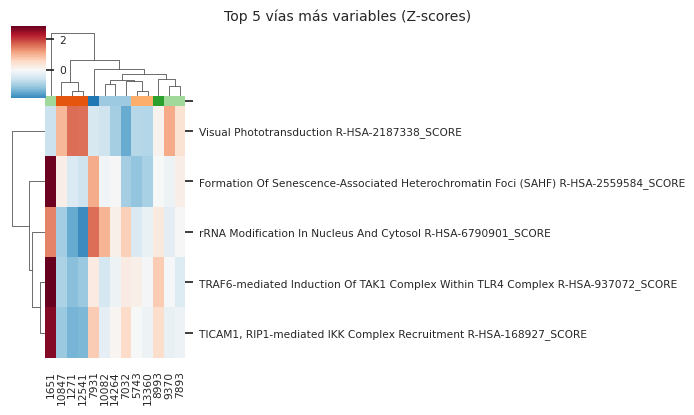

In [45]:
# ==== HEATMAP TOP 5 VÍAS (Z-scores) con clustering jerárquico ====
import numpy as np, pandas as pd
import seaborn as sns, matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# ----------------------------
# IDs de arquetipos
# ----------------------------
ids_dict = {
    "M3": ['12541','10847','1271'],
    "M4": ['3481','5743','13360'],
    "M5": ['8993'],
    "M1": ['7931'],
    "M2": ['14264','7032','10082'],
    "M6": ['7893','9370','1651'],
}

ids_dict = {
    "M3": ['12541','10847','1271'],
    "M4": ['3481','5743','13360'],
    "M5": ['8993'],
    "M1": ['7931'],
    "M2": ['14264','7032','10082'],
    "M6": ['7893','9370','1651'],
}

✅ Todos los IDs se encontraron tras normalización.
✓ M3: top-5 vías = ['G1/S-Specific Transcription R-HSA-69205_SCORE', 'Lagging Strand Synthesis R-HSA-69186_SCORE', 'Processive Synthesis On Lagging Strand R-HSA-69183_SCORE', 'Removal Of Flap Intermediate R-HSA-69166_SCORE', 'Antigen Presentation: Folding, Assembly, Peptide Loading Of Class I MHC R-HSA-983170_SCORE', 'DNA Strand Elongation R-HSA-69190_SCORE', 'Interconversion Of Nucleotide Di- And Triphosphates R-HSA-499943_SCORE', 'Apoptosis Induced DNA Fragmentation R-HSA-140342_SCORE', 'Activation Of Pre-Replicative Complex R-HSA-68962_SCORE', 'ATF6 (ATF6-alpha) Activates Chaperone Genes R-HSA-381183_SCORE']
✓ M4: top-5 vías = ['G1/S-Specific Transcription R-HSA-69205_SCORE', 'Condensation Of Prometaphase Chromosomes R-HSA-2514853_SCORE', 'Processive Synthesis On Lagging Strand R-HSA-69183_SCORE', 'Removal Of Flap Intermediate R-HSA-69166_SCORE', 'Lagging Strand Synthesis R-HSA-69186_SCORE', 'DNA Strand Elongation R-HSA-69190_SCORE'

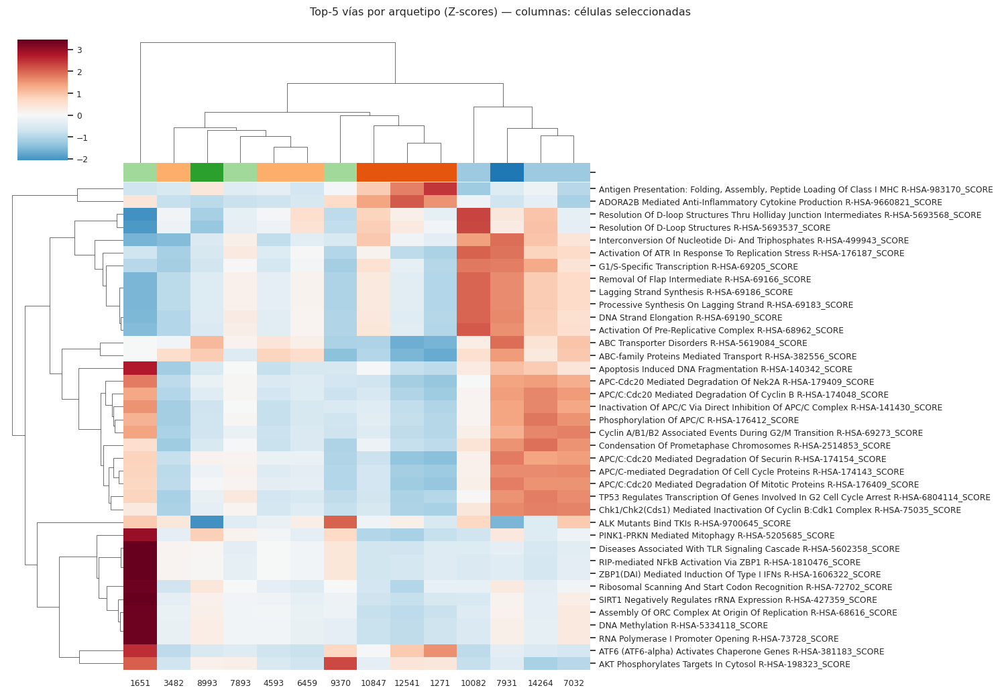

In [54]:
# ==== TOP-5 vías por arquetipo con ID robusto (normalización + verificación) ====
import numpy as np, pandas as pd
import seaborn as sns, matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from difflib import get_close_matches

# ----------------------------
# IDs de arquetipos (texto del usuario)
# ----------------------------
ids_dict_raw = {
    "M3": ['12541','10847','1271'],
    "M4": ['4593','6459','3482'],
    "M5": ['8993'],
    "M1": ['7931'],
    "M2": ['14264','7032','10082'],
    "M6": ['7893','9370','1651'],
}

# -------- 1) Normalizar obs_names e IDs a str(strip) --------
def _norm(x):
    return str(x).strip()

ad_norm = ad.copy()
ad_norm.obs_names = ad_norm.obs_names.map(_norm)

ids_dict = {k: [_norm(x) for x in v] for k, v in ids_dict_raw.items()}
all_ids = sum(ids_dict.values(), [])

# -------- 2) Verificar presencia y reportar faltantes por arquetipo --------
obs_index = pd.Index(ad_norm.obs_names)
missing_report = {}
for arch, lst in ids_dict.items():
    miss = [x for x in lst if x not in obs_index]
    if miss:
        # sugerir candidatos cercanos por similitud
        sug = {m: get_close_matches(m, obs_index.tolist(), n=3, cutoff=0.6) for m in miss}
        missing_report[arch] = (miss, sug)

if missing_report:
    print("⚠️ Aviso: Hay IDs faltantes tras normalizar. Revisa sugerencias:")
    for arch, (miss, sug) in missing_report.items():
        print(f"  - {arch}: faltan {miss}")
        for m in miss:
            print(f"      • '{m}' similares: {sug.get(m, [])}")
else:
    print("✅ Todos los IDs se encontraron tras normalización.")

# Continuar solo con los que existen
present_ids = [cid for cid in all_ids if cid in obs_index]

# -------- 3) Subset seguro --------
ad_sel = ad_norm[present_ids].copy()

# -------- 4) Selección de columnas *_SCORE --------
score_cols = [c for c in ad_sel.obs.columns if str(c).endswith("_SCORE")]
if not score_cols:
    raise ValueError("No se encontraron columnas *_SCORE en ad.obs.")

df = ad_sel.obs[score_cols].apply(pd.to_numeric, errors="coerce")

# -------- 5) Top-5 vías por varianza dentro de cada arquetipo --------
top_paths = []
for arch, lst in ids_dict.items():
    use_ids = [cid for cid in lst if cid in df.index]  # filtra faltantes
    if len(use_ids) == 0:
        print(f"⚠️ {arch}: no hay IDs válidos; se omite.")
        continue
    sub = df.loc[use_ids]
    # Si todas las varianzas son 0 (pocas celdas), usa desviación estándar como back-up
    var = sub.var(numeric_only=True)
    if (var > 0).sum() == 0 and len(use_ids) >= 1:
        var = sub.std(numeric_only=True)
    sel = var.sort_values(ascending=False).head(10).index.tolist()
    print(f"✓ {arch}: top-5 vías = {sel}")
    top_paths.extend(sel)

# Únicos preservando orden
top_paths = list(dict.fromkeys(top_paths))
if len(top_paths) == 0:
    raise ValueError("No se pudo seleccionar ninguna vía (revisa IDs/score_cols).")

# -------- 6) Z-score global sobre las vías elegidas --------
Z = pd.DataFrame(
    StandardScaler().fit_transform(df[top_paths]),
    index=df.index, columns=top_paths
)

# -------- 7) Colores por arquetipo (usa tu paleta CL_COL) --------
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}
cell2arch = {}
for arch, lst in ids_dict.items():
    for cid in lst:
        if cid in Z.index:
            cell2arch[cid] = arch

arch_series = pd.Series(cell2arch)
palette = {"M1":CL_COL["1"], "M2":CL_COL["2"], "M3":CL_COL["3"],
           "M4":CL_COL["4"], "M5":CL_COL["5"], "M6":CL_COL["6"]}
col_colors = arch_series.loc[Z.index].map(palette)

# -------- 8) Heatmap jerárquico (filas=vías, columnas=células) --------
sns.set(font_scale=0.8)
g = sns.clustermap(
    Z[top_paths].T,                 # vías en filas
    col_cluster=True, row_cluster=True,
    cmap="RdBu_r", center=0,
    col_colors=col_colors,          # banda por arquetipo
    figsize=(15, 10)
)
g.fig.suptitle("Top-5 vías por arquetipo (Z-scores) — columnas: células seleccionadas", y=1.03)
plt.show()


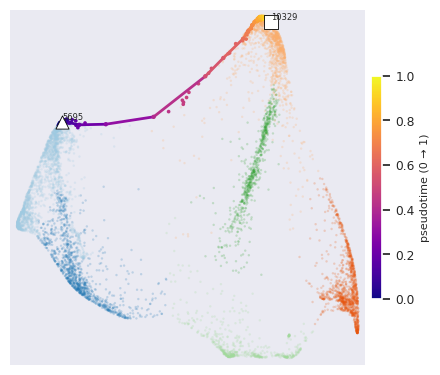

✅ Guardado:
- ./figs/phate_path_with_pseudotime.pdf
- ./figs/phate_path_with_pseudotime.png


/tmp/ipython-input-1890484380.py:453: UserWarning:

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.



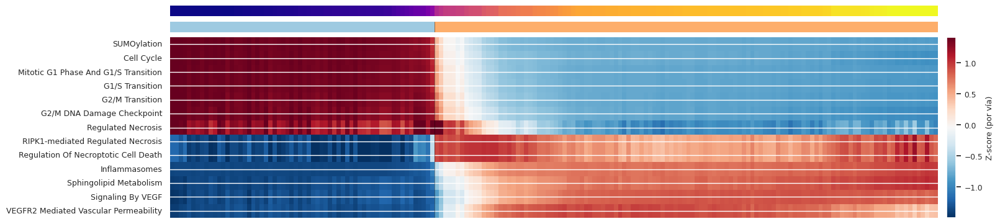

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf


In [60]:
# =============================================================================
# RUTA + EXPANSIÓN COMBINADA + VISUALIZACIÓN PHATE + HEATMAP (con pseudotiempo)
# =============================================================================
import os, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import to_rgba
from sklearn.neighbors import NearestNeighbors
from scipy.sparse.csgraph import dijkstra
from scipy import sparse as sps   # alias seguro (evita colisión con 'spines' de mpl)
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, leaves_list, optimal_leaf_ordering

# -----------------------------------------------------------------------------
# Utilidades geométricas (en 10_umaps u otro embedding métrico)
# -----------------------------------------------------------------------------
def _arc_length(P: np.ndarray) -> np.ndarray:
    """Longitud acumulada de la polilínea P (n×d)."""
    P = np.asarray(P)
    if P.shape[0] < 2:
        return np.array([0.0], float)
    seg = np.linalg.norm(P[1:] - P[:-1], axis=1)
    return np.concatenate([[0.0], np.cumsum(seg)])

def _project_points_onto_polyline(P: np.ndarray, cum: np.ndarray, Q: np.ndarray, return_dist=False):
    """
    Proyecta cada punto Q sobre la polilínea P y devuelve t ∈ [0,1] (posición normalizada).
    Si return_dist=True, también devuelve la distancia mínima a la polilínea.
    """
    P = np.asarray(P); Q = np.asarray(Q); cum = np.asarray(cum)
    n_seg = P.shape[0] - 1
    if n_seg <= 0:
        if return_dist:
            return np.zeros(Q.shape[0], float), np.linalg.norm(Q - P[0], axis=1)
        return np.zeros(Q.shape[0], float)

    total = float(cum[-1]) if cum[-1] > 0 else 1.0
    t_out = np.zeros(Q.shape[0], float)
    d_out = np.full(Q.shape[0], np.inf, float)

    for qi, q in enumerate(Q):
        best_d2, best_t = np.inf, 0.0
        for i in range(n_seg):
            a = P[i]; b = P[i+1]; v = b - a
            L2 = float(np.dot(v, v))
            if L2 == 0.0:
                u = 0.0
                d2 = float(np.dot(q - a, q - a))
            else:
                u = float(np.dot(q - a, v) / L2)
                u = 0.0 if u < 0.0 else (1.0 if u > 1.0 else u)
                proj = a + u * v
                d2 = float(np.dot(q - proj, q - proj))
            if d2 < best_d2:
                best_d2 = d2
                best_t  = (cum[i] + u * np.sqrt(L2)) / total
        t_out[qi] = best_t
        d_out[qi] = np.sqrt(best_d2)
    return (t_out, d_out) if return_dist else t_out

# -----------------------------------------------------------------------------
# Grafo kNN (pesos medidos en weight_embed_key) y Dijkstra (seguro)
# -----------------------------------------------------------------------------
def _build_knn_graph_safe(ad, rep_key="10_umaps", n_neighbors=25, weight_embed_key="10_umaps"):
    assert rep_key in ad.obsm, f"Falta ad.obsm['{rep_key}']"
    assert weight_embed_key in ad.obsm, f"Falta ad.obsm['{weight_embed_key}']"
    X = ad.obsm[rep_key]
    k = int(min(max(2, n_neighbors), X.shape[0]-1))
    nbrs = NearestNeighbors(n_neighbors=k+1, metric="euclidean").fit(X)
    _, inds = nbrs.kneighbors(X, return_distance=True)

    W = ad.obsm[weight_embed_key]
    rows, cols, data = [], [], []
    n = ad.n_obs
    for i in range(n):
        js = inds[i, 1:]  # omite self
        wi = W[i]
        for j in js:
            w = float(np.linalg.norm(wi - W[j]))
            w = 1.0 if not np.isfinite(w) else w
            rows.append(i); cols.append(j); data.append(w)

    G = sps.csr_matrix((data, (rows, cols)), shape=(n, n))
    G = sps.csr_matrix.minimum(G, G.T)  # grafo no dirigido (peso = min)
    return G

def _shortest_path_indices_safe(G, src, dst):
    dist, pred = dijkstra(G, directed=False, indices=src, return_predecessors=True)
    if not np.isfinite(dist[dst]): return None
    path = [dst]; cur = dst
    while cur != src:
        cur = pred[cur]
        if cur == -9999: return None
        path.append(cur)
    return path[::-1]

# -----------------------------------------------------------------------------
# Ruta guiada por IDs + EXPANSIÓN combinada (kNN ∪ radio ∪ to_N) con PT por proyección
# -----------------------------------------------------------------------------
def guided_pseudotime_by_ids_safe(
    ad, ids_path,
    rep_key="10_umaps", weight_embed_key="10_umaps",
    n_neighbors=25,
    out_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    expand_to_n=None,          # objetivo total ruta+extras (recorta/completa por cercanía a la polilínea)
    expand_knn=None,           # k vecinos por nodo de ruta (unión)
    expand_radius=None         # radio geométrico a la polilínea
):
    """
    1) Calcula ruta más corta entre IDs en un grafo kNN (pesos en weight_embed_key).
    2) Asigna pseudotiempo 0–1 a nodos de la ruta (arclength).
    3) (Opcional) Expande células adicionales combinando kNN ∪ radio, y recorta/completa a N.
       A todas las extra les asigna pseudotiempo por PROYECCIÓN a la polilínea.
    Flags:
        - ad.obs[path_flag_key]     = True en nodos de la ruta
        - ad.obs[expanded_flag_key] = True en ruta + añadidas (si hay expansión)
    """
    ad = ad.copy()
    name_to_idx = {n:i for i,n in enumerate(ad.obs_names)}
    miss = [cid for cid in ids_path if cid not in name_to_idx]
    if miss: raise KeyError(f"IDs no encontrados: {miss}")

    # Ruta
    G = _build_knn_graph_safe(ad, rep_key=rep_key, n_neighbors=n_neighbors, weight_embed_key=weight_embed_key)
    anchors = [name_to_idx[a] for a in ids_path]
    route = []
    for ia, ib in zip(anchors[:-1], anchors[1:]):
        seg = _shortest_path_indices_safe(G, ia, ib)
        if not seg: raise ValueError(f"No hay camino entre '{ad.obs_names[ia]}' y '{ad.obs_names[ib]}'. "
                                     f"Prueba subir n_neighbors (18–30).")
        route.extend(seg[1:] if (route and seg[0]==route[-1]) else seg)
    route = np.array(route, int)

    # Pseudotiempo en la ruta
    W = ad.obsm[weight_embed_key]
    W_route = W[route]
    cum = _arc_length(W_route)
    pt_route = (cum / cum[-1]) if cum[-1] > 0 else np.linspace(0, 1, route.size)

    PT = np.full(ad.n_obs, np.nan, float)
    PT[route] = pt_route

    path_flag = np.zeros(ad.n_obs, bool); path_flag[route] = True
    expanded_flag = path_flag.copy()

    # Candidatos por kNN / radio (unión)
    cand = np.array([], int)

    if expand_knn is not None and expand_knn > 0:
        kexp = int(expand_knn)
        nbrs = NearestNeighbors(n_neighbors=min(kexp+1, ad.n_obs), metric="euclidean").fit(W)
        _, inds = nbrs.kneighbors(W_route)
        knn_idx = np.unique(inds[:, 1:].ravel())
        knn_idx = knn_idx[~np.isin(knn_idx, route)]
        cand = knn_idx if cand.size == 0 else np.unique(np.concatenate([cand, knn_idx]))

    if expand_radius is not None and expand_radius > 0:
        _, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)
        rad_idx = np.where(d_all <= float(expand_radius))[0]
        rad_idx = rad_idx[~np.isin(rad_idx, route)]
        cand = rad_idx if cand.size == 0 else np.unique(np.concatenate([cand, rad_idx]))

    # Ajuste a N total (recorta o completa)
    extras = cand
    target_n = int(expand_to_n) if (expand_to_n is not None) else None
    if (extras.size > 0) or (target_n is not None):
        t_all, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)

    if target_n is not None:
        need_total = max(target_n - route.size, 0)
        if extras.size > need_total > 0:
            order = np.argsort(d_all[extras])
            extras = extras[order][:need_total]
        elif extras.size < need_total:
            mask = np.ones(ad.n_obs, bool); mask[route] = False
            if extras.size > 0: mask[extras] = False
            pool = np.where(mask)[0]
            if pool.size > 0:
                order = np.argsort(d_all[pool])
                fill = pool[order][: (need_total - extras.size)]
                extras = fill if extras.size == 0 else np.unique(np.concatenate([extras, fill]))

    # Proyección para pseudotiempo de extras
    if extras.size > 0:
        t_extra = _project_points_onto_polyline(W_route, cum, W[extras])
        PT[extras] = t_extra
        expanded = np.unique(np.concatenate([route, extras])).astype(int)
        expanded_flag[:] = False; expanded_flag[expanded] = True

    # Guardar
    ad.obs[out_key] = PT
    ad.obs[path_flag_key] = path_flag
    ad.obs[expanded_flag_key] = expanded_flag
    return ad, route

# -----------------------------------------------------------------------------
# Visualización en PHATE: fondo + polilínea + puntos coloreados por pseudotiempo
# -----------------------------------------------------------------------------
def plot_phate_path_with_pseudotime(
    ad, route_idx,
    coords_key="X_phate_normalized",   # PHATE 2D para dibujar
    pt_key="pseudotime_guided",        # pseudotiempo (ruta + expandidas)
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    cluster_col="hierarchical_cluster",
    palette=None,                      # dict {'1':'#...', ...}; si None usa fallback
    bg_mode="cluster",                 # 'cluster' o 'gray'
    s_bg=3.0, alpha_bg=0.22,           # fondo
    s_expanded=7, s_route=10,          # puntos
    lw=2.0, cmap="plasma",             # línea/puntos por pseudotiempo
    extent="all",                      # 'all' o 'route'
    pad=0.02,
    out_pdf="./figs/phate_path_with_pseudotime.pdf",
    out_png="./figs/phate_path_with_pseudotime.png",
    show_ids=None, label_fontsize=6,
    rasterize_axes=True
):
    assert coords_key in ad.obsm, f"Falta ad.obsm['{coords_key}'] (PHATE 2D)."
    XY = np.asarray(ad.obsm[coords_key]); assert XY.shape[1] == 2
    route_idx = np.asarray(route_idx, int)
    xy_path = XY[route_idx]

    if pt_key not in ad.obs.columns:
        raise KeyError(f"Falta ad.obs['{pt_key}']. Genera pseudotiempo primero.")
    PT = np.asarray(ad.obs[pt_key].values, float)

    os.makedirs(os.path.dirname(out_pdf) or ".", exist_ok=True)
    fig, ax = plt.subplots(figsize=(4.8, 4.8))
    if rasterize_axes: ax.set_rasterization_zorder(1)

    # Fondo
    if (bg_mode == "cluster") and (cluster_col in ad.obs.columns):
        cl = ad.obs[cluster_col].astype(str).values
        if palette is None and "CL_COL" in globals():
            palette = CL_COL
        if palette is None:
            uniq = np.unique(cl); tab = plt.cm.get_cmap("tab20", len(uniq))
            colmap = {u: tab(i) for i, u in enumerate(uniq)}
        else:
            colmap = dict(palette)
        ax.scatter(XY[:,0], XY[:,1], s=s_bg,
                   c=[colmap.get(c, "#bdbdbd") for c in cl],
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)
    else:
        ax.scatter(XY[:,0], XY[:,1], s=s_bg, c="#9e9e9e",
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)

    # Expandidas (sin repetir ruta)
    if expanded_flag_key in ad.obs.columns:
        expanded_mask = ad.obs[expanded_flag_key].values.astype(bool)
        if path_flag_key in ad.obs.columns:
            expanded_mask &= ~ad.obs[path_flag_key].values.astype(bool)
        valid = expanded_mask & np.isfinite(PT)
        if valid.any():
            ax.scatter(XY[valid,0], XY[valid,1],
                       c=PT[valid], cmap=cmap, s=s_expanded,
                       linewidths=0, zorder=1.5, rasterized=True)

    # Polilínea de la ruta
    if route_idx.size >= 2:
        segs = np.stack([xy_path[:-1], xy_path[1:]], axis=1)
        pt_path = PT[route_idx]
        if not np.isfinite(pt_path).all():
            n = pt_path.size; x = np.arange(n); good = np.isfinite(pt_path)
            pt_path = np.interp(x, x[good], pt_path[good])
        lc = LineCollection(segs, cmap=cmap, linewidths=lw, zorder=3)
        lc.set_array(pt_path[:-1])
        ax.add_collection(lc)

    sc_route = ax.scatter(xy_path[:,0], xy_path[:,1],
                          c=PT[route_idx], cmap=cmap,
                          s=s_route, linewidths=0, zorder=3.2)

    # Inicio / fin
    ax.scatter(*xy_path[0],  marker="^", s=s_route*9, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)
    ax.scatter(*xy_path[-1], marker="s", s=s_route*10, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)

    # IDs ancla (opcional)
    if show_ids:
        name_to_idx = {n:i for i,n in enumerate(ad.obs_names)}
        for oid in show_ids:
            k = name_to_idx.get(oid)
            if k is None: continue
            if np.any(route_idx == k):
                x, y = XY[k]
                ax.text(x, y, str(oid), fontsize=label_fontsize,
                        ha="left", va="bottom", zorder=5)

    # Límites
    if extent == "all":
        x_min, x_max = XY[:,0].min(), XY[:,0].max()
        y_min, y_max = XY[:,1].min(), XY[:,1].max()
        dx, dy = (x_max - x_min), (y_max - y_min)
    else:  # 'route'
        x_min, x_max = xy_path[:,0].min(), xy_path[:,0].max()
        y_min, y_max = xy_path[:,1].min(), xy_path[:,1].max()
        dx, dy = np.ptp(xy_path[:,0]), np.ptp(xy_path[:,1])

    ax.set_xlim(x_min - pad*max(dx,1e-9), x_max + pad*max(dx,1e-9))
    ax.set_ylim(y_min - pad*max(dy,1e-9), y_max + pad*max(dy,1e-9))
    ax.set_aspect("equal", "box")
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values(): spine.set_visible(False)

    # Colorbar
    cbar = fig.colorbar(sc_route, ax=ax, fraction=0.03, pad=0.015)
    cbar.set_label("pseudotime (0 → 1)", fontsize=8)

    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_png, dpi=500, bbox_inches=0)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_pdf}\n- {out_png}")

# -----------------------------------------------------------------------------
# HEATMAP (horizontal) con tira de PSEUDOTIEMPO (sin ticks arriba por defecto)
# -----------------------------------------------------------------------------
def _short_lbl(s: str) -> str:
    s = re.sub(r"\s*SCORE\s*$", "", s, flags=re.I)
    s = re.sub(r"\s*R-HSA-\d+(\.\d+)?\s*", "", s, flags=re.I)
    return s.replace("_"," ").strip()

def heatmap_for_cells_with_pt(
    ad, selected_scores, pt_key="pseudotime_guided",
    use_flag_key="guided_expanded_flag",          # o 'guided_path_flag' para solo ruta
    cluster_col="hierarchical_cluster",
    palette=None, zscore_per_row=True, cmap="RdBu_r",
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,
    # ---- tamaño de figura ----
    width=None,            # ancho absoluto en pulgadas
    height=None,           # alto absoluto en pulgadas
    per_col=0.012,         # escalado auto por columna (si width=None)
    per_row=0.35,          # escalado auto por fila (si height=None)
    min_w=7.0, max_w=18.5, # límites auto
    min_h=4.8,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf",
    # ===== NUEVO: ordenamiento de filas =====
    row_order="similarity",     # "similarity" (default) o "none"
    row_metric="correlation",   # métrica para similitud de filas
    row_linkage="average"       # método de enlace (para Ward usa métrica euclidiana)
):
    import numpy as np, pandas as pd, os
    import matplotlib.pyplot as plt

    assert pt_key in ad.obs.columns, f"Falta ad.obs['{pt_key}']"
    mask = ad.obs[pt_key].notna()
    if use_flag_key in ad.obs.columns:
        mask = mask & ad.obs[use_flag_key].astype(bool)

    cells = ad.obs_names[mask]
    if cells.size == 0:
        raise ValueError("No hay células con pseudotiempo para mostrar (revisa flags/expansión).")

    # Orden por pseudotiempo (así la tira de PT se alinea 1:1 con las columnas)
    pt = ad.obs.loc[cells, pt_key].astype(float).values
    order = np.argsort(pt)
    cells = cells[order]
    pt = pt[order]

    # Selección de vías
    cols_exist = [c for c in selected_scores if c in ad.obs.columns]
    missing = [c for c in selected_scores if c not in ad.obs.columns]
    if missing:
        print("⚠️ Omitidas (no existen en ad.obs):", missing)

    df = ad.obs.loc[cells, cols_exist].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)
    M = df.T  # (n_vías × n_cells)

    # Z-score por fila (opcional)
    if zscore_per_row:
        mu = M.mean(axis=1).values[:, None]
        sd = M.std(axis=1).replace(0, np.nan).values[:, None]
        Z = (M.values - mu) / sd
        Z = np.nan_to_num(Z, nan=0.0)
        data = Z; cbar_label = "Z-score (por vía)"
    else:
        data = M.values; cbar_label = "Score"

    row_labels = [_short_lbl(c) for c in M.index]
    n_rows, n_cols = data.shape

    # ======== ORDENAR FILAS POR SIMILITUD (NUEVO) ========
    if (row_order == "similarity") and (n_rows >= 3):
        try:
            D = pdist(data, metric=row_metric)   # (n_rows×n_cols)
            Z = linkage(D, method=row_linkage)
            Z = optimal_leaf_ordering(Z, D)
            ord_rows = leaves_list(Z)
            data       = data[ord_rows, :]
            row_labels = [row_labels[i] for i in ord_rows]
        except Exception as e:
            print(f"⚠️ No se pudo ordenar por similitud ({type(e).__name__}: {e}). Uso orden original.")
    # =====================================================

    # Tira de metaclúster
    strip_rgba, bounds = None, np.array([], int)
    if (cluster_col is not None) and (cluster_col in ad.obs.columns):
        cl_ord = ad.obs.loc[cells, cluster_col].astype(str).values
        if palette is None and "CL_COL" in globals():
            pal = CL_COL
        elif palette is None:
            uniq = np.unique(cl_ord); tab = plt.cm.get_cmap("tab20", len(uniq))
            pal = {u: tab(i) for i, u in enumerate(uniq)}
        else:
            pal = dict(palette)
        strip_rgba = np.array([to_rgba(pal.get(x, "#bdbdbd")) for x in cl_ord], float)[None, :, :]
        bounds = np.where(cl_ord[1:] != cl_ord[:-1])[0] + 1

    # ----- LAYOUT: [ PT track ] [ Cluster strip ] [ Heatmap ] -----
    have_pttrk = bool(show_pt_track)
    have_strip = strip_rgba is not None

    ratios = []
    if have_pttrk: ratios.append(0.55)
    if have_strip: ratios.append(0.55)
    ratios.append(9.4)

    # ---- Cálculo de tamaño ----
    if width is None:
        fig_w = max(min_w, min(max_w, 6.5 + per_col*n_cols))
    else:
        fig_w = float(width)

    extra_h = (0.25 if have_pttrk else 0) + (0.25 if have_strip else 0)
    if height is None:
        fig_h = max(min_h, 2.2 + per_row*n_rows + extra_h)
    else:
        fig_h = float(height)

    # ---- Creación de figura ----
    os.makedirs(os.path.dirname(out_png) or ".", exist_ok=True)
    fig, axes = plt.subplots(
        len(ratios), 1, sharex=True,
        gridspec_kw={"height_ratios": ratios},
        figsize=(fig_w, fig_h),
        constrained_layout=True
    )
    if not isinstance(axes, (list, np.ndarray)):
        axes = [axes]
    ax_idx = 0

    # Márgenes (dinámicos para etiquetas largas)
    max_lbl = max(len(x) for x in row_labels) if row_labels else 12
    left_margin = min(0.45, 0.14 + 0.009*max_lbl)
    fig.subplots_adjust(left=left_margin, right=0.985, top=0.92, bottom=0.06, hspace=0.05)

    # --- (1) Tira de pseudotiempo ---
    if have_pttrk:
        ax_pt = axes[ax_idx]; ax_idx += 1
        ax_pt.imshow(pt[None, :], aspect="auto", cmap=pt_cmap,
                     interpolation="nearest", origin="upper",
                     extent=(-0.5, n_cols-0.5, 0.5, -0.5), rasterized=True)
        ax_pt.set_yticks([]); ax_pt.set_xticks([])
        for sp in ax_pt.spines.values(): sp.set_visible(False)
        if show_pt_ticks:
            ax_pt_top = ax_pt.secondary_xaxis("top")
            ax_pt_top.set_xticks([0.0, 0.5, 1.0], labels=["0.0", "0.5", "1.0"])
            ax_pt_top.set_xlabel("Pseudotime", fontsize=9)
            ax_pt_top.tick_params(labelsize=8)

    # --- (2) Tira de metaclúster ---
    if have_strip:
        ax_strip_ax = axes[ax_idx]; ax_idx += 1
        ax_strip_ax.imshow(strip_rgba, aspect="auto", interpolation="nearest",
                           origin="upper", rasterized=True,
                           extent=(-0.5, n_cols-0.5, 0.5, -0.5))
        ax_strip_ax.set_yticks([]); ax_strip_ax.set_xticks([])
        for b in bounds: ax_strip_ax.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
        for sp in ax_strip_ax.spines.values(): sp.set_visible(False)

    # --- (3) Heatmap principal ---
    ax_hm = axes[ax_idx]
    vmin, vmax = np.percentile(data, 1), np.percentile(data, 99)
    im = ax_hm.imshow(
        data, cmap=cmap, vmin=vmin, vmax=vmax,
        interpolation="nearest", aspect="auto",
        origin="upper", rasterized=True,
        extent=(-0.5, n_cols-0.5, n_rows-0.5, -0.5)
    )
    ax_hm.set_yticks(np.arange(n_rows))
    ax_hm.set_yticklabels(row_labels, fontsize=9, va="center")
    ax_hm.set_ylim(n_rows-0.5, -0.5)
    ax_hm.set_xticks([])

    for b in bounds: ax_hm.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
    for sp in ax_hm.spines.values(): sp.set_visible(False)

    cbar = fig.colorbar(im, ax=ax_hm, fraction=0.025, pad=0.012)
    cbar.set_label(cbar_label, fontsize=9)

    fig.savefig(out_png, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_png}\n- {out_pdf}")
"""
# -----------------------------------------------------------------------------
# PARÁMETROS DE VÍAS (ejemplo)
# -----------------------------------------------------------------------------
SELECTED_SCORES= [
 'SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE','RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE',
 'Regulated Necrosis R-HSA-5218859_SCORE','Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE',
 'G1/S Transition R-HSA-69206_SCORE','Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE',
 'VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE',
 'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE','Sphingolipid Metabolism R-HSA-428157_SCORE'
]

# Si ya tienes una paleta global, se usará. Si no, el código usa tab20 automáticamente.
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}

# -----------------------------------------------------------------------------
# USO (IDs de ancla de ejemplo)
# -----------------------------------------------------------------------------
ids_path = ["5695","10329"]  # anclas en ad.obs_names
ad2, route_idx = guided_pseudotime_by_ids_safe(
    adata, ids_path=ids_path,
    rep_key="10_umaps", weight_embed_key="10_umaps",
    n_neighbors=25,
    out_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    expand_knn=15,        # añade kNN por nodo de ruta
    expand_radius=0.30,   # añade por radio geométrico a la polilínea
    expand_to_n=180       # recorta/completa al total deseado
)

plot_phate_path_with_pseudotime(
    ad2, route_idx,
    coords_key="X_phate_normalized",
    pt_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    extent="all",          # o 'route' para hacer zoom
    show_ids=ids_path
)

heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    width=16, height=3.5,
    pt_key="pseudotime_guided",
    use_flag_key="guided_expanded_flag",  # o "guided_path_flag" para solo ruta
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,
    # <<< orden por similitud de filas >>>
    row_order="similarity",        # activa el orden por similitud
    row_metric="correlation",      # ideal con z-score por fila
    row_linkage="average",         # o ("euclidean","ward") si prefieres Ward
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"

)
"""

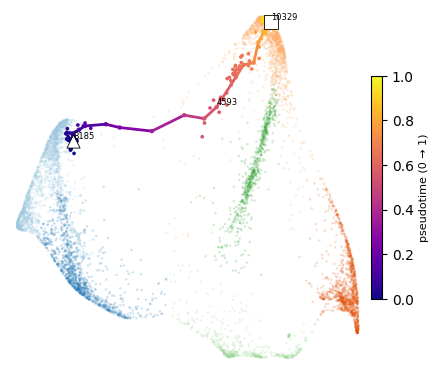

✅ Guardado:
- ./figs/phate_path_with_pseudotime.pdf
- ./figs/phate_path_with_pseudotime.png
⚠️ Omitidas (no existen en ad.obs): ['"Glycolysis R-HSA-70171_SCORE", "Glucose Metabolism R-HSA-70326_SCORE"']


/tmp/ipython-input-1890484380.py:453: UserWarning:

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.



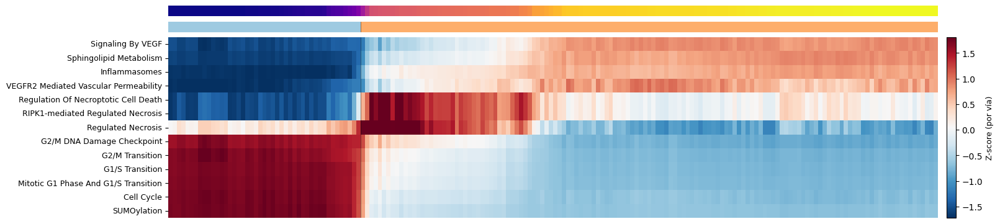

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf


In [ ]:
# -----------------------------------------------------------------------------
# PARÁMETROS DE VÍAS (ejemplo)
# -----------------------------------------------------------------------------
SELECTED_SCORES= ['SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE','RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE',
 'Regulated Necrosis R-HSA-5218859_SCORE',
 'Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE','G1/S Transition R-HSA-69206_SCORE',
 'Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE','VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE'
 ,'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE','Sphingolipid Metabolism R-HSA-428157_SCORE','"Glycolysis R-HSA-70171_SCORE", "Glucose Metabolism R-HSA-70326_SCORE"']
#Si ya tienes una paleta global, se usará. Si no, el código usa tab20 automáticamente.
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}


ids_path = ["8185",'4593',"10329"]  # anclas en ad.obs_names
ad2, route_idx = guided_pseudotime_by_ids_safe(
    adata, ids_path=ids_path,
    rep_key="10_umaps", weight_embed_key="10_umaps",
    n_neighbors=25,
    out_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    expand_knn=15,        # añade kNN por nodo de ruta
    expand_radius=0.30,   # añade por radio geométrico a la polilínea
    expand_to_n=180       # recorta/completa al total deseado
)

plot_phate_path_with_pseudotime(
    ad2, route_idx,
    coords_key="X_phate_normalized",
    pt_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    extent="all",          # o 'route' para hacer zoom
    show_ids=ids_path
)

heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    width=16, height=3.5,
    pt_key="pseudotime_guided",
    use_flag_key="guided_expanded_flag",  # o "guided_path_flag" para solo ruta
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,                  # <- sin ticks arriba (lo puedes poner True)
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)


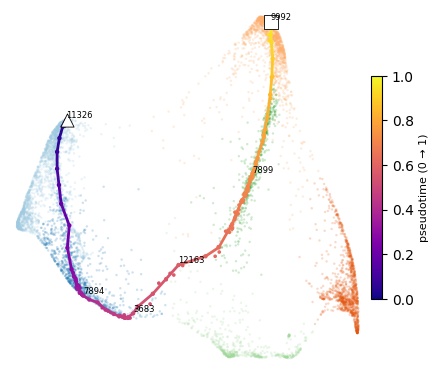

✅ Guardado:
- ./figs/phate_path_with_pseudotime.pdf
- ./figs/phate_path_with_pseudotime.png


/tmp/ipython-input-1890484380.py:453: UserWarning:

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.



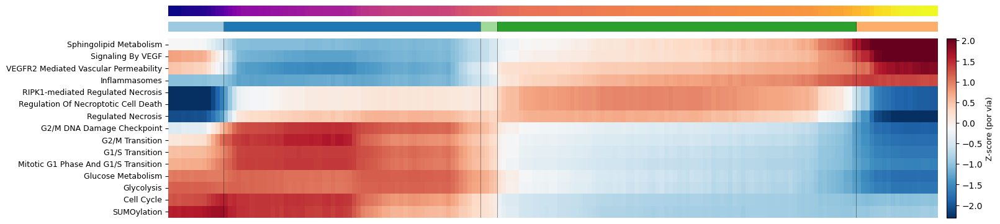

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf


In [ ]:
# -----------------------------------------------------------------------------
# PARÁMETROS DE VÍAS (ejemplo)
# -----------------------------------------------------------------------------
SELECTED_SCORES= ['SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE','RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE',
 'Regulated Necrosis R-HSA-5218859_SCORE',
 'Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE','G1/S Transition R-HSA-69206_SCORE',
 'Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE','VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE'
 ,'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE','Sphingolipid Metabolism R-HSA-428157_SCORE',"Glycolysis R-HSA-70171_SCORE", "Glucose Metabolism R-HSA-70326_SCORE"]
#Si ya tienes una paleta global, se usará. Si no, el código usa tab20 automáticamente.
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}

ids_path = ['11326','7894',"3683", "12163" ,'7899', "9992"]  # anclas en ad.obs_names
ad2, route_idx = guided_pseudotime_by_ids_safe(
    adata, ids_path=ids_path,
    rep_key="10_umaps", weight_embed_key="10_umaps",
    n_neighbors=25,
    out_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    expand_knn=15,        # añade kNN por nodo de ruta
    expand_radius=0.30,   # añade por radio geométrico a la polilínea
    expand_to_n=180       # recorta/completa al total deseado
)

plot_phate_path_with_pseudotime(
    ad2, route_idx,
    coords_key="X_phate_normalized",
    pt_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    extent="all",          # o 'route' para hacer zoom
    show_ids=ids_path
)

heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    width=16, height=3.5,
    pt_key="pseudotime_guided",
    use_flag_key="guided_expanded_flag",  # o "guided_path_flag" para solo ruta
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,                  # <- sin ticks arriba (lo puedes poner True)
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf")

In [ ]:
FOXO-mediated Transcription Of Cell Death Genes R-HSA-9614657_SCORE
 10: FOXO-mediated Transcription Of Oxidative Stress, Metabolic And Neuronal Genes R-HSA-9615017_SCORE
 11: FOXO-mediated Transcription R-HSA-9614085_SCORE
 12: Gene Expression (Transcription) R-HSA-74160_SCORE
 13: Glucose Metabolism R-HSA-70326_SCORE

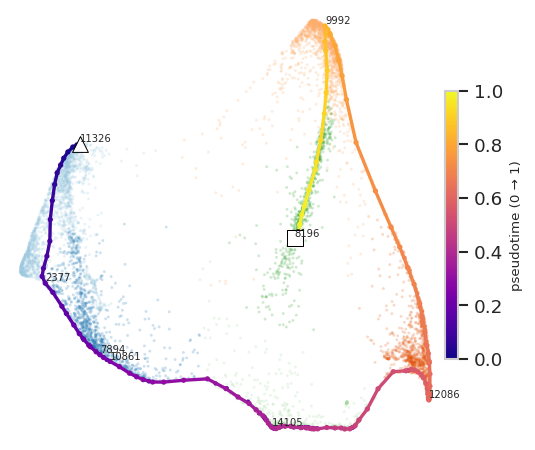

✅ Guardado:
- ./figs/phate_path_with_pseudotime.pdf
- ./figs/phate_path_with_pseudotime.png


/tmp/ipython-input-1890484380.py:453: UserWarning:

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.



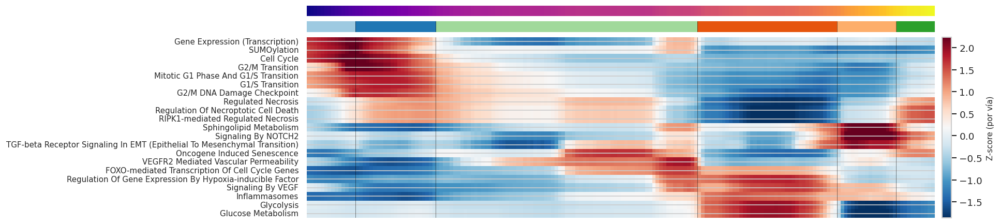

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf


In [67]:
sns.set_theme(context="notebook", style="whitegrid")

# -----------------------------------------------------------------------------
# PARÁMETROS DE VÍAS (ejemplo)
# -----------------------------------------------------------------------------
SELECTED_SCORES= ['SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE','RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE',
 'Regulated Necrosis R-HSA-5218859_SCORE',
 'Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE','G1/S Transition R-HSA-69206_SCORE',
 'Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE','VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE'
 ,'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE','Sphingolipid Metabolism R-HSA-428157_SCORE',"Glycolysis R-HSA-70171_SCORE", "Glucose Metabolism R-HSA-70326_SCORE"
 ,'TGF-beta Receptor Signaling In EMT (Epithelial To Mesenchymal Transition) R-HSA-2173791_SCORE','FOXO-mediated Transcription Of Cell Cycle Genes R-HSA-9617828_SCORE','Regulation Of Gene Expression By Hypoxia-inducible Factor R-HSA-1234158_SCORE','Gene Expression (Transcription) R-HSA-74160_SCORE'
 ,'Signaling By NOTCH2 R-HSA-1980145_SCORE','Oncogene Induced Senescence R-HSA-2559585_SCORE']
#Si ya tienes una paleta global, se usará. Si no, el código usa tab20 automáticamente.
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}


ids_path = ['11326','2377','7894',"10861", "14105", "12086", "9992",'8196']  # anclas en ad.obs_names
ad2, route_idx = guided_pseudotime_by_ids_safe(
    adata, ids_path=ids_path,
    rep_key="10_umaps", weight_embed_key="10_umaps",
    n_neighbors=25,
    out_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    expand_knn=15,        # añade kNN por nodo de ruta
    expand_radius=0.30,   # añade por radio geométrico a la polilínea
    expand_to_n=180       # recorta/completa al total deseado
)

plot_phate_path_with_pseudotime(
    ad2, route_idx,
    coords_key="X_phate_normalized",
    pt_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    extent="all",          # o 'route' para hacer zoom
    show_ids=ids_path
)

heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    width=16, height=3.5,
    pt_key="pseudotime_guided",
    use_flag_key="guided_expanded_flag",  # o "guided_path_flag" para solo ruta
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,                  # <- sin ticks arriba (lo puedes poner True)
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)

In [ ]:
# -----------------------------------------------------------------------------
# PARÁMETROS DE VÍAS (ejemplo)
# -----------------------------------------------------------------------------
SELECTED_SCORES= ['SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE','RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE',
 'Regulated Necrosis R-HSA-5218859_SCORE',
 'Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE','G1/S Transition R-HSA-69206_SCORE',
 'Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE','VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE'
 ,'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE','Sphingolipid Metabolism R-HSA-428157_SCORE']
#Si ya tienes una paleta global, se usará. Si no, el código usa tab20 automáticamente.
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}


ids_path = ["8185",'4593',"10329"]  # anclas en ad.obs_names
ad2, route_idx = guided_pseudotime_by_ids_safe(
    adata, ids_path=ids_path,
    rep_key="10_umaps", weight_embed_key="10_umaps",
    n_neighbors=25,
    out_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    expand_knn=15,        # añade kNN por nodo de ruta
    expand_radius=0.30,   # añade por radio geométrico a la polilínea
    expand_to_n=180       # recorta/completa al total deseado
)

plot_phate_path_with_pseudotime(
    ad2, route_idx,
    coords_key="X_phate_normalized",
    pt_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    extent="all",          # o 'route' para hacer zoom
    show_ids=ids_path
)

heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    width=16, height=3.5,
    pt_key="pseudotime_guided",
    use_flag_key="guided_expanded_flag",  # o "guided_path_flag" para solo ruta
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,                  # <- sin ticks arriba (lo puedes poner True)
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)


In [ ]:
#"10184", "4375"  '2884'

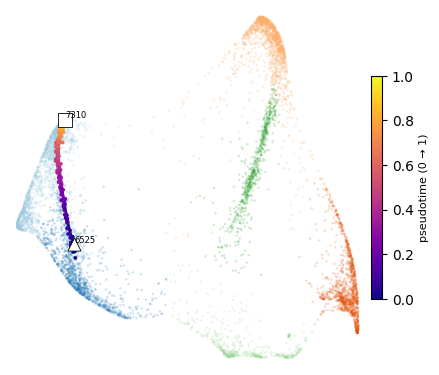

✅ Guardado:
- ./figs/phate_path_with_pseudotime.pdf
- ./figs/phate_path_with_pseudotime.png


/tmp/ipython-input-1890484380.py:453: UserWarning:

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.



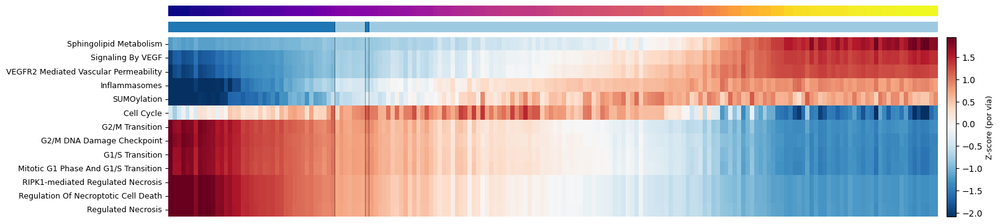

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf


In [41]:
# -----------------------------------------------------------------------------
# PARÁMETROS DE VÍAS (ejemplo)
# -----------------------------------------------------------------------------
SELECTED_SCORES= ['SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE','RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE',
 'Regulated Necrosis R-HSA-5218859_SCORE',
 'Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE','G1/S Transition R-HSA-69206_SCORE',
 'Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE','VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE'
 ,'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE','Sphingolipid Metabolism R-HSA-428157_SCORE']
#Si ya tienes una paleta global, se usará. Si no, el código usa tab20 automáticamente.
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}


ids_path = ["6525","7310"]#, '2884']  # anclas en ad.obs_names
ad2, route_idx = guided_pseudotime_by_ids_safe(
    adata, ids_path=ids_path,
    rep_key="10_umaps", weight_embed_key="10_umaps",
    n_neighbors=25,
    out_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    expand_knn=15,        # añade kNN por nodo de ruta
    expand_radius=0.30,   # añade por radio geométrico a la polilínea
    expand_to_n=180       # recorta/completa al total deseado
)

plot_phate_path_with_pseudotime(
    ad2, route_idx,
    coords_key="X_phate_normalized",
    pt_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    extent="all",          # o 'route' para hacer zoom
    show_ids=ids_path
)

heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    width=16, height=3.5,
    pt_key="pseudotime_guided",
    use_flag_key="guided_expanded_flag",  # o "guided_path_flag" para solo ruta
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,                  # <- sin ticks arriba (lo puedes poner True)
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)

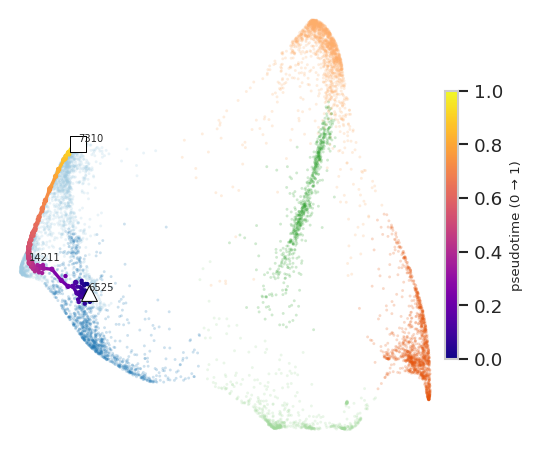

✅ Guardado:
- ./figs/phate_path_with_pseudotime.pdf
- ./figs/phate_path_with_pseudotime.png


/tmp/ipython-input-4191209503.py:442: UserWarning:

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.



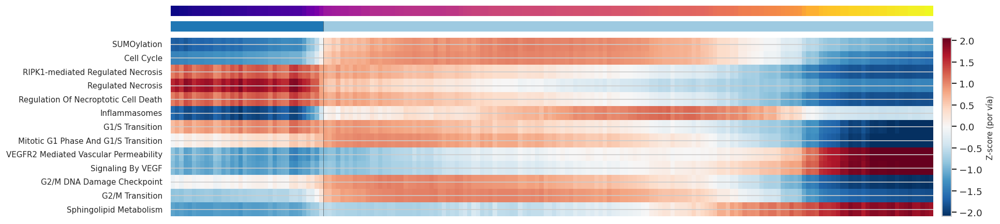

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf


In [ ]:

# -----------------------------------------------------------------------------
# PARÁMETROS DE VÍAS (ejemplo)
# -----------------------------------------------------------------------------
SELECTED_SCORES= ['SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE','RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE',
 'Regulated Necrosis R-HSA-5218859_SCORE',
 'Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE','G1/S Transition R-HSA-69206_SCORE',
 'Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE','VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE'
 ,'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE','Sphingolipid Metabolism R-HSA-428157_SCORE']
#Si ya tienes una paleta global, se usará. Si no, el código usa tab20 automáticamente.
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}


ids_path = ["6525",'14211',"7310"]#, '2884']  # anclas en ad.obs_names
ad2, route_idx = guided_pseudotime_by_ids_safe(
    adata, ids_path=ids_path,
    rep_key="10_umaps", weight_embed_key="10_umaps",
    n_neighbors=25,
    out_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    expand_knn=15,        # añade kNN por nodo de ruta
    expand_radius=0.30,   # añade por radio geométrico a la polilínea
    expand_to_n=180       # recorta/completa al total deseado
)

plot_phate_path_with_pseudotime(
    ad2, route_idx,
    coords_key="X_phate_normalized",
    pt_key="pseudotime_guided",
    path_flag_key="guided_path_flag",
    expanded_flag_key="guided_expanded_flag",
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    extent="all",          # o 'route' para hacer zoom
    show_ids=ids_path
)

heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    width=16, height=3.5,
    pt_key="pseudotime_guided",
    use_flag_key="guided_expanded_flag",  # o "guided_path_flag" para solo ruta
    cluster_col="hierarchical_cluster",
    palette=CL_COL if "CL_COL" in globals() else None,
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,                  # <- sin ticks arriba (lo puedes poner True)
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)

#RE-CLUSTERING

✅ Subset hierarchical_cluster en ['1', '2']: 3233 células
ℹ️  Recalculando '2D_UMAP_RECLUSTERING' desde *_SCORE en el subset…
✅ UMAP 2D guardado en ad_sub.obsm['2D_UMAP_RECLUSTERING'] (k=1000)


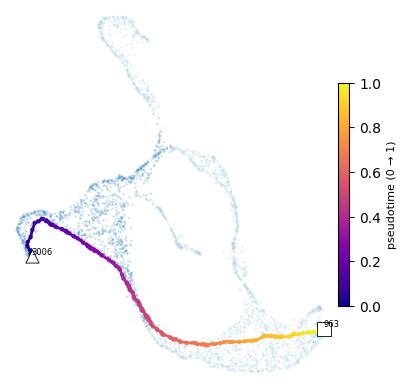

✅ Guardado:
- ./figs/umap_path_with_pseudotime.pdf
- ./figs/umap_path_with_pseudotime.png


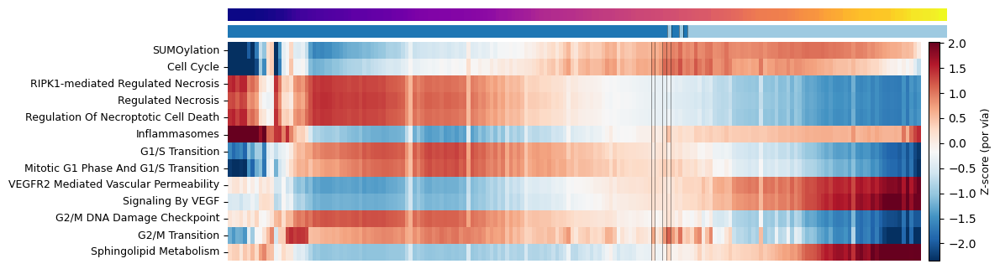

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf


In [ ]:
# =============================================================================
# SUBSET (meta 1 y 2) + RUTA + EXPANSIÓN + VISUALIZACIÓN (estilo PHATE) + HEATMAP
# sobre el UMAP 2D REECLUSTERIZADO del subset (obsm["2D_UMAP_RECLUSTERING"])
# =============================================================================
import os, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from sklearn.neighbors import NearestNeighbors
from scipy.sparse.csgraph import dijkstra
from scipy import sparse as sps

# --- para el bloque de rescate / UMAP ---
import scanpy as sc
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# ----------------------- Parámetros clave (AJUSTABLES) -----------------------
KEEP_META = ["1","2"]                      # metaclústeres a conservar
STORE_UMAP_KEY = "2D_UMAP_RECLUSTERIZING"  # <-- si TU clave es '2D_UMAP_RECLUSTERING', usa ese texto exacto
# Nota: si tu clave original es "2D_UMAP_RECLUSTERING", re-asigna: STORE_UMAP_KEY = "2D_UMAP_RECLUSTERING"
STORE_UMAP_KEY = "2D_UMAP_RECLUSTERING"

WEIGHT_KEY     = STORE_UMAP_KEY            # mismo embedding para pesos del grafo
N_NEIGHBORS    = 25                        # k del grafo para Dijkstra
EXPAND_KNN     = 15                        # k vecinos por nodo de ruta (expansión)
EXPAND_RADIUS  = 0.30                      # radio geométrico a la polilínea (expansión)
EXPAND_TO_N    = 180                       # objetivo total ruta + extras
PT_KEY         = "pseudotime_guided"
PATH_FLAG_KEY  = "guided_path_flag"
EXPAND_FLAG_KEY= "guided_expanded_flag"

# Paleta fija opcional (fondo por clúster)
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}

# ----------------------- Detectar columna de meta/cluster --------------------
def find_meta_col(ad):
    for c in [
        "meta_cluster","metacluster","MetaCluster",
        "meta_cluster_id","metacluster_id","metacluster_label",
        "hierarchical_metacluster","hierarchical_cluster",
    ]:
        if c in ad.obs.columns:
            return c
    raise KeyError("No encontré columna de meta-clúster/clúster en ad.obs.")

assert 'adata' in globals(), "Debes tener un AnnData llamado 'adata'."
meta_col = find_meta_col(adata)

# ---------------------- Subset SOLO 1 y 2 (se conserva obsm) -----------------
mask = adata.obs[meta_col].astype(str).isin(KEEP_META)
ad12 = adata[mask].copy()
print(f"✅ Subset {meta_col} en {KEEP_META}: {ad12.n_obs} células")

# ============================= BLOQUE DE RESCATE =============================
# Asegurar ad12.obsm[STORE_UMAP_KEY] heredándolo del padre si existe
# o recalculándolo desde *_SCORE -> PCA -> vecinos -> UMAP.

MIN_VAR = 1e-12
RANDOM_STATE = 0
MIN_DIST = 0.5
N_NEIGHBORS_UMAP = 1000
STORE_PCA_KEY = "X_pca_scores"

def _build_score_matrix(ad, score_cols=None, min_var=1e-12, standardize=True):
    if score_cols is None:
        score_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
    if not score_cols:
        raise ValueError("No se encontraron columnas *_SCORE en ad.obs.")
    df = ad.obs[score_cols].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)
    var = df.var(axis=0, ddof=0).values
    keep = var > float(min_var)
    if keep.sum() < 3:
        raise ValueError(f"Quedan <3 scores con var>0 (mantienen {keep.sum()}).")
    df = df.loc[:, keep]
    X = df.values
    if standardize:
        X = StandardScaler(with_mean=True, with_std=True).fit_transform(X)
    return X.astype(np.float32, copy=False), list(df.columns)

def ensure_umap_for_subset(ad_parent, ad_sub, store_umap_key=STORE_UMAP_KEY):
    # 1) Si ya está, nada que hacer
    if store_umap_key in ad_sub.obsm:
        print(f"✅ Ya existe ad_sub.obsm['{store_umap_key}']")
        return ad_sub

    # 2) Intentar heredar del AnnData padre (alineando por obs_names)
    if store_umap_key in ad_parent.obsm:
        U_parent = pd.DataFrame(ad_parent.obsm[store_umap_key], index=ad_parent.obs_names)
        try:
            U_sub = U_parent.loc[ad_sub.obs_names].values
            ad_sub.obsm[store_umap_key] = U_sub.astype(np.float32)
            print(f"✅ Heredado '{store_umap_key}' desde el AnnData padre (mismo embedding).")
            return ad_sub
        except KeyError:
            pass  # faltan celdas -> recalculamos

    # 3) Recalcular desde *_SCORE → PCA → vecinos → UMAP
    print(f"ℹ️  Recalculando '{store_umap_key}' desde *_SCORE en el subset…")
    X_scores, used_scores = _build_score_matrix(ad_sub, score_cols=None, min_var=MIN_VAR, standardize=True)
    n_comps = int(min(15, X_scores.shape[1], max(2, ad_sub.n_obs - 1)))
    pca = PCA(n_components=n_comps, svd_solver='randomized', random_state=RANDOM_STATE)
    Xp = pca.fit_transform(X_scores)
    ad_sub.obsm[STORE_PCA_KEY] = np.asarray(Xp, dtype=np.float32)
    k = int(max(2, min(N_NEIGHBORS_UMAP, ad_sub.n_obs - 1)))
    sc.pp.neighbors(ad_sub, use_rep=STORE_PCA_KEY, n_neighbors=k, metric="cosine")
    sc.tl.umap(ad_sub, n_components=2, random_state=RANDOM_STATE, min_dist=MIN_DIST, spread=1.0)
    ad_sub.obsm[store_umap_key] = ad_sub.obsm["X_umap"].copy()
    print(f"✅ UMAP 2D guardado en ad_sub.obsm['{store_umap_key}'] (k={k})")
    return ad_sub

# Ejecutar rescate
ad12 = ensure_umap_for_subset(adata, ad12, store_umap_key=STORE_UMAP_KEY)
# =========================== FIN BLOQUE DE RESCATE ===========================

# =============================================================================
# Utilidades geométricas y de grafo (fundamento estilo PHATE)
# =============================================================================
def _arc_length(P: np.ndarray) -> np.ndarray:
    P = np.asarray(P)
    if P.shape[0] < 2: return np.array([0.0], float)
    seg = np.linalg.norm(P[1:] - P[:-1], axis=1)
    return np.concatenate([[0.0], np.cumsum(seg)])

def _project_points_onto_polyline(P: np.ndarray, cum: np.ndarray, Q: np.ndarray, return_dist=False):
    P = np.asarray(P); Q = np.asarray(Q); cum = np.asarray(cum)
    n_seg = P.shape[0] - 1
    if n_seg <= 0:
        if return_dist: return np.zeros(Q.shape[0], float), np.linalg.norm(Q - P[0], axis=1)
        return np.zeros(Q.shape[0], float)
    total = float(cum[-1]) if cum[-1] > 0 else 1.0
    t_out = np.zeros(Q.shape[0], float); d_out = np.full(Q.shape[0], np.inf, float)
    for qi, q in enumerate(Q):
        best_d2, best_t = np.inf, 0.0
        for i in range(n_seg):
            a = P[i]; b = P[i+1]; v = b - a; L2 = float(np.dot(v, v))
            if L2 == 0.0:
                u = 0.0; d2 = float(np.dot(q - a, q - a))
            else:
                u = float(np.dot(q - a, v) / L2); u = 0.0 if u < 0.0 else (1.0 if u > 1.0 else u)
                proj = a + u * v; d2 = float(np.dot(q - proj, q - proj))
            if d2 < best_d2:
                best_d2 = d2; best_t = (cum[i] + u * np.sqrt(L2)) / total
        t_out[qi] = best_t; d_out[qi] = np.sqrt(best_d2)
    return (t_out, d_out) if return_dist else t_out

def _build_knn_graph_safe(ad, rep_key=STORE_UMAP_KEY, n_neighbors=N_NEIGHBORS, weight_embed_key=WEIGHT_KEY):
    assert rep_key in ad.obsm and weight_embed_key in ad.obsm
    X = np.asarray(ad.obsm[rep_key]); W = np.asarray(ad.obsm[weight_embed_key])
    k = int(min(max(2, n_neighbors), X.shape[0]-1))
    nbrs = NearestNeighbors(n_neighbors=k+1, metric="euclidean").fit(X)
    _, inds = nbrs.kneighbors(X, return_distance=True)
    rows, cols, data = [], [], []
    n = ad.n_obs
    for i in range(n):
        js = inds[i, 1:]
        wi = W[i]
        for j in js:
            w = float(np.linalg.norm(wi - W[j])); w = 1.0 if not np.isfinite(w) else w
            rows.append(i); cols.append(j); data.append(w)
    G = sps.csr_matrix((data, (rows, cols)), shape=(n, n))
    return sps.csr_matrix.minimum(G, G.T)

def _shortest_path_indices_safe(G, src, dst):
    dist, pred = dijkstra(G, directed=False, indices=src, return_predecessors=True)
    if not np.isfinite(dist[dst]): return None
    path = [dst]; cur = dst
    while cur != src:
        cur = pred[cur]
        if cur == -9999: return None
        path.append(cur)
    return path[::-1]

# ---------------- Ruta guiada + expansión combinada + pseudotiempo -----------
def guided_pseudotime_by_ids_safe(
    ad, ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_to_n=EXPAND_TO_N, expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS
):
    ad = ad.copy()
    name_to_idx = {str(n): i for i,n in enumerate(ad.obs_names.astype(str))}
    miss = [cid for cid in ids_path if str(cid) not in name_to_idx]
    if miss: raise KeyError(f"IDs no encontrados en el subset 1+2: {miss}")

    G = _build_knn_graph_safe(ad, rep_key=rep_key, n_neighbors=n_neighbors, weight_embed_key=weight_embed_key)
    anchors = [name_to_idx[str(a)] for a in ids_path]

    route = []
    for ia, ib in zip(anchors[:-1], anchors[1:]):
        seg = _shortest_path_indices_safe(G, ia, ib)
        if not seg:
            raise ValueError(f"No hay camino entre '{ad.obs_names[ia]}' y '{ad.obs_names[ib]}'. Sube n_neighbors (p.ej., 30).")
        route.extend(seg[1:] if (route and seg[0]==route[-1]) else seg)
    route = np.array(route, int)

    W = np.asarray(ad.obsm[weight_embed_key])
    W_route = W[route]
    cum = _arc_length(W_route)
    pt_route = (cum / cum[-1]) if cum[-1] > 0 else np.linspace(0, 1, route.size)

    PT = np.full(ad.n_obs, np.nan, float); PT[route] = pt_route
    path_flag = np.zeros(ad.n_obs, bool); path_flag[route] = True
    expanded_flag = path_flag.copy()

    # Candidatos por kNN y/o radio
    cand = np.array([], int)
    if (expand_knn is not None) and (expand_knn > 0):
        kexp = int(min(expand_knn, ad.n_obs-1))
        nbrs = NearestNeighbors(n_neighbors=kexp+1, metric="euclidean").fit(W)
        _, inds = nbrs.kneighbors(W_route)
        knn_idx = np.unique(inds[:, 1:].ravel())
        knn_idx = knn_idx[~np.isin(knn_idx, route)]
        cand = knn_idx if cand.size == 0 else np.unique(np.concatenate([cand, knn_idx]))

    if (expand_radius is not None) and (expand_radius > 0):
        _, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)
        rad_idx = np.where(d_all <= float(expand_radius))[0]
        rad_idx = rad_idx[~np.isin(rad_idx, route)]
        cand = rad_idx if cand.size == 0 else np.unique(np.concatenate([cand, rad_idx]))

    # Ajustar a N total
    extras = cand
    if (extras.size > 0) or (expand_to_n is not None):
        t_all, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)

    if expand_to_n is not None:
        need_total = max(int(expand_to_n) - route.size, 0)
        if extras.size > need_total > 0:
            order = np.argsort(d_all[extras]); extras = extras[order][:need_total]
        elif extras.size < need_total:
            mask = np.ones(ad.n_obs, bool); mask[route] = False
            if extras.size > 0: mask[extras] = False
            pool = np.where(mask)[0]
            if pool.size > 0:
                order = np.argsort(d_all[pool])
                fill = pool[order][: (need_total - extras.size)]
                extras = fill if extras.size == 0 else np.unique(np.concatenate([extras, fill]))

    if extras.size > 0:
        t_extra = _project_points_onto_polyline(W_route, cum, W[extras])
        PT[extras] = t_extra
        expanded = np.unique(np.concatenate([route, extras])).astype(int)
        expanded_flag[:] = False; expanded_flag[expanded] = True

    ad.obs[out_key] = PT
    ad.obs[path_flag_key] = path_flag
    ad.obs[expanded_flag_key] = expanded_flag
    return ad, route

# ----------------------------- Visualización (UMAP 2D) -----------------------
def plot_umap_path_with_pseudotime(
    ad, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    bg_mode="cluster", s_bg=3.0, alpha_bg=0.22,
    s_expanded=7, s_route=10, lw=2.0, cmap="plasma",
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=None, label_fontsize=6, rasterize_axes=True
):
    assert coords_key in ad.obsm, f"Falta ad.obsm['{coords_key}']"
    XY = np.asarray(ad.obsm[coords_key]); assert XY.shape[1] == 2
    route_idx = np.asarray(route_idx, int); xy_path = XY[route_idx]
    if pt_key not in ad.obs.columns: raise KeyError(f"Falta ad.obs['{pt_key}']")
    PT = np.asarray(ad.obs[pt_key].values, float)

    os.makedirs(os.path.dirname(out_pdf) or ".", exist_ok=True)
    fig, ax = plt.subplots(figsize=(4.8, 4.8))   # sin constrained_layout; usaremos bbox_inches="tight"
    if rasterize_axes: ax.set_rasterization_zorder(1)

    # Fondo
    if (bg_mode == "cluster") and (cluster_col in ad.obs.columns):
        cl = ad.obs[cluster_col].astype(str).values
        pal = palette or {}
        uniq = np.unique(cl)
        if not pal:
            tab = plt.cm.get_cmap("tab20", len(uniq))
            pal = {u: tab(i) for i, u in enumerate(uniq)}
        ax.scatter(XY[:,0], XY[:,1], s=s_bg,
                   c=[pal.get(c, "#bdbdbd") for c in cl],
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)
    else:
        ax.scatter(XY[:,0], XY[:,1], s=s_bg, c="#9e9e9e",
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)

    # Expandidas (sin repetir ruta)
    if expanded_flag_key in ad.obs.columns:
        expanded_mask = ad.obs[expanded_flag_key].values.astype(bool)
        if path_flag_key in ad.obs.columns:
            expanded_mask &= ~ad.obs[path_flag_key].values.astype(bool)
        valid = expanded_mask & np.isfinite(PT)
        if valid.any():
            ax.scatter(XY[valid,0], XY[valid,1],
                       c=PT[valid], cmap=cmap, s=s_expanded,
                       linewidths=0, zorder=1.5, rasterized=True)

    # Polilínea coloreada por PT
    if route_idx.size >= 2:
        segs = np.stack([xy_path[:-1], xy_path[1:]], axis=1)
        pt_path = PT[route_idx]
        if not np.isfinite(pt_path).all():
            n = pt_path.size; x = np.arange(n); good = np.isfinite(pt_path)
            pt_path = np.interp(x, x[good], pt_path[good])
        lc = LineCollection(segs, cmap=cmap, linewidths=lw, zorder=3)
        lc.set_array(pt_path[:-1]); ax.add_collection(lc)

    sc_route = ax.scatter(xy_path[:,0], xy_path[:,1],
                          c=PT[route_idx], cmap=cmap,
                          s=s_route, linewidths=0, zorder=3.2)

    # Inicio/fin
    ax.scatter(*xy_path[0],  marker="^", s=s_route*9, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)
    ax.scatter(*xy_path[-1], marker="s", s=s_route*10, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)

    # IDs ancla
    if show_ids:
        name_to_idx = {str(n): i for i,n in enumerate(ad.obs_names.astype(str))}
        for oid in show_ids:
            k = name_to_idx.get(str(oid))
            if k is None: continue
            if np.any(route_idx == k):
                x, y = XY[k]
                ax.text(x, y, str(oid), fontsize=label_fontsize,
                        ha="left", va="bottom", zorder=5)

    # Límites
    if extent == "all":
        x_min, x_max = XY[:,0].min(), XY[:,0].max()
        y_min, y_max = XY[:,1].min(), XY[:,1].max()
        dx, dy = (x_max - x_min), (y_max - y_min)
    else:
        x_min, x_max = xy_path[:,0].min(), xy_path[:,0].max()
        y_min, y_max = xy_path[:,1].min(), xy_path[:,1].max()
        dx, dy = np.ptp(xy_path[:,0]), np.ptp(xy_path[:,1])
    pad = float(pad)
    ax.set_xlim(x_min - pad*max(dx,1e-9), x_max + pad*max(dx,1e-9))
    ax.set_ylim(y_min - pad*max(dy,1e-9), y_max + pad*max(dy,1e-9))
    ax.set_aspect("equal","box"); ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values(): sp.set_visible(False)

    cbar = fig.colorbar(sc_route, ax=ax, fraction=0.03, pad=0.015)
    cbar.set_label("pseudotime (0 → 1)", fontsize=8)

    os.makedirs("./figs", exist_ok=True)
    # ✅ usa bbox_inches="tight" (no valores numéricos)
    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_png, dpi=500, bbox_inches="tight", pad_inches=0.02)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_pdf}\n- {out_png}")

# ------------------------------ Heatmap alineado ------------------------------
def _short_lbl(s: str) -> str:
    s = re.sub(r"\s*SCORE\s*$", "", s, flags=re.I)
    s = re.sub(r"\s*R-HSA-\d+(\.\d+)?\s*", "", s, flags=re.I)
    return s.replace("_"," ").strip()

def heatmap_for_cells_with_pt(
    ad, selected_scores, pt_key=PT_KEY,
    use_flag_key=EXPAND_FLAG_KEY,       # o PATH_FLAG_KEY para solo ruta
    cluster_col=meta_col, palette=CL_COL,
    zscore_per_row=True, cmap="RdBu_r",
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,
    width=None, height=None, per_col=0.012, per_row=0.35,
    min_w=7.0, max_w=18.5, min_h=4.8,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
):
    import numpy as np, pandas as pd, re, os
    import matplotlib.pyplot as plt
    from matplotlib.colors import to_rgba

    assert pt_key in ad.obs.columns, f"Falta ad.obs['{pt_key}']"
    mask = ad.obs[pt_key].notna()
    if use_flag_key in ad.obs.columns: mask &= ad.obs[use_flag_key].astype(bool)
    cells = ad.obs_names[mask]
    if cells.size == 0: raise ValueError("No hay células con pseudotiempo para mostrar.")

    pt = ad.obs.loc[cells, pt_key].astype(float).values
    order = np.argsort(pt); cells = cells[order]; pt = pt[order]

    cols_exist = [c for c in (selected_scores or []) if c in ad.obs.columns]
    if not cols_exist:
        auto_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
        if len(auto_cols) == 0:
            raise ValueError("No hay columnas *_SCORE en ad.obs para el heatmap.")
        cols_exist = auto_cols

    df = ad.obs.loc[cells, cols_exist].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)
    M = df.T

    if zscore_per_row:
        mu = M.mean(axis=1).values[:, None]
        sd = M.std(axis=1).replace(0, np.nan).values[:, None]
        Z = (M.values - mu) / sd
        Z = np.nan_to_num(Z, nan=0.0)
        data = Z; cbar_label = "Z-score (por vía)"
    else:
        data = M.values; cbar_label = "Score"

    row_labels = [_short_lbl(c) for c in M.index]
    n_rows, n_cols = data.shape

    # tira de cluster
    strip_rgba, bounds = None, np.array([], int)
    if (cluster_col is not None) and (cluster_col in ad.obs.columns):
        cl_ord = ad.obs.loc[cells, cluster_col].astype(str).values
        pal = palette or {}
        if not pal:
            uniq = np.unique(cl_ord); tab = plt.cm.get_cmap("tab20", len(uniq))
            pal = {u: tab(i) for i, u in enumerate(uniq)}
        strip_rgba = np.array([to_rgba(pal.get(x, "#bdbdbd")) for x in cl_ord], float)[None, :, :]
        bounds = np.where(cl_ord[1:] != cl_ord[:-1])[0] + 1

    # tamaños
    have_pttrk = bool(show_pt_track); have_strip = strip_rgba is not None
    ratios = []
    if have_pttrk: ratios.append(0.55)
    if have_strip: ratios.append(0.55)
    ratios.append(9.4)

    if width is None:  fig_w = max(min_w, min(max_w, 6.5 + per_col*n_cols))
    else:              fig_w = float(width)
    extra_h = (0.25 if have_pttrk else 0) + (0.25 if have_strip else 0)
    if height is None: fig_h = max(min_h, 2.2 + per_row*n_rows + extra_h)
    else:              fig_h = float(height)

    os.makedirs(os.path.dirname(out_png) or ".", exist_ok=True)
    fig, axes = plt.subplots(len(ratios), 1, sharex=True,
                             gridspec_kw={"height_ratios": ratios},
                             figsize=(fig_w, fig_h))  # sin constrained_layout
    if not isinstance(axes, (list, np.ndarray)): axes = [axes]
    ax_idx = 0

    max_lbl = max(len(x) for x in row_labels) if row_labels else 12
    left_margin = min(0.45, 0.14 + 0.009*max_lbl)
    fig.subplots_adjust(left=left_margin, right=0.985, top=0.92, bottom=0.06, hspace=0.05)

    # (1) PT track
    if have_pttrk:
        ax_pt = axes[ax_idx]; ax_idx += 1
        ax_pt.imshow(pt[None, :], aspect="auto", cmap=pt_cmap,
                     interpolation="nearest", origin="upper",
                     extent=(-0.5, n_cols-0.5, 0.5, -0.5), rasterized=True)
        ax_pt.set_yticks([]); ax_pt.set_xticks([])
        for sp in ax_pt.spines.values(): sp.set_visible(False)
        if show_pt_ticks:
            ax_pt_top = ax_pt.secondary_xaxis("top")
            ax_pt_top.set_xticks([0.0, 0.5, 1.0], labels=["0.0","0.5","1.0"])
            ax_pt_top.set_xlabel("Pseudotime", fontsize=9)
            ax_pt_top.tick_params(labelsize=8)

    # (2) strip cluster
    if have_strip:
        ax_strip_ax = axes[ax_idx]; ax_idx += 1
        ax_strip_ax.imshow(strip_rgba, aspect="auto", interpolation="nearest",
                           origin="upper", rasterized=True,
                           extent=(-0.5, n_cols-0.5, 0.5, -0.5))
        ax_strip_ax.set_yticks([]); ax_strip_ax.set_xticks([])
        for b in bounds: ax_strip_ax.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
        for sp in ax_strip_ax.spines.values(): sp.set_visible(False)

    # (3) Heatmap
    ax_hm = axes[ax_idx]
    vmin, vmax = np.percentile(data, 1), np.percentile(data, 99)
    im = ax_hm.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax,
                      interpolation="nearest", aspect="auto",
                      origin="upper", rasterized=True,
                      extent=(-0.5, n_cols-0.5, n_rows-0.5, -0.5))
    ax_hm.set_yticks(np.arange(n_rows))
    ax_hm.set_yticklabels(row_labels, fontsize=9, va="center")
    ax_hm.set_ylim(n_rows-0.5, -0.5); ax_hm.set_xticks([])
    for b in bounds: ax_hm.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
    for sp in ax_hm.spines.values(): sp.set_visible(False)

    cbar = fig.colorbar(im, ax=ax_hm, fraction=0.025, pad=0.012)
    cbar.set_label(cbar_label, fontsize=9)

    # ✅ usa bbox_inches="tight" (evita AttributeError)
    fig.savefig(out_png, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_png}\n- {out_pdf}")

# =============================================================================
# VÍAS (puedes cambiar esta lista; si queda vacía o ninguna existe, auto *_SCORE)
# =============================================================================
SELECTED_SCORES = [
 'SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE',
 'RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE','Regulated Necrosis R-HSA-5218859_SCORE',
 'Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE',
 'G1/S Transition R-HSA-69206_SCORE','Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE',
 'VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE',
 'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE',
 'Sphingolipid Metabolism R-HSA-428157_SCORE'
]

# =============================================================================
# EJECUCIÓN (ajusta ids_path si quieres). Deben existir en ad12.obs_names.
# =============================================================================
ids_path = ["3006","963"]  # <-- tus anclas dentro del SUBSET 1+2

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Visualización (estilo PHATE pero sobre UMAP 2D del subset)
plot_umap_path_with_pseudotime(
    ad2, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=ids_path
)

# Heatmap alineado por pseudotiempo (si SELECTED_SCORES no existen, auto *_SCORE)
heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    width=16, height=3.5,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)


✅ Guardado ranking de correlaciones: ./figs/pt_score_correlations.csv


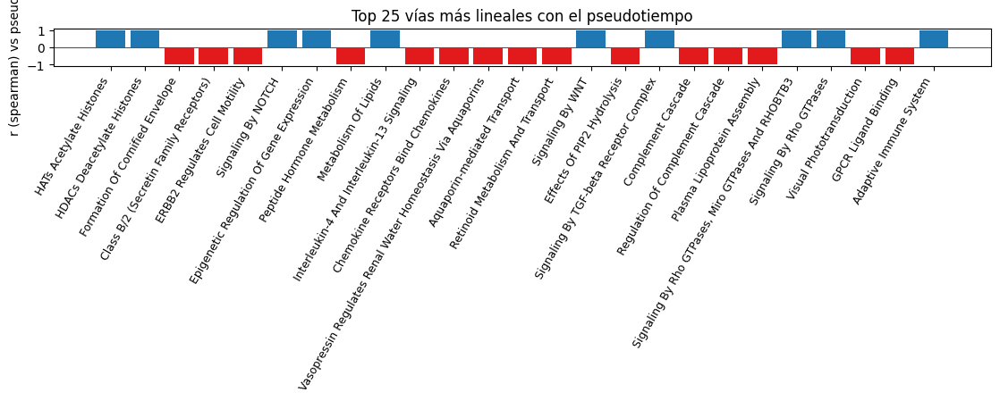

✅ Guardadas figuras de barras:
- ./figs/top_scores_vs_pt_correlation.png
- ./figs/top_scores_vs_pt_correlation.pdf
🧪 Top 25 vías seleccionadas (por |r|):
 1. r=+0.996 — HATs Acetylate Histones R-HSA-3214847_SCORE
 2. r=+0.995 — HDACs Deacetylate Histones R-HSA-3214815_SCORE
 3. r=-0.993 — Formation Of Cornified Envelope R-HSA-6809371_SCORE
 4. r=-0.993 — Class B/2 (Secretin Family Receptors) R-HSA-373080_SCORE
 5. r=-0.992 — ERBB2 Regulates Cell Motility R-HSA-6785631_SCORE
 6. r=+0.992 — Signaling By NOTCH R-HSA-157118_SCORE
 7. r=+0.990 — Epigenetic Regulation Of Gene Expression R-HSA-212165_SCORE
 8. r=-0.990 — Peptide Hormone Metabolism R-HSA-2980736_SCORE
 9. r=+0.989 — Metabolism Of Lipids R-HSA-556833_SCORE
10. r=-0.989 — Interleukin-4 And Interleukin-13 Signaling R-HSA-6785807_SCORE
11. r=-0.988 — Chemokine Receptors Bind Chemokines R-HSA-380108_SCORE
12. r=-0.987 — Vasopressin Regulates Renal Water Homeostasis Via Aquaporins R-HSA-432040_SCORE
13. r=-0.987 — Aquaporin-mediated

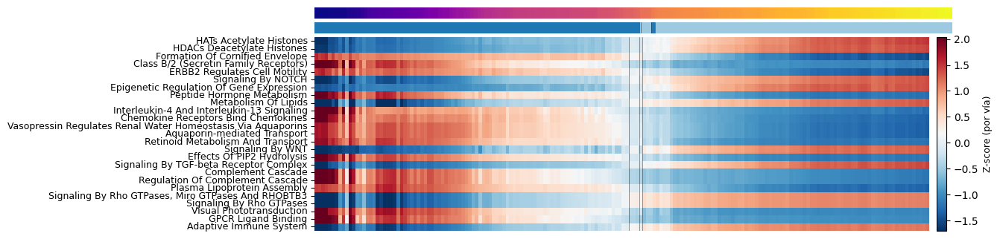

✅ Guardado:
- ./figs/heatmap_pt_cells_TOP_LINEAR.png
- ./figs/heatmap_pt_cells_TOP_LINEAR.pdf
✅ Heatmap (Top-K por correlación) generado.


In [ ]:
# ===================== SELECCIÓN DE VÍAS MÁS LINEALES CON EL PSEUDOTIEMPO =====================
import numpy as np, pandas as pd, re, os
import matplotlib.pyplot as plt
from scipy.stats import spearmanr, pearsonr

def select_top_scores_by_pseudotime_correlation(
    ad,
    pt_key=PT_KEY,
    use_flag_key=EXPAND_FLAG_KEY,         # usa mismas celdas que en el heatmap (ruta+expandidas por defecto)
    score_pattern=r"SCORE$",
    k=25,                                  # cuántas vías devolver
    method="spearman",                     # "spearman" (robusto a monotonicidad) o "pearson" (lineal)
    min_var=1e-12,                         # filtra scores constantes
    min_non_na=10,                         # mínimo de celdas para correlacionar
    out_csv="./figs/pt_score_correlations.csv",
    out_bar_png="./figs/top_scores_vs_pt_correlation.png",
    out_bar_pdf="./figs/top_scores_vs_pt_correlation.pdf"
):
    assert pt_key in ad.obs.columns, f"Falta ad.obs['{pt_key}']"
    mask = ad.obs[pt_key].notna()
    if use_flag_key in ad.obs.columns:
        mask &= ad.obs[use_flag_key].astype(bool)

    cells = ad.obs_names[mask]
    if cells.size < min_non_na:
        raise ValueError(f"No hay suficientes células con PT y flag ({cells.size} < {min_non_na}).")

    pt = ad.obs.loc[cells, pt_key].astype(float).values

    # Detectar todas las columnas *_SCORE
    score_cols = [c for c in ad.obs.columns if re.search(score_pattern, str(c), flags=re.I)]
    if not score_cols:
        raise ValueError("No se encontraron columnas *_SCORE en ad.obs.")

    rows = []
    for c in score_cols:
        s = pd.to_numeric(ad.obs.loc[cells, c], errors="coerce")
        # imputación por mediana local y varianza mínima
        s = s.fillna(s.median())
        if float(np.nanvar(s.values)) <= float(min_var):
            continue
        # correlación
        try:
            if method.lower().startswith("spear"):
                r, p = spearmanr(pt, s.values)
            else:
                r, p = pearsonr(pt, s.values)
        except Exception:
            continue
        if np.isfinite(r):
            rows.append((c, float(r), float(p)))

    if not rows:
        raise ValueError("Ningún *_SCORE pasó los filtros de varianza/correlación.")

    df_corr = pd.DataFrame(rows, columns=["score", "r", "p"])
    df_corr["abs_r"] = df_corr["r"].abs()
    df_corr = df_corr.sort_values("abs_r", ascending=False).reset_index(drop=True)

    os.makedirs(os.path.dirname(out_csv) or ".", exist_ok=True)
    df_corr.to_csv(out_csv, index=False)
    print(f"✅ Guardado ranking de correlaciones: {out_csv}")

    # Top-K
    top = df_corr.head(int(k)).copy()

    # Barplot de correlación (signo y magnitud)
    fig, ax = plt.subplots(figsize=(min(18, 6 + 0.22*len(top)), 4.6))
    colors = np.where(top["r"] >= 0, "#1f78b4", "#e31a1c")  # azul + / rojo -
    ax.bar(np.arange(len(top)), top["r"].values, width=0.85, color=colors)
    ax.set_xticks(np.arange(len(top)))
    # etiquetas cortas
    def _short_lbl(s):
        s = re.sub(r"\s*SCORE\s*$", "", s, flags=re.I)
        s = re.sub(r"\s*R-HSA-\d+(\.\d+)?\s*", "", s, flags=re.I)
        return s.replace("_"," ").strip()
    ax.set_xticklabels([_short_lbl(x) for x in top["score"].values], rotation=60, ha="right", fontsize=9)
    ax.axhline(0, color="#555555", lw=0.8)
    ax.set_ylabel(f"r ({method}) vs pseudotime", fontsize=10)
    ax.set_title(f"Top {len(top)} vías más lineales con el pseudotiempo", fontsize=12)
    fig.tight_layout()
    fig.savefig(out_bar_png, dpi=450, bbox_inches="tight")
    fig.savefig(out_bar_pdf, dpi=450, bbox_inches="tight")
    plt.show(); plt.close(fig)
    print(f"✅ Guardadas figuras de barras:\n- {out_bar_png}\n- {out_bar_pdf}")

    top_list = top["score"].tolist()
    return top_list, df_corr

# ========= Ejecutar selección y pintar heatmap con las Top-K más lineales =========
TOP_K = 25            # cambia este número si deseas más/menos vías
METHOD = "spearman"   # "spearman" es robusto a monotonicidad; usa "pearson" si quieres estrictamente lineal

top_scores, df_corr = select_top_scores_by_pseudotime_correlation(
    ad2,
    pt_key=PT_KEY,
    use_flag_key=EXPAND_FLAG_KEY,           # mismas celdas que usas en el heatmap principal
    score_pattern=r"SCORE$",
    k=TOP_K,
    method=METHOD,
    min_var=1e-12,
    min_non_na=20,
    out_csv="./figs/pt_score_correlations.csv",
    out_bar_png="./figs/top_scores_vs_pt_correlation.png",
    out_bar_pdf="./figs/top_scores_vs_pt_correlation.pdf"
)

print(f"🧪 Top {len(top_scores)} vías seleccionadas (por |r|):")
for i, s in enumerate(top_scores, 1):
    r = df_corr.loc[df_corr["score"]==s, "r"].iloc[0]
    print(f"{i:2d}. r={r:+.3f} — {s}")

# Heatmap usando SOLO las vías Top-K
heatmap_for_cells_with_pt(
    ad2, top_scores,
    pt_key=PT_KEY,
    use_flag_key=EXPAND_FLAG_KEY,     # o PATH_FLAG_KEY para solo ruta
    cluster_col=meta_col,
    palette=CL_COL if 'CL_COL' in globals() else None,
    zscore_per_row=True, cmap="RdBu_r",
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,
    width=16, height=3.5,
    out_png="./figs/heatmap_pt_cells_TOP_LINEAR.png",
    out_pdf="./figs/heatmap_pt_cells_TOP_LINEAR.pdf"
)
print("✅ Heatmap (Top-K por correlación) generado.")


✅ Subset hierarchical_cluster en ['1', '2']: 3233 células
ℹ️  Recalculando '2D_UMAP_RECLUSTERING' desde *_SCORE en el subset…
✅ UMAP 2D guardado en ad_sub.obsm['2D_UMAP_RECLUSTERING'] (k=1000)


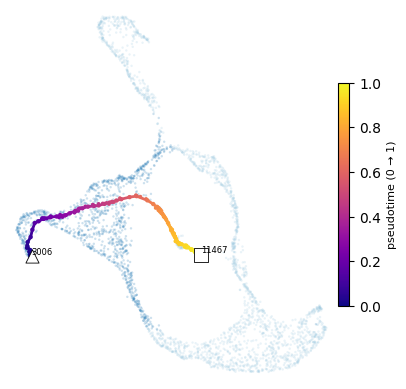

✅ Guardado:
- ./figs/umap_path_with_pseudotime.pdf
- ./figs/umap_path_with_pseudotime.png


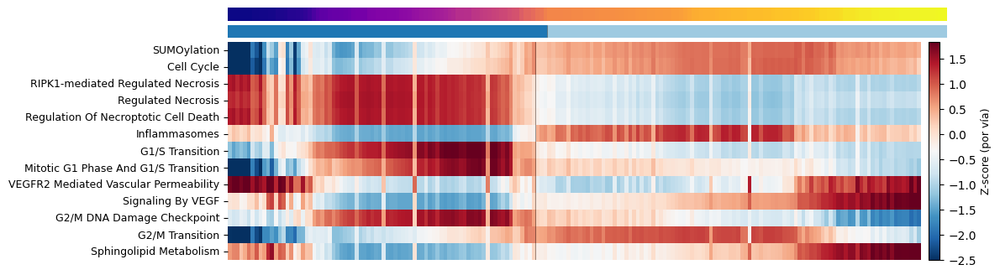

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf


In [ ]:
# =============================================================================
# SUBSET (meta 1 y 2) + RUTA + EXPANSIÓN + VISUALIZACIÓN (estilo PHATE) + HEATMAP
# sobre el UMAP 2D REECLUSTERIZADO del subset (obsm["2D_UMAP_RECLUSTERING"])
# =============================================================================
import os, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from sklearn.neighbors import NearestNeighbors
from scipy.sparse.csgraph import dijkstra
from scipy import sparse as sps

# --- para el bloque de rescate / UMAP ---
import scanpy as sc
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# ----------------------- Parámetros clave (AJUSTABLES) -----------------------
KEEP_META = ["1","2"]                      # metaclústeres a conservar
STORE_UMAP_KEY = "2D_UMAP_RECLUSTERIZING"  # <-- si TU clave es '2D_UMAP_RECLUSTERING', usa ese texto exacto
# Nota: si tu clave original es "2D_UMAP_RECLUSTERING", re-asigna: STORE_UMAP_KEY = "2D_UMAP_RECLUSTERING"
STORE_UMAP_KEY = "2D_UMAP_RECLUSTERING"

WEIGHT_KEY     = STORE_UMAP_KEY            # mismo embedding para pesos del grafo
N_NEIGHBORS    = 25                        # k del grafo para Dijkstra
EXPAND_KNN     = 15                        # k vecinos por nodo de ruta (expansión)
EXPAND_RADIUS  = 0.30                      # radio geométrico a la polilínea (expansión)
EXPAND_TO_N    = 180                       # objetivo total ruta + extras
PT_KEY         = "pseudotime_guided"
PATH_FLAG_KEY  = "guided_path_flag"
EXPAND_FLAG_KEY= "guided_expanded_flag"

# Paleta fija opcional (fondo por clúster)
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}

# ----------------------- Detectar columna de meta/cluster --------------------
def find_meta_col(ad):
    for c in [
        "meta_cluster","metacluster","MetaCluster",
        "meta_cluster_id","metacluster_id","metacluster_label",
        "hierarchical_metacluster","hierarchical_cluster",
    ]:
        if c in ad.obs.columns:
            return c
    raise KeyError("No encontré columna de meta-clúster/clúster en ad.obs.")

assert 'adata' in globals(), "Debes tener un AnnData llamado 'adata'."
meta_col = find_meta_col(adata)

# ---------------------- Subset SOLO 1 y 2 (se conserva obsm) -----------------
mask = adata.obs[meta_col].astype(str).isin(KEEP_META)
ad12 = adata[mask].copy()
print(f"✅ Subset {meta_col} en {KEEP_META}: {ad12.n_obs} células")

# ============================= BLOQUE DE RESCATE =============================
# Asegurar ad12.obsm[STORE_UMAP_KEY] heredándolo del padre si existe
# o recalculándolo desde *_SCORE -> PCA -> vecinos -> UMAP.

MIN_VAR = 1e-12
RANDOM_STATE = 0
MIN_DIST = 0.5
N_NEIGHBORS_UMAP = 1000
STORE_PCA_KEY = "X_pca_scores"

def _build_score_matrix(ad, score_cols=None, min_var=1e-12, standardize=True):
    if score_cols is None:
        score_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
    if not score_cols:
        raise ValueError("No se encontraron columnas *_SCORE en ad.obs.")
    df = ad.obs[score_cols].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)
    var = df.var(axis=0, ddof=0).values
    keep = var > float(min_var)
    if keep.sum() < 3:
        raise ValueError(f"Quedan <3 scores con var>0 (mantienen {keep.sum()}).")
    df = df.loc[:, keep]
    X = df.values
    if standardize:
        X = StandardScaler(with_mean=True, with_std=True).fit_transform(X)
    return X.astype(np.float32, copy=False), list(df.columns)

def ensure_umap_for_subset(ad_parent, ad_sub, store_umap_key=STORE_UMAP_KEY):
    # 1) Si ya está, nada que hacer
    if store_umap_key in ad_sub.obsm:
        print(f"✅ Ya existe ad_sub.obsm['{store_umap_key}']")
        return ad_sub

    # 2) Intentar heredar del AnnData padre (alineando por obs_names)
    if store_umap_key in ad_parent.obsm:
        U_parent = pd.DataFrame(ad_parent.obsm[store_umap_key], index=ad_parent.obs_names)
        try:
            U_sub = U_parent.loc[ad_sub.obs_names].values
            ad_sub.obsm[store_umap_key] = U_sub.astype(np.float32)
            print(f"✅ Heredado '{store_umap_key}' desde el AnnData padre (mismo embedding).")
            return ad_sub
        except KeyError:
            pass  # faltan celdas -> recalculamos

    # 3) Recalcular desde *_SCORE → PCA → vecinos → UMAP
    print(f"ℹ️  Recalculando '{store_umap_key}' desde *_SCORE en el subset…")
    X_scores, used_scores = _build_score_matrix(ad_sub, score_cols=None, min_var=MIN_VAR, standardize=True)
    n_comps = int(min(15, X_scores.shape[1], max(2, ad_sub.n_obs - 1)))
    pca = PCA(n_components=n_comps, svd_solver='randomized', random_state=RANDOM_STATE)
    Xp = pca.fit_transform(X_scores)
    ad_sub.obsm[STORE_PCA_KEY] = np.asarray(Xp, dtype=np.float32)
    k = int(max(2, min(N_NEIGHBORS_UMAP, ad_sub.n_obs - 1)))
    sc.pp.neighbors(ad_sub, use_rep=STORE_PCA_KEY, n_neighbors=k, metric="cosine")
    sc.tl.umap(ad_sub, n_components=2, random_state=RANDOM_STATE, min_dist=MIN_DIST, spread=1.0)
    ad_sub.obsm[store_umap_key] = ad_sub.obsm["X_umap"].copy()
    print(f"✅ UMAP 2D guardado en ad_sub.obsm['{store_umap_key}'] (k={k})")
    return ad_sub

# Ejecutar rescate
ad12 = ensure_umap_for_subset(adata, ad12, store_umap_key=STORE_UMAP_KEY)
# =========================== FIN BLOQUE DE RESCATE ===========================

# =============================================================================
# Utilidades geométricas y de grafo (fundamento estilo PHATE)
# =============================================================================
def _arc_length(P: np.ndarray) -> np.ndarray:
    P = np.asarray(P)
    if P.shape[0] < 2: return np.array([0.0], float)
    seg = np.linalg.norm(P[1:] - P[:-1], axis=1)
    return np.concatenate([[0.0], np.cumsum(seg)])

def _project_points_onto_polyline(P: np.ndarray, cum: np.ndarray, Q: np.ndarray, return_dist=False):
    P = np.asarray(P); Q = np.asarray(Q); cum = np.asarray(cum)
    n_seg = P.shape[0] - 1
    if n_seg <= 0:
        if return_dist: return np.zeros(Q.shape[0], float), np.linalg.norm(Q - P[0], axis=1)
        return np.zeros(Q.shape[0], float)
    total = float(cum[-1]) if cum[-1] > 0 else 1.0
    t_out = np.zeros(Q.shape[0], float); d_out = np.full(Q.shape[0], np.inf, float)
    for qi, q in enumerate(Q):
        best_d2, best_t = np.inf, 0.0
        for i in range(n_seg):
            a = P[i]; b = P[i+1]; v = b - a; L2 = float(np.dot(v, v))
            if L2 == 0.0:
                u = 0.0; d2 = float(np.dot(q - a, q - a))
            else:
                u = float(np.dot(q - a, v) / L2); u = 0.0 if u < 0.0 else (1.0 if u > 1.0 else u)
                proj = a + u * v; d2 = float(np.dot(q - proj, q - proj))
            if d2 < best_d2:
                best_d2 = d2; best_t = (cum[i] + u * np.sqrt(L2)) / total
        t_out[qi] = best_t; d_out[qi] = np.sqrt(best_d2)
    return (t_out, d_out) if return_dist else t_out

def _build_knn_graph_safe(ad, rep_key=STORE_UMAP_KEY, n_neighbors=N_NEIGHBORS, weight_embed_key=WEIGHT_KEY):
    assert rep_key in ad.obsm and weight_embed_key in ad.obsm
    X = np.asarray(ad.obsm[rep_key]); W = np.asarray(ad.obsm[weight_embed_key])
    k = int(min(max(2, n_neighbors), X.shape[0]-1))
    nbrs = NearestNeighbors(n_neighbors=k+1, metric="euclidean").fit(X)
    _, inds = nbrs.kneighbors(X, return_distance=True)
    rows, cols, data = [], [], []
    n = ad.n_obs
    for i in range(n):
        js = inds[i, 1:]
        wi = W[i]
        for j in js:
            w = float(np.linalg.norm(wi - W[j])); w = 1.0 if not np.isfinite(w) else w
            rows.append(i); cols.append(j); data.append(w)
    G = sps.csr_matrix((data, (rows, cols)), shape=(n, n))
    return sps.csr_matrix.minimum(G, G.T)

def _shortest_path_indices_safe(G, src, dst):
    dist, pred = dijkstra(G, directed=False, indices=src, return_predecessors=True)
    if not np.isfinite(dist[dst]): return None
    path = [dst]; cur = dst
    while cur != src:
        cur = pred[cur]
        if cur == -9999: return None
        path.append(cur)
    return path[::-1]

# ---------------- Ruta guiada + expansión combinada + pseudotiempo -----------
def guided_pseudotime_by_ids_safe(
    ad, ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_to_n=EXPAND_TO_N, expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS
):
    ad = ad.copy()
    name_to_idx = {str(n): i for i,n in enumerate(ad.obs_names.astype(str))}
    miss = [cid for cid in ids_path if str(cid) not in name_to_idx]
    if miss: raise KeyError(f"IDs no encontrados en el subset 1+2: {miss}")

    G = _build_knn_graph_safe(ad, rep_key=rep_key, n_neighbors=n_neighbors, weight_embed_key=weight_embed_key)
    anchors = [name_to_idx[str(a)] for a in ids_path]

    route = []
    for ia, ib in zip(anchors[:-1], anchors[1:]):
        seg = _shortest_path_indices_safe(G, ia, ib)
        if not seg:
            raise ValueError(f"No hay camino entre '{ad.obs_names[ia]}' y '{ad.obs_names[ib]}'. Sube n_neighbors (p.ej., 30).")
        route.extend(seg[1:] if (route and seg[0]==route[-1]) else seg)
    route = np.array(route, int)

    W = np.asarray(ad.obsm[weight_embed_key])
    W_route = W[route]
    cum = _arc_length(W_route)
    pt_route = (cum / cum[-1]) if cum[-1] > 0 else np.linspace(0, 1, route.size)

    PT = np.full(ad.n_obs, np.nan, float); PT[route] = pt_route
    path_flag = np.zeros(ad.n_obs, bool); path_flag[route] = True
    expanded_flag = path_flag.copy()

    # Candidatos por kNN y/o radio
    cand = np.array([], int)
    if (expand_knn is not None) and (expand_knn > 0):
        kexp = int(min(expand_knn, ad.n_obs-1))
        nbrs = NearestNeighbors(n_neighbors=kexp+1, metric="euclidean").fit(W)
        _, inds = nbrs.kneighbors(W_route)
        knn_idx = np.unique(inds[:, 1:].ravel())
        knn_idx = knn_idx[~np.isin(knn_idx, route)]
        cand = knn_idx if cand.size == 0 else np.unique(np.concatenate([cand, knn_idx]))

    if (expand_radius is not None) and (expand_radius > 0):
        _, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)
        rad_idx = np.where(d_all <= float(expand_radius))[0]
        rad_idx = rad_idx[~np.isin(rad_idx, route)]
        cand = rad_idx if cand.size == 0 else np.unique(np.concatenate([cand, rad_idx]))

    # Ajustar a N total
    extras = cand
    if (extras.size > 0) or (expand_to_n is not None):
        t_all, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)

    if expand_to_n is not None:
        need_total = max(int(expand_to_n) - route.size, 0)
        if extras.size > need_total > 0:
            order = np.argsort(d_all[extras]); extras = extras[order][:need_total]
        elif extras.size < need_total:
            mask = np.ones(ad.n_obs, bool); mask[route] = False
            if extras.size > 0: mask[extras] = False
            pool = np.where(mask)[0]
            if pool.size > 0:
                order = np.argsort(d_all[pool])
                fill = pool[order][: (need_total - extras.size)]
                extras = fill if extras.size == 0 else np.unique(np.concatenate([extras, fill]))

    if extras.size > 0:
        t_extra = _project_points_onto_polyline(W_route, cum, W[extras])
        PT[extras] = t_extra
        expanded = np.unique(np.concatenate([route, extras])).astype(int)
        expanded_flag[:] = False; expanded_flag[expanded] = True

    ad.obs[out_key] = PT
    ad.obs[path_flag_key] = path_flag
    ad.obs[expanded_flag_key] = expanded_flag
    return ad, route

# ----------------------------- Visualización (UMAP 2D) -----------------------
def plot_umap_path_with_pseudotime(
    ad, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    bg_mode="cluster", s_bg=3.0, alpha_bg=0.22,
    s_expanded=7, s_route=10, lw=2.0, cmap="plasma",
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=None, label_fontsize=6, rasterize_axes=True
):
    assert coords_key in ad.obsm, f"Falta ad.obsm['{coords_key}']"
    XY = np.asarray(ad.obsm[coords_key]); assert XY.shape[1] == 2
    route_idx = np.asarray(route_idx, int); xy_path = XY[route_idx]
    if pt_key not in ad.obs.columns: raise KeyError(f"Falta ad.obs['{pt_key}']")
    PT = np.asarray(ad.obs[pt_key].values, float)

    os.makedirs(os.path.dirname(out_pdf) or ".", exist_ok=True)
    fig, ax = plt.subplots(figsize=(4.8, 4.8))   # sin constrained_layout; usaremos bbox_inches="tight"
    if rasterize_axes: ax.set_rasterization_zorder(1)

    # Fondo
    if (bg_mode == "cluster") and (cluster_col in ad.obs.columns):
        cl = ad.obs[cluster_col].astype(str).values
        pal = palette or {}
        uniq = np.unique(cl)
        if not pal:
            tab = plt.cm.get_cmap("tab20", len(uniq))
            pal = {u: tab(i) for i, u in enumerate(uniq)}
        ax.scatter(XY[:,0], XY[:,1], s=s_bg,
                   c=[pal.get(c, "#bdbdbd") for c in cl],
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)
    else:
        ax.scatter(XY[:,0], XY[:,1], s=s_bg, c="#9e9e9e",
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)

    # Expandidas (sin repetir ruta)
    if expanded_flag_key in ad.obs.columns:
        expanded_mask = ad.obs[expanded_flag_key].values.astype(bool)
        if path_flag_key in ad.obs.columns:
            expanded_mask &= ~ad.obs[path_flag_key].values.astype(bool)
        valid = expanded_mask & np.isfinite(PT)
        if valid.any():
            ax.scatter(XY[valid,0], XY[valid,1],
                       c=PT[valid], cmap=cmap, s=s_expanded,
                       linewidths=0, zorder=1.5, rasterized=True)

    # Polilínea coloreada por PT
    if route_idx.size >= 2:
        segs = np.stack([xy_path[:-1], xy_path[1:]], axis=1)
        pt_path = PT[route_idx]
        if not np.isfinite(pt_path).all():
            n = pt_path.size; x = np.arange(n); good = np.isfinite(pt_path)
            pt_path = np.interp(x, x[good], pt_path[good])
        lc = LineCollection(segs, cmap=cmap, linewidths=lw, zorder=3)
        lc.set_array(pt_path[:-1]); ax.add_collection(lc)

    sc_route = ax.scatter(xy_path[:,0], xy_path[:,1],
                          c=PT[route_idx], cmap=cmap,
                          s=s_route, linewidths=0, zorder=3.2)

    # Inicio/fin
    ax.scatter(*xy_path[0],  marker="^", s=s_route*9, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)
    ax.scatter(*xy_path[-1], marker="s", s=s_route*10, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)

    # IDs ancla
    if show_ids:
        name_to_idx = {str(n): i for i,n in enumerate(ad.obs_names.astype(str))}
        for oid in show_ids:
            k = name_to_idx.get(str(oid))
            if k is None: continue
            if np.any(route_idx == k):
                x, y = XY[k]
                ax.text(x, y, str(oid), fontsize=label_fontsize,
                        ha="left", va="bottom", zorder=5)

    # Límites
    if extent == "all":
        x_min, x_max = XY[:,0].min(), XY[:,0].max()
        y_min, y_max = XY[:,1].min(), XY[:,1].max()
        dx, dy = (x_max - x_min), (y_max - y_min)
    else:
        x_min, x_max = xy_path[:,0].min(), xy_path[:,0].max()
        y_min, y_max = xy_path[:,1].min(), xy_path[:,1].max()
        dx, dy = np.ptp(xy_path[:,0]), np.ptp(xy_path[:,1])
    pad = float(pad)
    ax.set_xlim(x_min - pad*max(dx,1e-9), x_max + pad*max(dx,1e-9))
    ax.set_ylim(y_min - pad*max(dy,1e-9), y_max + pad*max(dy,1e-9))
    ax.set_aspect("equal","box"); ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values(): sp.set_visible(False)

    cbar = fig.colorbar(sc_route, ax=ax, fraction=0.03, pad=0.015)
    cbar.set_label("pseudotime (0 → 1)", fontsize=8)

    os.makedirs("./figs", exist_ok=True)
    # ✅ usa bbox_inches="tight" (no valores numéricos)
    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_png, dpi=500, bbox_inches="tight", pad_inches=0.02)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_pdf}\n- {out_png}")

# ------------------------------ Heatmap alineado ------------------------------
def _short_lbl(s: str) -> str:
    s = re.sub(r"\s*SCORE\s*$", "", s, flags=re.I)
    s = re.sub(r"\s*R-HSA-\d+(\.\d+)?\s*", "", s, flags=re.I)
    return s.replace("_"," ").strip()

def heatmap_for_cells_with_pt(
    ad, selected_scores, pt_key=PT_KEY,
    use_flag_key=EXPAND_FLAG_KEY,       # o PATH_FLAG_KEY para solo ruta
    cluster_col=meta_col, palette=CL_COL,
    zscore_per_row=True, cmap="RdBu_r",
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,
    width=None, height=None, per_col=0.012, per_row=0.35,
    min_w=7.0, max_w=18.5, min_h=4.8,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
):
    import numpy as np, pandas as pd, re, os
    import matplotlib.pyplot as plt
    from matplotlib.colors import to_rgba

    assert pt_key in ad.obs.columns, f"Falta ad.obs['{pt_key}']"
    mask = ad.obs[pt_key].notna()
    if use_flag_key in ad.obs.columns: mask &= ad.obs[use_flag_key].astype(bool)
    cells = ad.obs_names[mask]
    if cells.size == 0: raise ValueError("No hay células con pseudotiempo para mostrar.")

    pt = ad.obs.loc[cells, pt_key].astype(float).values
    order = np.argsort(pt); cells = cells[order]; pt = pt[order]

    cols_exist = [c for c in (selected_scores or []) if c in ad.obs.columns]
    if not cols_exist:
        auto_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
        if len(auto_cols) == 0:
            raise ValueError("No hay columnas *_SCORE en ad.obs para el heatmap.")
        cols_exist = auto_cols

    df = ad.obs.loc[cells, cols_exist].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)
    M = df.T

    if zscore_per_row:
        mu = M.mean(axis=1).values[:, None]
        sd = M.std(axis=1).replace(0, np.nan).values[:, None]
        Z = (M.values - mu) / sd
        Z = np.nan_to_num(Z, nan=0.0)
        data = Z; cbar_label = "Z-score (por vía)"
    else:
        data = M.values; cbar_label = "Score"

    row_labels = [_short_lbl(c) for c in M.index]
    n_rows, n_cols = data.shape

    # tira de cluster
    strip_rgba, bounds = None, np.array([], int)
    if (cluster_col is not None) and (cluster_col in ad.obs.columns):
        cl_ord = ad.obs.loc[cells, cluster_col].astype(str).values
        pal = palette or {}
        if not pal:
            uniq = np.unique(cl_ord); tab = plt.cm.get_cmap("tab20", len(uniq))
            pal = {u: tab(i) for i, u in enumerate(uniq)}
        strip_rgba = np.array([to_rgba(pal.get(x, "#bdbdbd")) for x in cl_ord], float)[None, :, :]
        bounds = np.where(cl_ord[1:] != cl_ord[:-1])[0] + 1

    # tamaños
    have_pttrk = bool(show_pt_track); have_strip = strip_rgba is not None
    ratios = []
    if have_pttrk: ratios.append(0.55)
    if have_strip: ratios.append(0.55)
    ratios.append(9.4)

    if width is None:  fig_w = max(min_w, min(max_w, 6.5 + per_col*n_cols))
    else:              fig_w = float(width)
    extra_h = (0.25 if have_pttrk else 0) + (0.25 if have_strip else 0)
    if height is None: fig_h = max(min_h, 2.2 + per_row*n_rows + extra_h)
    else:              fig_h = float(height)

    os.makedirs(os.path.dirname(out_png) or ".", exist_ok=True)
    fig, axes = plt.subplots(len(ratios), 1, sharex=True,
                             gridspec_kw={"height_ratios": ratios},
                             figsize=(fig_w, fig_h))  # sin constrained_layout
    if not isinstance(axes, (list, np.ndarray)): axes = [axes]
    ax_idx = 0

    max_lbl = max(len(x) for x in row_labels) if row_labels else 12
    left_margin = min(0.45, 0.14 + 0.009*max_lbl)
    fig.subplots_adjust(left=left_margin, right=0.985, top=0.92, bottom=0.06, hspace=0.05)

    # (1) PT track
    if have_pttrk:
        ax_pt = axes[ax_idx]; ax_idx += 1
        ax_pt.imshow(pt[None, :], aspect="auto", cmap=pt_cmap,
                     interpolation="nearest", origin="upper",
                     extent=(-0.5, n_cols-0.5, 0.5, -0.5), rasterized=True)
        ax_pt.set_yticks([]); ax_pt.set_xticks([])
        for sp in ax_pt.spines.values(): sp.set_visible(False)
        if show_pt_ticks:
            ax_pt_top = ax_pt.secondary_xaxis("top")
            ax_pt_top.set_xticks([0.0, 0.5, 1.0], labels=["0.0","0.5","1.0"])
            ax_pt_top.set_xlabel("Pseudotime", fontsize=9)
            ax_pt_top.tick_params(labelsize=8)

    # (2) strip cluster
    if have_strip:
        ax_strip_ax = axes[ax_idx]; ax_idx += 1
        ax_strip_ax.imshow(strip_rgba, aspect="auto", interpolation="nearest",
                           origin="upper", rasterized=True,
                           extent=(-0.5, n_cols-0.5, 0.5, -0.5))
        ax_strip_ax.set_yticks([]); ax_strip_ax.set_xticks([])
        for b in bounds: ax_strip_ax.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
        for sp in ax_strip_ax.spines.values(): sp.set_visible(False)

    # (3) Heatmap
    ax_hm = axes[ax_idx]
    vmin, vmax = np.percentile(data, 1), np.percentile(data, 99)
    im = ax_hm.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax,
                      interpolation="nearest", aspect="auto",
                      origin="upper", rasterized=True,
                      extent=(-0.5, n_cols-0.5, n_rows-0.5, -0.5))
    ax_hm.set_yticks(np.arange(n_rows))
    ax_hm.set_yticklabels(row_labels, fontsize=9, va="center")
    ax_hm.set_ylim(n_rows-0.5, -0.5); ax_hm.set_xticks([])
    for b in bounds: ax_hm.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
    for sp in ax_hm.spines.values(): sp.set_visible(False)

    cbar = fig.colorbar(im, ax=ax_hm, fraction=0.025, pad=0.012)
    cbar.set_label(cbar_label, fontsize=9)

    # ✅ usa bbox_inches="tight" (evita AttributeError)
    fig.savefig(out_png, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_png}\n- {out_pdf}")

# =============================================================================
# VÍAS (puedes cambiar esta lista; si queda vacía o ninguna existe, auto *_SCORE)
# =============================================================================
SELECTED_SCORES = [
 'SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE',
 'RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE','Regulated Necrosis R-HSA-5218859_SCORE',
 'Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE',
 'G1/S Transition R-HSA-69206_SCORE','Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE',
 'VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE',
 'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE',
 'Sphingolipid Metabolism R-HSA-428157_SCORE'
]

# =============================================================================
# EJECUCIÓN (ajusta ids_path si quieres). Deben existir en ad12.obs_names.
# =============================================================================
ids_path = ["3006","11467"]  # <-- tus anclas dentro del SUBSET 1+2

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Visualización (estilo PHATE pero sobre UMAP 2D del subset)
plot_umap_path_with_pseudotime(
    ad2, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=ids_path
)

# Heatmap alineado por pseudotiempo (si SELECTED_SCORES no existen, auto *_SCORE)
heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    width=16, height=3.5,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)


✅ Subset hierarchical_cluster en ['1', '2']: 3233 células
ℹ️  Recalculando '2D_UMAP_RECLUSTERING' desde *_SCORE en el subset…
✅ UMAP 2D guardado en ad_sub.obsm['2D_UMAP_RECLUSTERING'] (k=1000)


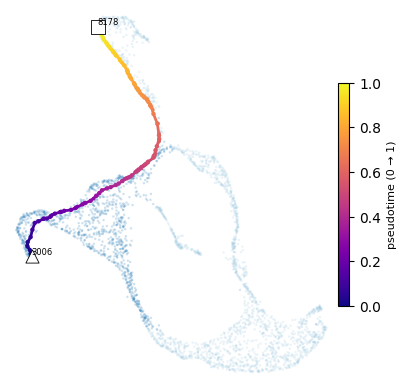

✅ Guardado:
- ./figs/umap_path_with_pseudotime.pdf
- ./figs/umap_path_with_pseudotime.png


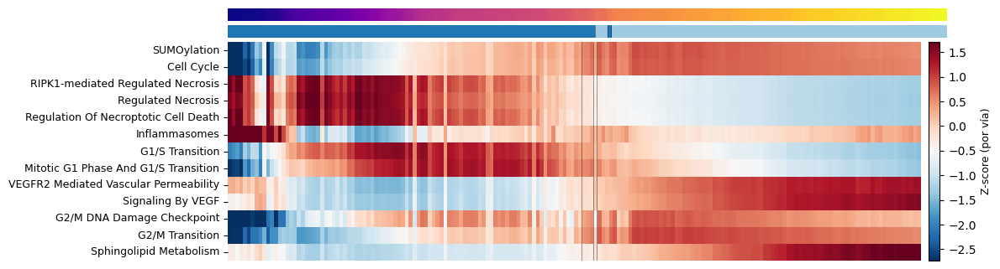

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf


In [ ]:
# =============================================================================
# SUBSET (meta 1 y 2) + RUTA + EXPANSIÓN + VISUALIZACIÓN (estilo PHATE) + HEATMAP
# sobre el UMAP 2D REECLUSTERIZADO del subset (obsm["2D_UMAP_RECLUSTERING"])
# =============================================================================
import os, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from sklearn.neighbors import NearestNeighbors
from scipy.sparse.csgraph import dijkstra
from scipy import sparse as sps

# --- para el bloque de rescate / UMAP ---
import scanpy as sc
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# ----------------------- Parámetros clave (AJUSTABLES) -----------------------
KEEP_META = ["1","2"]                      # metaclústeres a conservar
STORE_UMAP_KEY = "2D_UMAP_RECLUSTERIZING"  # <-- si TU clave es '2D_UMAP_RECLUSTERING', usa ese texto exacto
# Nota: si tu clave original es "2D_UMAP_RECLUSTERING", re-asigna: STORE_UMAP_KEY = "2D_UMAP_RECLUSTERING"
STORE_UMAP_KEY = "2D_UMAP_RECLUSTERING"

WEIGHT_KEY     = STORE_UMAP_KEY            # mismo embedding para pesos del grafo
N_NEIGHBORS    = 25                        # k del grafo para Dijkstra
EXPAND_KNN     = 15                        # k vecinos por nodo de ruta (expansión)
EXPAND_RADIUS  = 0.30                      # radio geométrico a la polilínea (expansión)
EXPAND_TO_N    = 180                       # objetivo total ruta + extras
PT_KEY         = "pseudotime_guided"
PATH_FLAG_KEY  = "guided_path_flag"
EXPAND_FLAG_KEY= "guided_expanded_flag"

# Paleta fija opcional (fondo por clúster)
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}

# ----------------------- Detectar columna de meta/cluster --------------------
def find_meta_col(ad):
    for c in [
        "meta_cluster","metacluster","MetaCluster",
        "meta_cluster_id","metacluster_id","metacluster_label",
        "hierarchical_metacluster","hierarchical_cluster",
    ]:
        if c in ad.obs.columns:
            return c
    raise KeyError("No encontré columna de meta-clúster/clúster en ad.obs.")

assert 'adata' in globals(), "Debes tener un AnnData llamado 'adata'."
meta_col = find_meta_col(adata)

# ---------------------- Subset SOLO 1 y 2 (se conserva obsm) -----------------
mask = adata.obs[meta_col].astype(str).isin(KEEP_META)
ad12 = adata[mask].copy()
print(f"✅ Subset {meta_col} en {KEEP_META}: {ad12.n_obs} células")

# ============================= BLOQUE DE RESCATE =============================
# Asegurar ad12.obsm[STORE_UMAP_KEY] heredándolo del padre si existe
# o recalculándolo desde *_SCORE -> PCA -> vecinos -> UMAP.

MIN_VAR = 1e-12
RANDOM_STATE = 0
MIN_DIST = 0.5
N_NEIGHBORS_UMAP = 1000
STORE_PCA_KEY = "X_pca_scores"

def _build_score_matrix(ad, score_cols=None, min_var=1e-12, standardize=True):
    if score_cols is None:
        score_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
    if not score_cols:
        raise ValueError("No se encontraron columnas *_SCORE en ad.obs.")
    df = ad.obs[score_cols].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)
    var = df.var(axis=0, ddof=0).values
    keep = var > float(min_var)
    if keep.sum() < 3:
        raise ValueError(f"Quedan <3 scores con var>0 (mantienen {keep.sum()}).")
    df = df.loc[:, keep]
    X = df.values
    if standardize:
        X = StandardScaler(with_mean=True, with_std=True).fit_transform(X)
    return X.astype(np.float32, copy=False), list(df.columns)

def ensure_umap_for_subset(ad_parent, ad_sub, store_umap_key=STORE_UMAP_KEY):
    # 1) Si ya está, nada que hacer
    if store_umap_key in ad_sub.obsm:
        print(f"✅ Ya existe ad_sub.obsm['{store_umap_key}']")
        return ad_sub

    # 2) Intentar heredar del AnnData padre (alineando por obs_names)
    if store_umap_key in ad_parent.obsm:
        U_parent = pd.DataFrame(ad_parent.obsm[store_umap_key], index=ad_parent.obs_names)
        try:
            U_sub = U_parent.loc[ad_sub.obs_names].values
            ad_sub.obsm[store_umap_key] = U_sub.astype(np.float32)
            print(f"✅ Heredado '{store_umap_key}' desde el AnnData padre (mismo embedding).")
            return ad_sub
        except KeyError:
            pass  # faltan celdas -> recalculamos

    # 3) Recalcular desde *_SCORE → PCA → vecinos → UMAP
    print(f"ℹ️  Recalculando '{store_umap_key}' desde *_SCORE en el subset…")
    X_scores, used_scores = _build_score_matrix(ad_sub, score_cols=None, min_var=MIN_VAR, standardize=True)
    n_comps = int(min(15, X_scores.shape[1], max(2, ad_sub.n_obs - 1)))
    pca = PCA(n_components=n_comps, svd_solver='randomized', random_state=RANDOM_STATE)
    Xp = pca.fit_transform(X_scores)
    ad_sub.obsm[STORE_PCA_KEY] = np.asarray(Xp, dtype=np.float32)
    k = int(max(2, min(N_NEIGHBORS_UMAP, ad_sub.n_obs - 1)))
    sc.pp.neighbors(ad_sub, use_rep=STORE_PCA_KEY, n_neighbors=k, metric="cosine")
    sc.tl.umap(ad_sub, n_components=2, random_state=RANDOM_STATE, min_dist=MIN_DIST, spread=1.0)
    ad_sub.obsm[store_umap_key] = ad_sub.obsm["X_umap"].copy()
    print(f"✅ UMAP 2D guardado en ad_sub.obsm['{store_umap_key}'] (k={k})")
    return ad_sub

# Ejecutar rescate
ad12 = ensure_umap_for_subset(adata, ad12, store_umap_key=STORE_UMAP_KEY)
# =========================== FIN BLOQUE DE RESCATE ===========================

# =============================================================================
# Utilidades geométricas y de grafo (fundamento estilo PHATE)
# =============================================================================
def _arc_length(P: np.ndarray) -> np.ndarray:
    P = np.asarray(P)
    if P.shape[0] < 2: return np.array([0.0], float)
    seg = np.linalg.norm(P[1:] - P[:-1], axis=1)
    return np.concatenate([[0.0], np.cumsum(seg)])

def _project_points_onto_polyline(P: np.ndarray, cum: np.ndarray, Q: np.ndarray, return_dist=False):
    P = np.asarray(P); Q = np.asarray(Q); cum = np.asarray(cum)
    n_seg = P.shape[0] - 1
    if n_seg <= 0:
        if return_dist: return np.zeros(Q.shape[0], float), np.linalg.norm(Q - P[0], axis=1)
        return np.zeros(Q.shape[0], float)
    total = float(cum[-1]) if cum[-1] > 0 else 1.0
    t_out = np.zeros(Q.shape[0], float); d_out = np.full(Q.shape[0], np.inf, float)
    for qi, q in enumerate(Q):
        best_d2, best_t = np.inf, 0.0
        for i in range(n_seg):
            a = P[i]; b = P[i+1]; v = b - a; L2 = float(np.dot(v, v))
            if L2 == 0.0:
                u = 0.0; d2 = float(np.dot(q - a, q - a))
            else:
                u = float(np.dot(q - a, v) / L2); u = 0.0 if u < 0.0 else (1.0 if u > 1.0 else u)
                proj = a + u * v; d2 = float(np.dot(q - proj, q - proj))
            if d2 < best_d2:
                best_d2 = d2; best_t = (cum[i] + u * np.sqrt(L2)) / total
        t_out[qi] = best_t; d_out[qi] = np.sqrt(best_d2)
    return (t_out, d_out) if return_dist else t_out

def _build_knn_graph_safe(ad, rep_key=STORE_UMAP_KEY, n_neighbors=N_NEIGHBORS, weight_embed_key=WEIGHT_KEY):
    assert rep_key in ad.obsm and weight_embed_key in ad.obsm
    X = np.asarray(ad.obsm[rep_key]); W = np.asarray(ad.obsm[weight_embed_key])
    k = int(min(max(2, n_neighbors), X.shape[0]-1))
    nbrs = NearestNeighbors(n_neighbors=k+1, metric="euclidean").fit(X)
    _, inds = nbrs.kneighbors(X, return_distance=True)
    rows, cols, data = [], [], []
    n = ad.n_obs
    for i in range(n):
        js = inds[i, 1:]
        wi = W[i]
        for j in js:
            w = float(np.linalg.norm(wi - W[j])); w = 1.0 if not np.isfinite(w) else w
            rows.append(i); cols.append(j); data.append(w)
    G = sps.csr_matrix((data, (rows, cols)), shape=(n, n))
    return sps.csr_matrix.minimum(G, G.T)

def _shortest_path_indices_safe(G, src, dst):
    dist, pred = dijkstra(G, directed=False, indices=src, return_predecessors=True)
    if not np.isfinite(dist[dst]): return None
    path = [dst]; cur = dst
    while cur != src:
        cur = pred[cur]
        if cur == -9999: return None
        path.append(cur)
    return path[::-1]

# ---------------- Ruta guiada + expansión combinada + pseudotiempo -----------
def guided_pseudotime_by_ids_safe(
    ad, ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_to_n=EXPAND_TO_N, expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS
):
    ad = ad.copy()
    name_to_idx = {str(n): i for i,n in enumerate(ad.obs_names.astype(str))}
    miss = [cid for cid in ids_path if str(cid) not in name_to_idx]
    if miss: raise KeyError(f"IDs no encontrados en el subset 1+2: {miss}")

    G = _build_knn_graph_safe(ad, rep_key=rep_key, n_neighbors=n_neighbors, weight_embed_key=weight_embed_key)
    anchors = [name_to_idx[str(a)] for a in ids_path]

    route = []
    for ia, ib in zip(anchors[:-1], anchors[1:]):
        seg = _shortest_path_indices_safe(G, ia, ib)
        if not seg:
            raise ValueError(f"No hay camino entre '{ad.obs_names[ia]}' y '{ad.obs_names[ib]}'. Sube n_neighbors (p.ej., 30).")
        route.extend(seg[1:] if (route and seg[0]==route[-1]) else seg)
    route = np.array(route, int)

    W = np.asarray(ad.obsm[weight_embed_key])
    W_route = W[route]
    cum = _arc_length(W_route)
    pt_route = (cum / cum[-1]) if cum[-1] > 0 else np.linspace(0, 1, route.size)

    PT = np.full(ad.n_obs, np.nan, float); PT[route] = pt_route
    path_flag = np.zeros(ad.n_obs, bool); path_flag[route] = True
    expanded_flag = path_flag.copy()

    # Candidatos por kNN y/o radio
    cand = np.array([], int)
    if (expand_knn is not None) and (expand_knn > 0):
        kexp = int(min(expand_knn, ad.n_obs-1))
        nbrs = NearestNeighbors(n_neighbors=kexp+1, metric="euclidean").fit(W)
        _, inds = nbrs.kneighbors(W_route)
        knn_idx = np.unique(inds[:, 1:].ravel())
        knn_idx = knn_idx[~np.isin(knn_idx, route)]
        cand = knn_idx if cand.size == 0 else np.unique(np.concatenate([cand, knn_idx]))

    if (expand_radius is not None) and (expand_radius > 0):
        _, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)
        rad_idx = np.where(d_all <= float(expand_radius))[0]
        rad_idx = rad_idx[~np.isin(rad_idx, route)]
        cand = rad_idx if cand.size == 0 else np.unique(np.concatenate([cand, rad_idx]))

    # Ajustar a N total
    extras = cand
    if (extras.size > 0) or (expand_to_n is not None):
        t_all, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)

    if expand_to_n is not None:
        need_total = max(int(expand_to_n) - route.size, 0)
        if extras.size > need_total > 0:
            order = np.argsort(d_all[extras]); extras = extras[order][:need_total]
        elif extras.size < need_total:
            mask = np.ones(ad.n_obs, bool); mask[route] = False
            if extras.size > 0: mask[extras] = False
            pool = np.where(mask)[0]
            if pool.size > 0:
                order = np.argsort(d_all[pool])
                fill = pool[order][: (need_total - extras.size)]
                extras = fill if extras.size == 0 else np.unique(np.concatenate([extras, fill]))

    if extras.size > 0:
        t_extra = _project_points_onto_polyline(W_route, cum, W[extras])
        PT[extras] = t_extra
        expanded = np.unique(np.concatenate([route, extras])).astype(int)
        expanded_flag[:] = False; expanded_flag[expanded] = True

    ad.obs[out_key] = PT
    ad.obs[path_flag_key] = path_flag
    ad.obs[expanded_flag_key] = expanded_flag
    return ad, route

# ----------------------------- Visualización (UMAP 2D) -----------------------
def plot_umap_path_with_pseudotime(
    ad, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    bg_mode="cluster", s_bg=3.0, alpha_bg=0.22,
    s_expanded=7, s_route=10, lw=2.0, cmap="plasma",
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=None, label_fontsize=6, rasterize_axes=True
):
    assert coords_key in ad.obsm, f"Falta ad.obsm['{coords_key}']"
    XY = np.asarray(ad.obsm[coords_key]); assert XY.shape[1] == 2
    route_idx = np.asarray(route_idx, int); xy_path = XY[route_idx]
    if pt_key not in ad.obs.columns: raise KeyError(f"Falta ad.obs['{pt_key}']")
    PT = np.asarray(ad.obs[pt_key].values, float)

    os.makedirs(os.path.dirname(out_pdf) or ".", exist_ok=True)
    fig, ax = plt.subplots(figsize=(4.8, 4.8))   # sin constrained_layout; usaremos bbox_inches="tight"
    if rasterize_axes: ax.set_rasterization_zorder(1)

    # Fondo
    if (bg_mode == "cluster") and (cluster_col in ad.obs.columns):
        cl = ad.obs[cluster_col].astype(str).values
        pal = palette or {}
        uniq = np.unique(cl)
        if not pal:
            tab = plt.cm.get_cmap("tab20", len(uniq))
            pal = {u: tab(i) for i, u in enumerate(uniq)}
        ax.scatter(XY[:,0], XY[:,1], s=s_bg,
                   c=[pal.get(c, "#bdbdbd") for c in cl],
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)
    else:
        ax.scatter(XY[:,0], XY[:,1], s=s_bg, c="#9e9e9e",
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)

    # Expandidas (sin repetir ruta)
    if expanded_flag_key in ad.obs.columns:
        expanded_mask = ad.obs[expanded_flag_key].values.astype(bool)
        if path_flag_key in ad.obs.columns:
            expanded_mask &= ~ad.obs[path_flag_key].values.astype(bool)
        valid = expanded_mask & np.isfinite(PT)
        if valid.any():
            ax.scatter(XY[valid,0], XY[valid,1],
                       c=PT[valid], cmap=cmap, s=s_expanded,
                       linewidths=0, zorder=1.5, rasterized=True)

    # Polilínea coloreada por PT
    if route_idx.size >= 2:
        segs = np.stack([xy_path[:-1], xy_path[1:]], axis=1)
        pt_path = PT[route_idx]
        if not np.isfinite(pt_path).all():
            n = pt_path.size; x = np.arange(n); good = np.isfinite(pt_path)
            pt_path = np.interp(x, x[good], pt_path[good])
        lc = LineCollection(segs, cmap=cmap, linewidths=lw, zorder=3)
        lc.set_array(pt_path[:-1]); ax.add_collection(lc)

    sc_route = ax.scatter(xy_path[:,0], xy_path[:,1],
                          c=PT[route_idx], cmap=cmap,
                          s=s_route, linewidths=0, zorder=3.2)

    # Inicio/fin
    ax.scatter(*xy_path[0],  marker="^", s=s_route*9, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)
    ax.scatter(*xy_path[-1], marker="s", s=s_route*10, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)

    # IDs ancla
    if show_ids:
        name_to_idx = {str(n): i for i,n in enumerate(ad.obs_names.astype(str))}
        for oid in show_ids:
            k = name_to_idx.get(str(oid))
            if k is None: continue
            if np.any(route_idx == k):
                x, y = XY[k]
                ax.text(x, y, str(oid), fontsize=label_fontsize,
                        ha="left", va="bottom", zorder=5)

    # Límites
    if extent == "all":
        x_min, x_max = XY[:,0].min(), XY[:,0].max()
        y_min, y_max = XY[:,1].min(), XY[:,1].max()
        dx, dy = (x_max - x_min), (y_max - y_min)
    else:
        x_min, x_max = xy_path[:,0].min(), xy_path[:,0].max()
        y_min, y_max = xy_path[:,1].min(), xy_path[:,1].max()
        dx, dy = np.ptp(xy_path[:,0]), np.ptp(xy_path[:,1])
    pad = float(pad)
    ax.set_xlim(x_min - pad*max(dx,1e-9), x_max + pad*max(dx,1e-9))
    ax.set_ylim(y_min - pad*max(dy,1e-9), y_max + pad*max(dy,1e-9))
    ax.set_aspect("equal","box"); ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values(): sp.set_visible(False)

    cbar = fig.colorbar(sc_route, ax=ax, fraction=0.03, pad=0.015)
    cbar.set_label("pseudotime (0 → 1)", fontsize=8)

    os.makedirs("./figs", exist_ok=True)
    # ✅ usa bbox_inches="tight" (no valores numéricos)
    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_png, dpi=500, bbox_inches="tight", pad_inches=0.02)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_pdf}\n- {out_png}")

# ------------------------------ Heatmap alineado ------------------------------
def _short_lbl(s: str) -> str:
    s = re.sub(r"\s*SCORE\s*$", "", s, flags=re.I)
    s = re.sub(r"\s*R-HSA-\d+(\.\d+)?\s*", "", s, flags=re.I)
    return s.replace("_"," ").strip()

def heatmap_for_cells_with_pt(
    ad, selected_scores, pt_key=PT_KEY,
    use_flag_key=EXPAND_FLAG_KEY,       # o PATH_FLAG_KEY para solo ruta
    cluster_col=meta_col, palette=CL_COL,
    zscore_per_row=True, cmap="RdBu_r",
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,
    width=None, height=None, per_col=0.012, per_row=0.35,
    min_w=7.0, max_w=18.5, min_h=4.8,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
):
    import numpy as np, pandas as pd, re, os
    import matplotlib.pyplot as plt
    from matplotlib.colors import to_rgba

    assert pt_key in ad.obs.columns, f"Falta ad.obs['{pt_key}']"
    mask = ad.obs[pt_key].notna()
    if use_flag_key in ad.obs.columns: mask &= ad.obs[use_flag_key].astype(bool)
    cells = ad.obs_names[mask]
    if cells.size == 0: raise ValueError("No hay células con pseudotiempo para mostrar.")

    pt = ad.obs.loc[cells, pt_key].astype(float).values
    order = np.argsort(pt); cells = cells[order]; pt = pt[order]

    cols_exist = [c for c in (selected_scores or []) if c in ad.obs.columns]
    if not cols_exist:
        auto_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
        if len(auto_cols) == 0:
            raise ValueError("No hay columnas *_SCORE en ad.obs para el heatmap.")
        cols_exist = auto_cols

    df = ad.obs.loc[cells, cols_exist].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)
    M = df.T

    if zscore_per_row:
        mu = M.mean(axis=1).values[:, None]
        sd = M.std(axis=1).replace(0, np.nan).values[:, None]
        Z = (M.values - mu) / sd
        Z = np.nan_to_num(Z, nan=0.0)
        data = Z; cbar_label = "Z-score (por vía)"
    else:
        data = M.values; cbar_label = "Score"

    row_labels = [_short_lbl(c) for c in M.index]
    n_rows, n_cols = data.shape

    # tira de cluster
    strip_rgba, bounds = None, np.array([], int)
    if (cluster_col is not None) and (cluster_col in ad.obs.columns):
        cl_ord = ad.obs.loc[cells, cluster_col].astype(str).values
        pal = palette or {}
        if not pal:
            uniq = np.unique(cl_ord); tab = plt.cm.get_cmap("tab20", len(uniq))
            pal = {u: tab(i) for i, u in enumerate(uniq)}
        strip_rgba = np.array([to_rgba(pal.get(x, "#bdbdbd")) for x in cl_ord], float)[None, :, :]
        bounds = np.where(cl_ord[1:] != cl_ord[:-1])[0] + 1

    # tamaños
    have_pttrk = bool(show_pt_track); have_strip = strip_rgba is not None
    ratios = []
    if have_pttrk: ratios.append(0.55)
    if have_strip: ratios.append(0.55)
    ratios.append(9.4)

    if width is None:  fig_w = max(min_w, min(max_w, 6.5 + per_col*n_cols))
    else:              fig_w = float(width)
    extra_h = (0.25 if have_pttrk else 0) + (0.25 if have_strip else 0)
    if height is None: fig_h = max(min_h, 2.2 + per_row*n_rows + extra_h)
    else:              fig_h = float(height)

    os.makedirs(os.path.dirname(out_png) or ".", exist_ok=True)
    fig, axes = plt.subplots(len(ratios), 1, sharex=True,
                             gridspec_kw={"height_ratios": ratios},
                             figsize=(fig_w, fig_h))  # sin constrained_layout
    if not isinstance(axes, (list, np.ndarray)): axes = [axes]
    ax_idx = 0

    max_lbl = max(len(x) for x in row_labels) if row_labels else 12
    left_margin = min(0.45, 0.14 + 0.009*max_lbl)
    fig.subplots_adjust(left=left_margin, right=0.985, top=0.92, bottom=0.06, hspace=0.05)

    # (1) PT track
    if have_pttrk:
        ax_pt = axes[ax_idx]; ax_idx += 1
        ax_pt.imshow(pt[None, :], aspect="auto", cmap=pt_cmap,
                     interpolation="nearest", origin="upper",
                     extent=(-0.5, n_cols-0.5, 0.5, -0.5), rasterized=True)
        ax_pt.set_yticks([]); ax_pt.set_xticks([])
        for sp in ax_pt.spines.values(): sp.set_visible(False)
        if show_pt_ticks:
            ax_pt_top = ax_pt.secondary_xaxis("top")
            ax_pt_top.set_xticks([0.0, 0.5, 1.0], labels=["0.0","0.5","1.0"])
            ax_pt_top.set_xlabel("Pseudotime", fontsize=9)
            ax_pt_top.tick_params(labelsize=8)

    # (2) strip cluster
    if have_strip:
        ax_strip_ax = axes[ax_idx]; ax_idx += 1
        ax_strip_ax.imshow(strip_rgba, aspect="auto", interpolation="nearest",
                           origin="upper", rasterized=True,
                           extent=(-0.5, n_cols-0.5, 0.5, -0.5))
        ax_strip_ax.set_yticks([]); ax_strip_ax.set_xticks([])
        for b in bounds: ax_strip_ax.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
        for sp in ax_strip_ax.spines.values(): sp.set_visible(False)

    # (3) Heatmap
    ax_hm = axes[ax_idx]
    vmin, vmax = np.percentile(data, 1), np.percentile(data, 99)
    im = ax_hm.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax,
                      interpolation="nearest", aspect="auto",
                      origin="upper", rasterized=True,
                      extent=(-0.5, n_cols-0.5, n_rows-0.5, -0.5))
    ax_hm.set_yticks(np.arange(n_rows))
    ax_hm.set_yticklabels(row_labels, fontsize=9, va="center")
    ax_hm.set_ylim(n_rows-0.5, -0.5); ax_hm.set_xticks([])
    for b in bounds: ax_hm.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
    for sp in ax_hm.spines.values(): sp.set_visible(False)

    cbar = fig.colorbar(im, ax=ax_hm, fraction=0.025, pad=0.012)
    cbar.set_label(cbar_label, fontsize=9)

    # ✅ usa bbox_inches="tight" (evita AttributeError)
    fig.savefig(out_png, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_png}\n- {out_pdf}")

# =============================================================================
# VÍAS (puedes cambiar esta lista; si queda vacía o ninguna existe, auto *_SCORE)
# =============================================================================
SELECTED_SCORES = [
 'SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE',
 'RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE','Regulated Necrosis R-HSA-5218859_SCORE',
 'Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE',
 'G1/S Transition R-HSA-69206_SCORE','Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE',
 'VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE',
 'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE',
 'Sphingolipid Metabolism R-HSA-428157_SCORE'
]

# =============================================================================
# EJECUCIÓN (ajusta ids_path si quieres). Deben existir en ad12.obs_names.
# =============================================================================
ids_path = ["3006","8178"]  # <-- tus anclas dentro del SUBSET 1+2

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Visualización (estilo PHATE pero sobre UMAP 2D del subset)
plot_umap_path_with_pseudotime(
    ad2, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=ids_path
)

# Heatmap alineado por pseudotiempo (si SELECTED_SCORES no existen, auto *_SCORE)
heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    width=16, height=3.5,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)


In [ ]:
# ======================= UMAP INTERACTIVO EN PLOTLY (con índices) =======================
import plotly.express as px
import numpy as np
import pandas as pd
import os

def umap_plotly_interactive(
    ad, coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_text_indices=False,              # True para mostrar el índice como texto (puede saturar)
    save_html_cluster="./figs/umap_plotly_indices.html",
    save_html_pt="./figs/umap_plotly_pseudotime.html"
):
    assert coords_key in ad.obsm, f"Falta ad.obsm['{coords_key}']"
    XY = np.asarray(ad.obsm[coords_key])
    assert XY.shape[1] == 2, "El embedding debe ser 2D"

    n = ad.n_obs
    df = pd.DataFrame({
        "UMAP1": XY[:, 0],
        "UMAP2": XY[:, 1],
        "idx": np.arange(n, dtype=int),
        "cell_id": ad.obs_names.astype(str).values
    })
    if cluster_col in ad.obs.columns:
        df[cluster_col] = ad.obs[cluster_col].astype(str).values
    if pt_key in ad.obs.columns:
        df[pt_key] = ad.obs[pt_key].astype(float).values
    if PATH_FLAG_KEY in ad.obs.columns:
        df["is_route"] = ad.obs[PATH_FLAG_KEY].astype(bool).values
    else:
        df["is_route"] = False
    if EXPAND_FLAG_KEY in ad.obs.columns:
        df["is_expanded"] = ad.obs[EXPAND_FLAG_KEY].astype(bool).values
    else:
        df["is_expanded"] = False

    # Paleta para cluster
    color_map = None
    if (cluster_col in df.columns) and isinstance(palette, dict):
        # Asegurar cobertura total
        cats = sorted(df[cluster_col].dropna().unique())
        pool = px.colors.qualitative.Plotly + px.colors.qualitative.D3 + px.colors.qualitative.Set3
        color_map = {c: palette.get(c, pool[i % len(pool)]) for i, c in enumerate(cats)}

    # Hover común
    hovertemplate = (
        "<b>idx</b>: %{customdata[0]}<br>"
        "<b>cell_id</b>: %{customdata[1]}<br>"
        + (f"<b>{cluster_col}</b>: "+"%{customdata[2]}<br>" if cluster_col in df.columns else "")
        + (f"<b>{pt_key}</b>: "+"%{customdata[3]:.3f}<br>" if pt_key in df.columns else "")
        + "<b>UMAP1</b>: %{x:.3f}<br>"
        + "<b>UMAP2</b>: %{y:.3f}<br>"
        "<extra></extra>"
    )

    # ----------- Figura 1: color por metaclúster -----------
    if cluster_col in df.columns:
        custom_cols = ["idx", "cell_id", cluster_col] + ([pt_key] if pt_key in df.columns else [])
        fig1 = px.scatter(
            df, x="UMAP1", y="UMAP2",
            color=cluster_col, color_discrete_map=(color_map or {}),
            symbol="is_route", symbol_map={False: "circle", True: "star"},
            hover_name="cell_id",
            custom_data=custom_cols,
            title=f"UMAP 2D (subset {KEEP_META}) — color: {cluster_col} | símbolos: ruta=★",
        )
        fig1.update_traces(
            marker=dict(size=np.where(df["is_route"], 9, np.where(df["is_expanded"], 5, 4)),
                        opacity=np.where(df["is_route"], 1.0, np.where(df["is_expanded"], 0.95, 0.85)),
                        line=dict(width=0)),
            hovertemplate=hovertemplate,
            text=np.where(show_text_indices, df["idx"].astype(str), None),
            textposition="top center",
            textfont=dict(size=8)
        )
        fig1.update_layout(
            template="simple_white",
            legend_title_text=cluster_col,
            dragmode="pan",
            height=650, width=800,
            margin=dict(l=10, r=10, t=60, b=10)
        )
        fig1.update_xaxes(showgrid=False, zeroline=False, title="")
        fig1.update_yaxes(showgrid=False, zeroline=False, title="", scaleanchor="x", scaleratio=1)
        os.makedirs(os.path.dirname(save_html_cluster) or ".", exist_ok=True)
        fig1.write_html(save_html_cluster, include_plotlyjs="cdn")
        fig1.show()
        print(f"✅ Guardado Plotly (cluster): {save_html_cluster}")
    else:
        print(f"ℹ️  No existe '{cluster_col}' en ad.obs; se omite figura por cluster.")

    # ----------- Figura 2: color por pseudotiempo -----------
    if pt_key in df.columns:
        fig2 = px.scatter(
            df, x="UMAP1", y="UMAP2",
            color=pt_key, color_continuous_scale="Plasma",
            hover_name="cell_id",
            custom_data=["idx", "cell_id"] + ([cluster_col] if cluster_col in df.columns else []) + [pt_key],
            title=f"UMAP 2D (subset {KEEP_META}) — color: {pt_key} | símbolos: ruta=★",
            symbol="is_route", symbol_map={False: "circle", True: "star"},
        )
        fig2.update_traces(
            marker=dict(size=np.where(df["is_route"], 9, np.where(df["is_expanded"], 5, 4)),
                        line=dict(width=0)),
            hovertemplate=hovertemplate,
            text=np.where(show_text_indices, df["idx"].astype(str), None),
            textposition="top center",
            textfont=dict(size=8)
        )
        fig2.update_layout(
            template="simple_white",
            coloraxis_colorbar=dict(title=pt_key),
            dragmode="pan",
            height=650, width=800,
            margin=dict(l=10, r=10, t=60, b=10)
        )
        fig2.update_xaxes(showgrid=False, zeroline=False, title="")
        fig2.update_yaxes(showgrid=False, zeroline=False, title="", scaleanchor="x", scaleratio=1)
        os.makedirs(os.path.dirname(save_html_pt) or ".", exist_ok=True)
        fig2.write_html(save_html_pt, include_plotlyjs="cdn")
        fig2.show()
        print(f"✅ Guardado Plotly (pseudotime): {save_html_pt}")
    else:
        print(f"ℹ️  No existe '{pt_key}' en ad.obs; se omite figura por pseudotiempo.")

# === Ejecuta la función (puedes poner show_text_indices=True si quieres ver los números encima) ===
umap_plotly_interactive(
    ad2,
    coords_key=STORE_UMAP_KEY,
    pt_key=PT_KEY,
    cluster_col=meta_col,
    palette=CL_COL if 'CL_COL' in globals() else None,
    show_text_indices=False,  # pon True para ver los índices como texto (ojo: puede saturar)
    save_html_cluster="./figs/umap_plotly_indices.html",
    save_html_pt="./figs/umap_plotly_pseudotime.html"
)


✅ Guardado Plotly (cluster): ./figs/umap_plotly_indices.html


✅ Guardado Plotly (pseudotime): ./figs/umap_plotly_pseudotime.html


✅ Subset hierarchical_cluster en ['1', '2']: 3233 células
ℹ️  Recalculando '2D_UMAP_RECLUSTERING' desde *_SCORE en el subset…
✅ UMAP 2D guardado en ad_sub.obsm['2D_UMAP_RECLUSTERING'] (k=1000)


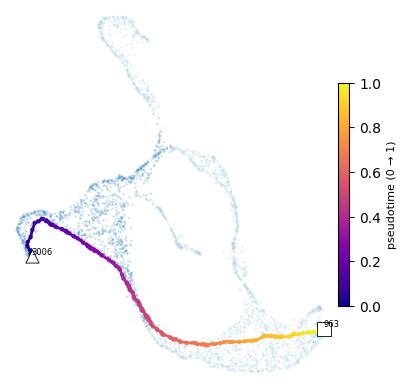

✅ Guardado:
- ./figs/umap_path_with_pseudotime.pdf
- ./figs/umap_path_with_pseudotime.png


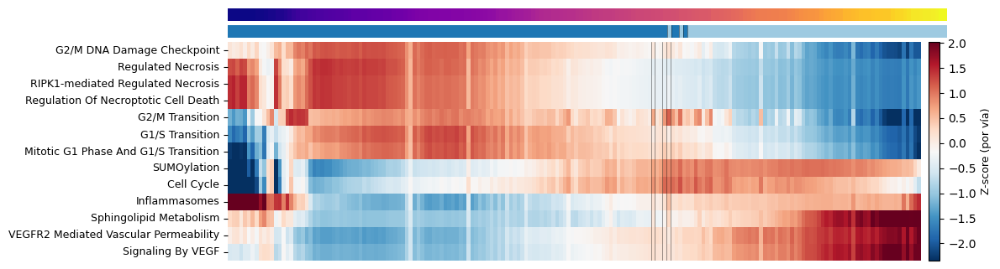

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf
✅ Seleccionadas top25 por |r| con PT. Mejores ejemplos: ['Interferon Signaling R-HSA-913531_SCORE', 'Inhibition Of Replication Initiation Of Damaged DNA By RB1/E2F1 R-HSA-113501_SCORE', 'DDX58/IFIH1-mediated Induction Of Interferon-Alpha/Beta R-HSA-168928_SCORE', 'Formation Of beta-catenin:TCF Transactivating Complex R-HSA-201722_SCORE', 'Resolution Of D-loop Structures Thru Holliday Junction Intermediates R-HSA-5693568_SCORE']
📄 Guardado ranking de correlaciones en ./figs/score_vs_pt_correlations.csv


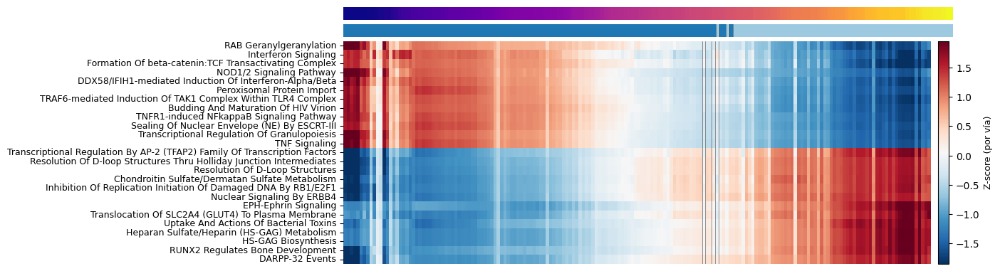

✅ Guardado:
- ./figs/heatmap_pt_cells_TOPLINEAL.png
- ./figs/heatmap_pt_cells_TOPLINEAL.pdf


In [ ]:
# =============================================================================
# SUBSET (meta 1 y 2) + RUTA + EXPANSIÓN + VISUALIZACIÓN (estilo PHATE) + HEATMAP
# sobre el UMAP 2D REECLUSTERIZADO del subset (obsm["2D_UMAP_RECLUSTERING"])
# =============================================================================
import os, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from sklearn.neighbors import NearestNeighbors
from scipy.sparse.csgraph import dijkstra
from scipy import sparse as sps

# --- para el bloque de rescate / UMAP ---
import scanpy as sc
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# --- para visualización plotly ---
import plotly.express as px
import plotly.graph_objects as go

# ----------------------- Parámetros clave (AJUSTABLES) -----------------------
KEEP_META = ["1","2"]                      # metaclústeres a conservar
STORE_UMAP_KEY = "2D_UMAP_RECLUSTERING"   # clave del UMAP 2D del SUBSET 1+2
WEIGHT_KEY     = STORE_UMAP_KEY           # mismo embedding para pesos del grafo
N_NEIGHBORS    = 25                       # k del grafo para Dijkstra
EXPAND_KNN     = 15                       # k vecinos por nodo de ruta (expansión)
EXPAND_RADIUS  = 0.30                     # radio geométrico a la polilínea (expansión)
EXPAND_TO_N    = 180                      # objetivo total ruta + extras
PT_KEY         = "pseudotime_guided"
PATH_FLAG_KEY  = "guided_path_flag"
EXPAND_FLAG_KEY= "guided_expanded_flag"

# Paleta fija opcional (para fondos por clúster)
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}

# ----------------------- Detectar columna de meta/cluster --------------------
def find_meta_col(ad):
    for c in [
        "meta_cluster","metacluster","MetaCluster",
        "meta_cluster_id","metacluster_id","metacluster_label",
        "hierarchical_metacluster","hierarchical_cluster",
    ]:
        if c in ad.obs.columns:
            return c
    raise KeyError("No encontré columna de meta-clúster/clúster en ad.obs.")

assert 'adata' in globals(), "Debes tener un AnnData llamado 'adata'."
meta_col = find_meta_col(adata)

# ---------------------- Subset SOLO 1 y 2 (se conserva obsm) -----------------
mask = adata.obs[meta_col].astype(str).isin(KEEP_META)
ad12 = adata[mask].copy()
print(f"✅ Subset {meta_col} en {KEEP_META}: {ad12.n_obs} células")

# ============================= BLOQUE DE RESCATE =============================
# Asegurar ad12.obsm[STORE_UMAP_KEY] heredándolo del padre si existe
# o recalculándolo desde *_SCORE -> PCA -> vecinos -> UMAP.

MIN_VAR = 1e-12
RANDOM_STATE = 0
MIN_DIST = 0.5
N_NEIGHBORS_UMAP = 1000
STORE_PCA_KEY = "X_pca_scores"

def _build_score_matrix(ad, score_cols=None, min_var=1e-12, standardize=True):
    if score_cols is None:
        score_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
    if not score_cols:
        raise ValueError("No se encontraron columnas *_SCORE en ad.obs.")
    df = ad.obs[score_cols].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)
    var = df.var(axis=0, ddof=0).values
    keep = var > float(min_var)
    if keep.sum() < 3:
        raise ValueError(f"Quedan <3 scores con var>0 (mantienen {keep.sum()}).")
    df = df.loc[:, keep]
    X = df.values
    if standardize:
        X = StandardScaler(with_mean=True, with_std=True).fit_transform(X)
    return X.astype(np.float32, copy=False), list(df.columns)

def ensure_umap_for_subset(ad_parent, ad_sub, store_umap_key=STORE_UMAP_KEY):
    # 1) Si ya está, nada que hacer
    if store_umap_key in ad_sub.obsm:
        print(f"✅ Ya existe ad_sub.obsm['{store_umap_key}']")
        return ad_sub

    # 2) Intentar heredar del AnnData padre (alineando por obs_names)
    if store_umap_key in ad_parent.obsm:
        U_parent = pd.DataFrame(ad_parent.obsm[store_umap_key], index=ad_parent.obs_names)
        try:
            U_sub = U_parent.loc[ad_sub.obs_names].values
            ad_sub.obsm[store_umap_key] = U_sub.astype(np.float32)
            print(f"✅ Heredado '{store_umap_key}' desde el AnnData padre (mismo embedding).")
            return ad_sub
        except KeyError:
            pass  # faltan celdas -> recalculamos

    # 3) Recalcular desde *_SCORE → PCA → vecinos → UMAP
    print(f"ℹ️  Recalculando '{store_umap_key}' desde *_SCORE en el subset…")
    X_scores, used_scores = _build_score_matrix(ad_sub, score_cols=None, min_var=MIN_VAR, standardize=True)
    n_comps = int(min(15, X_scores.shape[1], max(2, ad_sub.n_obs - 1)))
    pca = PCA(n_components=n_comps, svd_solver='randomized', random_state=RANDOM_STATE)
    Xp = pca.fit_transform(X_scores)
    ad_sub.obsm[STORE_PCA_KEY] = np.asarray(Xp, dtype=np.float32)
    k = int(max(2, min(N_NEIGHBORS_UMAP, ad_sub.n_obs - 1)))
    sc.pp.neighbors(ad_sub, use_rep=STORE_PCA_KEY, n_neighbors=k, metric="cosine")
    sc.tl.umap(ad_sub, n_components=2, random_state=RANDOM_STATE, min_dist=MIN_DIST, spread=1.0)
    ad_sub.obsm[store_umap_key] = ad_sub.obsm["X_umap"].copy()
    print(f"✅ UMAP 2D guardado en ad_sub.obsm['{store_umap_key}'] (k={k})")
    return ad_sub

# Ejecutar rescate
ad12 = ensure_umap_for_subset(adata, ad12, store_umap_key=STORE_UMAP_KEY)
# =========================== FIN BLOQUE DE RESCATE ===========================

# =============================================================================
# Utilidades geométricas y de grafo (fundamento estilo PHATE)
# =============================================================================
def _arc_length(P: np.ndarray) -> np.ndarray:
    P = np.asarray(P)
    if P.shape[0] < 2: return np.array([0.0], float)
    seg = np.linalg.norm(P[1:] - P[:-1], axis=1)
    return np.concatenate([[0.0], np.cumsum(seg)])

def _project_points_onto_polyline(P: np.ndarray, cum: np.ndarray, Q: np.ndarray, return_dist=False):
    P = np.asarray(P); Q = np.asarray(Q); cum = np.asarray(cum)
    n_seg = P.shape[0] - 1
    if n_seg <= 0:
        if return_dist: return np.zeros(Q.shape[0], float), np.linalg.norm(Q - P[0], axis=1)
        return np.zeros(Q.shape[0], float)
    total = float(cum[-1]) if cum[-1] > 0 else 1.0
    t_out = np.zeros(Q.shape[0], float); d_out = np.full(Q.shape[0], np.inf, float)
    for qi, q in enumerate(Q):
        best_d2, best_t = np.inf, 0.0
        for i in range(n_seg):
            a = P[i]; b = P[i+1]; v = b - a; L2 = float(np.dot(v, v))
            if L2 == 0.0:
                u = 0.0; d2 = float(np.dot(q - a, q - a))
            else:
                u = float(np.dot(q - a, v) / L2); u = 0.0 if u < 0.0 else (1.0 if u > 1.0 else u)
                proj = a + u * v; d2 = float(np.dot(q - proj, q - proj))
            if d2 < best_d2:
                best_d2 = d2; best_t = (cum[i] + u * np.sqrt(L2)) / total
        t_out[qi] = best_t; d_out[qi] = np.sqrt(best_d2)
    return (t_out, d_out) if return_dist else t_out

def _build_knn_graph_safe(ad, rep_key=STORE_UMAP_KEY, n_neighbors=N_NEIGHBORS, weight_embed_key=WEIGHT_KEY):
    assert rep_key in ad.obsm and weight_embed_key in ad.obsm
    X = np.asarray(ad.obsm[rep_key]); W = np.asarray(ad.obsm[weight_embed_key])
    k = int(min(max(2, n_neighbors), X.shape[0]-1))
    nbrs = NearestNeighbors(n_neighbors=k+1, metric="euclidean").fit(X)
    _, inds = nbrs.kneighbors(X, return_distance=True)
    rows, cols, data = [], [], []
    n = ad.n_obs
    for i in range(n):
        js = inds[i, 1:]
        wi = W[i]
        for j in js:
            w = float(np.linalg.norm(wi - W[j])); w = 1.0 if not np.isfinite(w) else w
            rows.append(i); cols.append(j); data.append(w)
    G = sps.csr_matrix((data, (rows, cols)), shape=(n, n))
    return sps.csr_matrix.minimum(G, G.T)

def _shortest_path_indices_safe(G, src, dst):
    dist, pred = dijkstra(G, directed=False, indices=src, return_predecessors=True)
    if not np.isfinite(dist[dst]): return None
    path = [dst]; cur = dst
    while cur != src:
        cur = pred[cur]
        if cur == -9999: return None
        path.append(cur)
    return path[::-1]

# ---------------- Ruta guiada + expansión combinada + pseudotiempo -----------
def guided_pseudotime_by_ids_safe(
    ad, ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_to_n=EXPAND_TO_N, expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS
):
    ad = ad.copy()
    name_to_idx = {str(n): i for i,n in enumerate(ad.obs_names.astype(str))}
    miss = [cid for cid in ids_path if str(cid) not in name_to_idx]
    if miss: raise KeyError(f"IDs no encontrados en el subset 1+2: {miss}")

    G = _build_knn_graph_safe(ad, rep_key=rep_key, n_neighbors=n_neighbors, weight_embed_key=weight_embed_key)
    anchors = [name_to_idx[str(a)] for a in ids_path]

    route = []
    for ia, ib in zip(anchors[:-1], anchors[1:]):
        seg = _shortest_path_indices_safe(G, ia, ib)
        if not seg:
            raise ValueError(f"No hay camino entre '{ad.obs_names[ia]}' y '{ad.obs_names[ib]}'. Sube n_neighbors (p.ej., 30).")
        route.extend(seg[1:] if (route and seg[0]==route[-1]) else seg)
    route = np.array(route, int)

    W = np.asarray(ad.obsm[weight_embed_key])
    W_route = W[route]
    cum = _arc_length(W_route)
    pt_route = (cum / cum[-1]) if cum[-1] > 0 else np.linspace(0, 1, route.size)

    PT = np.full(ad.n_obs, np.nan, float); PT[route] = pt_route
    path_flag = np.zeros(ad.n_obs, bool); path_flag[route] = True
    expanded_flag = path_flag.copy()

    # Candidatos por kNN y/o radio
    cand = np.array([], int)
    if (expand_knn is not None) and (expand_knn > 0):
        kexp = int(min(expand_knn, ad.n_obs-1))
        nbrs = NearestNeighbors(n_neighbors=kexp+1, metric="euclidean").fit(W)
        _, inds = nbrs.kneighbors(W_route)
        knn_idx = np.unique(inds[:, 1:].ravel())
        knn_idx = knn_idx[~np.isin(knn_idx, route)]
        cand = knn_idx if cand.size == 0 else np.unique(np.concatenate([cand, knn_idx]))

    if (expand_radius is not None) and (expand_radius > 0):
        _, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)
        rad_idx = np.where(d_all <= float(expand_radius))[0]
        rad_idx = rad_idx[~np.isin(rad_idx, route)]
        cand = rad_idx if cand.size == 0 else np.unique(np.concatenate([cand, rad_idx]))

    # Ajustar a N total
    extras = cand
    if (extras.size > 0) or (expand_to_n is not None):
        t_all, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)

    if expand_to_n is not None:
        need_total = max(int(expand_to_n) - route.size, 0)
        if extras.size > need_total > 0:
            order = np.argsort(d_all[extras]); extras = extras[order][:need_total]
        elif extras.size < need_total:
            mask = np.ones(ad.n_obs, bool); mask[route] = False
            if extras.size > 0: mask[extras] = False
            pool = np.where(mask)[0]
            if pool.size > 0:
                order = np.argsort(d_all[pool])
                fill = pool[order][: (need_total - extras.size)]
                extras = fill if extras.size == 0 else np.unique(np.concatenate([extras, fill]))

    if extras.size > 0:
        t_extra = _project_points_onto_polyline(W_route, cum, W[extras])
        PT[extras] = t_extra
        expanded = np.unique(np.concatenate([route, extras])).astype(int)
        expanded_flag[:] = False; expanded_flag[expanded] = True

    ad.obs[out_key] = PT
    ad.obs[path_flag_key] = path_flag
    ad.obs[expanded_flag_key] = expanded_flag
    return ad, route

# ----------------------------- Visualización (UMAP 2D) -----------------------
def plot_umap_path_with_pseudotime(
    ad, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    bg_mode="cluster", s_bg=3.0, alpha_bg=0.22,
    s_expanded=7, s_route=10, lw=2.0, cmap="plasma",
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=None, label_fontsize=6, rasterize_axes=True
):
    assert coords_key in ad.obsm, f"Falta ad.obsm['{coords_key}']"
    XY = np.asarray(ad.obsm[coords_key]); assert XY.shape[1] == 2
    route_idx = np.asarray(route_idx, int); xy_path = XY[route_idx]
    if pt_key not in ad.obs.columns: raise KeyError(f"Falta ad.obs['{pt_key}']")
    PT = np.asarray(ad.obs[pt_key].values, float)

    os.makedirs(os.path.dirname(out_pdf) or ".", exist_ok=True)
    fig, ax = plt.subplots(figsize=(4.8, 4.8))   # sin constrained_layout; ajustamos con bbox_inches="tight"
    if rasterize_axes: ax.set_rasterization_zorder(1)

    # Fondo
    if (bg_mode == "cluster") and (cluster_col in ad.obs.columns):
        cl = ad.obs[cluster_col].astype(str).values
        pal = palette or {}
        uniq = np.unique(cl)
        if not pal:
            tab = plt.cm.get_cmap("tab20", len(uniq))
            pal = {u: tab(i) for i, u in enumerate(uniq)}
        ax.scatter(XY[:,0], XY[:,1], s=s_bg,
                   c=[pal.get(c, "#bdbdbd") for c in cl],
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)
    else:
        ax.scatter(XY[:,0], XY[:,1], s=s_bg, c="#9e9e9e",
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)

    # Expandidas (sin repetir ruta)
    if expanded_flag_key in ad.obs.columns:
        expanded_mask = ad.obs[expanded_flag_key].values.astype(bool)
        if path_flag_key in ad.obs.columns:
            expanded_mask &= ~ad.obs[path_flag_key].values.astype(bool)
        valid = expanded_mask & np.isfinite(PT)
        if valid.any():
            sc_bg = ax.scatter(XY[valid,0], XY[valid,1],
                               c=PT[valid], cmap=cmap, s=s_expanded,
                               linewidths=0, zorder=1.5, rasterized=True)

    # Polilínea coloreada por PT
    if route_idx.size >= 2:
        segs = np.stack([xy_path[:-1], xy_path[1:]], axis=1)
        pt_path = PT[route_idx]
        if not np.isfinite(pt_path).all():
            n = pt_path.size; x = np.arange(n); good = np.isfinite(pt_path)
            pt_path = np.interp(x, x[good], pt_path[good])
        lc = LineCollection(segs, cmap=cmap, linewidths=lw, zorder=3)
        lc.set_array(pt_path[:-1]); ax.add_collection(lc)

    sc_route = ax.scatter(xy_path[:,0], xy_path[:,1],
                          c=PT[route_idx], cmap=cmap,
                          s=s_route, linewidths=0, zorder=3.2)

    # Inicio/fin
    ax.scatter(*xy_path[0],  marker="^", s=s_route*9, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)
    ax.scatter(*xy_path[-1], marker="s", s=s_route*10, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)

    # IDs ancla
    if show_ids:
        name_to_idx = {str(n): i for i,n in enumerate(ad.obs_names.astype(str))}
        for oid in show_ids:
            k = name_to_idx.get(str(oid))
            if k is None: continue
            if np.any(route_idx == k):
                x, y = XY[k]
                ax.text(x, y, str(oid), fontsize=label_fontsize,
                        ha="left", va="bottom", zorder=5)

    # Límites
    if extent == "all":
        x_min, x_max = XY[:,0].min(), XY[:,0].max()
        y_min, y_max = XY[:,1].min(), XY[:,1].max()
        dx, dy = (x_max - x_min), (y_max - y_min)
    else:
        x_min, x_max = xy_path[:,0].min(), xy_path[:,0].max()
        y_min, y_max = xy_path[:,1].min(), xy_path[:,1].max()
        dx, dy = np.ptp(xy_path[:,0]), np.ptp(xy_path[:,1])
    pad = float(pad)
    ax.set_xlim(x_min - pad*max(dx,1e-9), x_max + pad*max(dx,1e-9))
    ax.set_ylim(y_min - pad*max(dy,1e-9), y_max + pad*max(dy,1e-9))
    ax.set_aspect("equal","box"); ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values(): sp.set_visible(False)

    cbar = fig.colorbar(sc_route, ax=ax, fraction=0.03, pad=0.015)
    cbar.set_label("pseudotime (0 → 1)", fontsize=8)

    os.makedirs("./figs", exist_ok=True)
    # ✅ usa bbox_inches="tight"
    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_png, dpi=500, bbox_inches="tight", pad_inches=0.02)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_pdf}\n- {out_png}")

# ------------------- UMAP Plotly (para ver índices/IDs por punto) ------------
def plotly_umap_with_ids(ad, coords_key=STORE_UMAP_KEY, color_by=meta_col, pt_key=PT_KEY):
    assert coords_key in ad.obsm, f"Falta ad.obsm['{coords_key}']"
    XY = np.asarray(ad.obsm[coords_key]); assert XY.shape[1] == 2
    dfp = pd.DataFrame({
        "UMAP1": XY[:,0],
        "UMAP2": XY[:,1],
        "cell_id": ad.obs_names.astype(str).values
    })
    if color_by in ad.obs.columns:
        dfp[color_by] = ad.obs[color_by].astype(str).values
    if pt_key in ad.obs.columns:
        dfp[pt_key] = ad.obs[pt_key].values

    # Texto con índice para cada punto
    dfp["idx"] = np.arange(dfp.shape[0])
    hover = ["cell_id"]
    if color_by in dfp: hover.append(color_by)
    if pt_key in dfp:   hover.append(pt_key)

    fig = px.scatter(
        dfp, x="UMAP1", y="UMAP2",
        color=(color_by if color_by in dfp else None),
        hover_name="cell_id",
        hover_data=hover,
        text="idx",  # muestra el índice numérico
        title=f"UMAP 2D ({coords_key}) — índice/ID por punto"
    )
    fig.update_traces(textposition='top center', marker=dict(size=5, line=dict(width=0)))
    fig.update_layout(
        template="simple_white", xaxis_title="", yaxis_title="",
        legend_title_text=color_by if color_by in dfp else "",
        dragmode="pan", height=650, width=820, margin=dict(l=10,r=10,t=40,b=10)
    )
    fig.update_xaxes(showgrid=False, zeroline=False)
    fig.update_yaxes(showgrid=False, zeroline=False, scaleanchor="x", scaleratio=1)
    fig.show()

# ------------------------------ Heatmap alineado ------------------------------
def _short_lbl(s: str) -> str:
    s = re.sub(r"\s*SCORE\s*$", "", s, flags=re.I)
    s = re.sub(r"\s*R-HSA-\d+(\.\d+)?\s*", "", s, flags=re.I)
    return s.replace("_"," ").strip()

def heatmap_for_cells_with_pt(
    ad, selected_scores, pt_key=PT_KEY,
    use_flag_key=EXPAND_FLAG_KEY,       # o PATH_FLAG_KEY para solo ruta
    cluster_col=meta_col, palette=CL_COL,
    zscore_per_row=True, cmap="RdBu_r",
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,
    # ---- NUEVO: orden de filas por clustering jerárquico ----
    row_cluster=False, row_cluster_metric="correlation", row_cluster_method="average",
    width=None, height=None, per_col=0.012, per_row=0.35,
    min_w=7.0, max_w=18.5, min_h=4.8,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
):
    from scipy.spatial.distance import pdist
    from scipy.cluster.hierarchy import linkage, leaves_list
    from matplotlib.colors import to_rgba

    assert pt_key in ad.obs.columns, f"Falta ad.obs['{pt_key}']"
    mask = ad.obs[pt_key].notna()
    if use_flag_key in ad.obs.columns: mask &= ad.obs[use_flag_key].astype(bool)
    cells = ad.obs_names[mask]
    if cells.size == 0: raise ValueError("No hay células con pseudotiempo para mostrar.")

    # Orden por pseudotiempo (columnas)
    pt = ad.obs.loc[cells, pt_key].astype(float).values
    order = np.argsort(pt); cells = cells[order]; pt = pt[order]

    # Selección de vías (si lista vacía o ninguna existe, auto *_SCORE)
    cols_exist = [c for c in (selected_scores or []) if c in ad.obs.columns]
    if not cols_exist:
        auto_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
        if len(auto_cols) == 0:
            raise ValueError("No hay columnas *_SCORE en ad.obs para el heatmap.")
        cols_exist = auto_cols

    df = ad.obs.loc[cells, cols_exist].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)
    M = df.T  # (vías × celdas)

    # Z-score por fila
    if zscore_per_row:
        mu = M.mean(axis=1).values[:, None]
        sd = M.std(axis=1).replace(0, np.nan).values[:, None]
        Z = (M.values - mu) / sd
        Z = np.nan_to_num(Z, nan=0.0)
        data = Z; cbar_label = "Z-score (por vía)"
    else:
        data = M.values; cbar_label = "Score"

    row_labels = [_short_lbl(c) for c in M.index]

    # ----- NUEVO: ordenar filas por clustering jerárquico (sin dendrograma) -----
    if row_cluster and data.shape[0] >= 3:
        try:
            D = pdist(data, metric=row_cluster_metric)
            if row_cluster_method == "ward" and row_cluster_metric != "euclidean":
                from scipy.spatial.distance import pdist as _pdist
                D = _pdist(data, metric="euclidean")
            Zlink = linkage(D, method=row_cluster_method)
            leaves = leaves_list(Zlink)
            data = data[leaves, :]
            row_labels = [row_labels[i] for i in leaves]
        except Exception as e:
            print(f"⚠️ No se pudo ordenar filas por clustering ({type(e).__name__}: {e}). Se mantiene el orden original.")

    n_rows, n_cols = data.shape

    # Tira de metaclúster
    strip_rgba, bounds = None, np.array([], int)
    if (cluster_col is not None) and (cluster_col in ad.obs.columns):
        cl_ord = ad.obs.loc[cells, cluster_col].astype(str).values
        pal = palette or {}
        if not pal:
            uniq = np.unique(cl_ord); tab = plt.cm.get_cmap("tab20", len(uniq))
            pal = {u: tab(i) for i, u in enumerate(uniq)}
        strip_rgba = np.array([to_rgba(pal.get(x, "#bdbdbd")) for x in cl_ord], float)[None, :, :]
        bounds = np.where(cl_ord[1:] != cl_ord[:-1])[0] + 1

    # tamaños
    have_pttrk = bool(show_pt_track); have_strip = strip_rgba is not None
    ratios = []
    if have_pttrk: ratios.append(0.55)
    if have_strip: ratios.append(0.55)
    ratios.append(9.4)

    if width is None:  fig_w = max(min_w, min(max_w, 6.5 + per_col*n_cols))
    else:              fig_w = float(width)
    extra_h = (0.25 if have_pttrk else 0) + (0.25 if have_strip else 0)
    if height is None: fig_h = max(min_h, 2.2 + per_row*n_rows + extra_h)
    else:              fig_h = float(height)

    os.makedirs(os.path.dirname(out_png) or ".", exist_ok=True)
    fig, axes = plt.subplots(len(ratios), 1, sharex=True,
                             gridspec_kw={"height_ratios": ratios},
                             figsize=(fig_w, fig_h))  # sin constrained_layout
    if not isinstance(axes, (list, np.ndarray)): axes = [axes]
    ax_idx = 0

    max_lbl = max(len(x) for x in row_labels) if row_labels else 12
    left_margin = min(0.45, 0.14 + 0.009*max_lbl)
    fig.subplots_adjust(left=left_margin, right=0.985, top=0.92, bottom=0.06, hspace=0.05)

    # (1) PT track
    if have_pttrk:
        ax_pt = axes[ax_idx]; ax_idx += 1
        ax_pt.imshow(pt[None, :], aspect="auto", cmap=pt_cmap,
                     interpolation="nearest", origin="upper",
                     extent=(-0.5, n_cols-0.5, 0.5, -0.5), rasterized=True)
        ax_pt.set_yticks([]); ax_pt.set_xticks([])
        for sp in ax_pt.spines.values(): sp.set_visible(False)
        if show_pt_ticks:
            ax_pt_top = ax_pt.secondary_xaxis("top")
            ax_pt_top.set_xticks([0.0, 0.5, 1.0], labels=["0.0","0.5","1.0"])
            ax_pt_top.set_xlabel("Pseudotime", fontsize=9)
            ax_pt_top.tick_params(labelsize=8)

    # (2) strip cluster
    if have_strip:
        ax_strip_ax = axes[ax_idx]; ax_idx += 1
        ax_strip_ax.imshow(strip_rgba, aspect="auto", interpolation="nearest",
                           origin="upper", rasterized=True,
                           extent=(-0.5, n_cols-0.5, 0.5, -0.5))
        ax_strip_ax.set_yticks([]); ax_strip_ax.set_xticks([])
        for b in bounds: ax_strip_ax.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
        for sp in ax_strip_ax.spines.values(): sp.set_visible(False)

    # (3) Heatmap
    ax_hm = axes[ax_idx]
    vmin, vmax = np.percentile(data, 1), np.percentile(data, 99)
    im = ax_hm.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax,
                      interpolation="nearest", aspect="auto",
                      origin="upper", rasterized=True,
                      extent=(-0.5, n_cols-0.5, n_rows-0.5, -0.5))
    ax_hm.set_yticks(np.arange(n_rows))
    ax_hm.set_yticklabels(row_labels, fontsize=9, va="center")
    ax_hm.set_ylim(n_rows-0.5, -0.5); ax_hm.set_xticks([])
    for b in bounds: ax_hm.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
    for sp in ax_hm.spines.values(): sp.set_visible(False)

    cbar = fig.colorbar(im, ax=ax_hm, fraction=0.025, pad=0.012)
    cbar.set_label(cbar_label, fontsize=9)

    # ✅ usa bbox_inches="tight"
    fig.savefig(out_png, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_png}\n- {out_pdf}")

# ---------------- Selección de vías por alineación lineal con pseudotiempo ----
def select_scores_by_linear_alignment(ad, score_cols=None, pt_key=PT_KEY, min_var=1e-12, top_k=20):
    """
    Devuelve la lista de 'top_k' columnas *_SCORE cuyo perfil (en celdas con PT) se alinea
    linealmente con el pseudotiempo (|r| grande). Usa Pearson sobre scores normalizados por columna.
    """
    if pt_key not in ad.obs.columns:
        raise KeyError(f"Falta ad.obs['{pt_key}']")
    mask = ad.obs[pt_key].notna()
    if mask.sum() < 5:
        raise ValueError("Muy pocas celdas con pseudotiempo.")
    pt = ad.obs.loc[mask, pt_key].astype(float).values

    if score_cols is None:
        score_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
    if not score_cols:
        raise ValueError("No se encontraron columnas *_SCORE.")
    df = ad.obs.loc[mask, score_cols].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)

    # filtrar varianza
    var = df.var(axis=0, ddof=0)
    keep = var > float(min_var)
    df = df.loc[:, keep]
    if df.shape[1] == 0:
        raise ValueError("No quedan scores con varianza > 0.")

    # z-score por columna (para comparabilidad)
    Z = (df - df.mean(0)) / df.std(0).replace(0, np.nan)
    Z = Z.fillna(0.0)

    # correlación Pearson con PT
    r = Z.apply(lambda s: np.corrcoef(s.values, pt)[0,1], axis=0)
    r = r.replace([np.inf, -np.inf], np.nan).fillna(0.0)
    # ordenar por |r|
    sel = r.abs().sort_values(ascending=False)
    top = list(sel.index[:int(min(top_k, sel.size))])
    print(f"✅ Seleccionadas top{len(top)} por |r| con PT. Mejores ejemplos:", list(sel.index[:min(5, sel.size)]))
    return top, r

# =============================================================================
# VÍAS (puedes cambiar esta lista; si queda vacía o ninguna existe, auto *_SCORE)
# =============================================================================
SELECTED_SCORES = [
 'SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE',
 'RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE','Regulated Necrosis R-HSA-5218859_SCORE',
 'Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE',
 'G1/S Transition R-HSA-69206_SCORE','Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE',
 'VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE',
 'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE',
 'Sphingolipid Metabolism R-HSA-428157_SCORE'
]

# =============================================================================
# EJECUCIÓN (ajusta ids_path si quieres). Deben existir en ad12.obs_names.
# =============================================================================
ids_path = ["3006","963"]  # <-- anclas dentro del SUBSET 1+2 (verifica que existan)

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Visualización (estilo PHATE pero sobre UMAP 2D del subset)
plot_umap_path_with_pseudotime(
    ad2, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=ids_path
)

# UMAP interactivo (Plotly) mostrando índices/IDs
plotly_umap_with_ids(ad2, coords_key=STORE_UMAP_KEY, color_by=meta_col, pt_key=PT_KEY)

# Heatmap alineado por pseudotiempo (lista manual o auto si vacía)
heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    row_cluster=True,  # ← si quieres agrupar filas: True
    width=16, height=3.5,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)

# --------- Heatmap EXTRA: top vías mejor alineadas linealmente con PT ---------
top_cols, r_series = select_scores_by_linear_alignment(
    ad2, score_cols=None, pt_key=PT_KEY, min_var=1e-12, top_k=25
)
# Puedes guardar la tabla de correlaciones si quieres:
corr_tab = r_series.sort_values(key=lambda s: s.abs(), ascending=False)
os.makedirs("./figs", exist_ok=True)
corr_tab.to_csv("./figs/score_vs_pt_correlations.csv")
print("📄 Guardado ranking de correlaciones en ./figs/score_vs_pt_correlations.csv")

# Heatmap con esas top vías (orden de filas por clustering jerárquico activado)
heatmap_for_cells_with_pt(
    ad2, top_cols,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    row_cluster=True, row_cluster_metric="correlation", row_cluster_method="average",
    width=16, height=4.2,
    out_png="./figs/heatmap_pt_cells_TOPLINEAL.png",
    out_pdf="./figs/heatmap_pt_cells_TOPLINEAL.pdf"
)


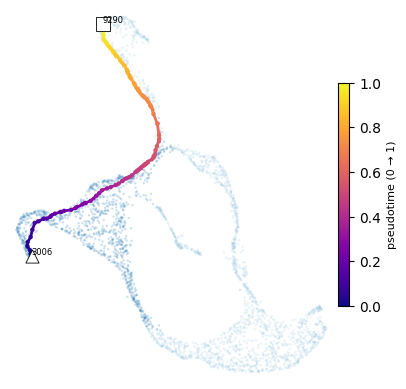

✅ Guardado:
- ./figs/umap_path_with_pseudotime.pdf
- ./figs/umap_path_with_pseudotime.png


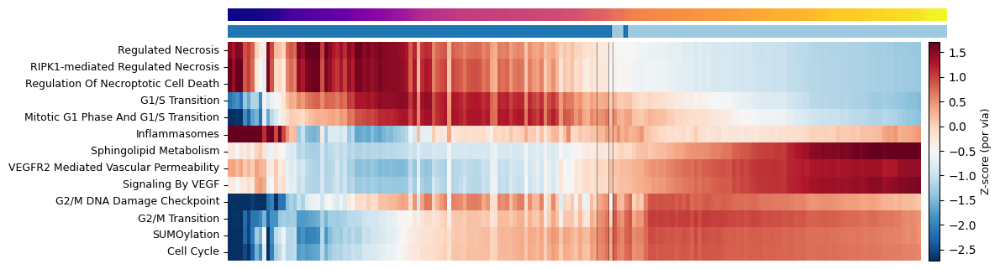

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf
✅ Seleccionadas top40 por |r| con PT. Mejores ejemplos: ['GPER1 Signaling R-HSA-9634597_SCORE', 'Class B/2 (Secretin Family Receptors) R-HSA-373080_SCORE', 'Peptide Hormone Metabolism R-HSA-2980736_SCORE', 'Effects Of PIP2 Hydrolysis R-HSA-114508_SCORE', 'Class I MHC Mediated Antigen Processing And Presentation R-HSA-983169_SCORE']
📄 Guardado ranking de correlaciones en ./figs/score_vs_pt_correlations.csv


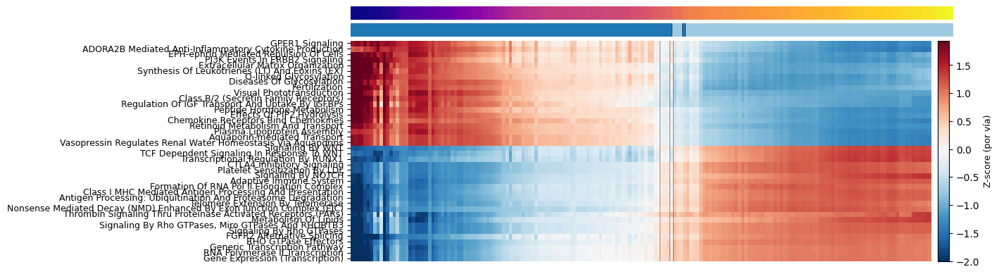

✅ Guardado:
- ./figs/heatmap_pt_cells_TOPLINEAL.png
- ./figs/heatmap_pt_cells_TOPLINEAL.pdf


In [ ]:
# =============================================================================
# EJECUCIÓN (ajusta ids_path si quieres). Deben existir en ad12.obs_names.
# =============================================================================
ids_path = ["3006","9290"]  # <-- anclas dentro del SUBSET 1+2 (verifica que existan)

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Visualización (estilo PHATE pero sobre UMAP 2D del subset)
plot_umap_path_with_pseudotime(
    ad2, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=ids_path
)



# Heatmap alineado por pseudotiempo (lista manual o auto si vacía)
heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    row_cluster=True,  # ← si quieres agrupar filas: True
    width=16, height=3.5,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)


# --------- Heatmap EXTRA: top vías mejor alineadas linealmente con PT ---------
top_cols, r_series = select_scores_by_linear_alignment(
    ad2, score_cols=None, pt_key=PT_KEY, min_var=1e-12, top_k=40
)
# Puedes guardar la tabla de correlaciones si quieres:
corr_tab = r_series.sort_values(key=lambda s: s.abs(), ascending=False)
os.makedirs("./figs", exist_ok=True)
corr_tab.to_csv("./figs/score_vs_pt_correlations.csv")
print("📄 Guardado ranking de correlaciones en ./figs/score_vs_pt_correlations.csv")

# Heatmap con esas top vías (orden de filas por clustering jerárquico activado)
heatmap_for_cells_with_pt(
    ad2, top_cols,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    row_cluster=True, row_cluster_metric="correlation", row_cluster_method="average",
    width=16, height=4.2,
    out_png="./figs/heatmap_pt_cells_TOPLINEAL.png",
    out_pdf="./figs/heatmap_pt_cells_TOPLINEAL.pdf"
)


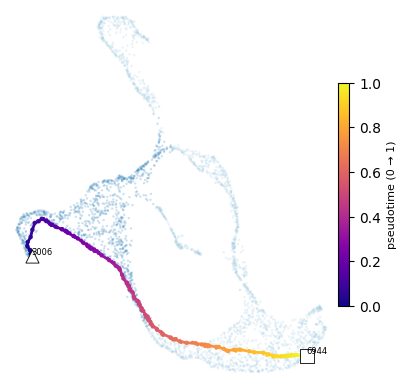

✅ Guardado:
- ./figs/umap_path_with_pseudotime.pdf
- ./figs/umap_path_with_pseudotime.png


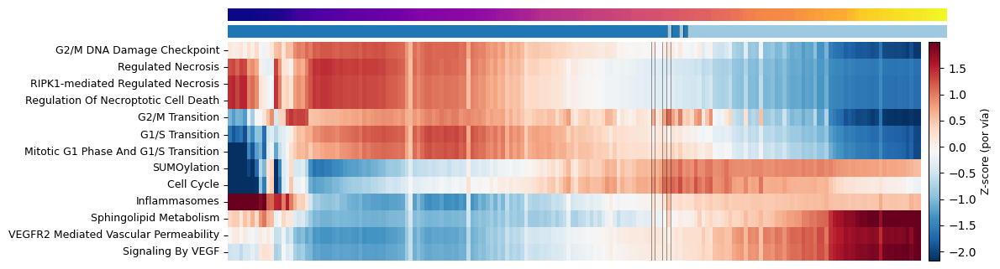

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf
✅ Seleccionadas top40 por |r| con PT. Mejores ejemplos: ['Inhibition Of Replication Initiation Of Damaged DNA By RB1/E2F1 R-HSA-113501_SCORE', 'Resolution Of D-loop Structures Thru Holliday Junction Intermediates R-HSA-5693568_SCORE', 'DDX58/IFIH1-mediated Induction Of Interferon-Alpha/Beta R-HSA-168928_SCORE', 'Nuclear Signaling By ERBB4 R-HSA-1251985_SCORE', 'Interferon Signaling R-HSA-913531_SCORE']
📄 Guardado ranking de correlaciones en ./figs/score_vs_pt_correlations.csv


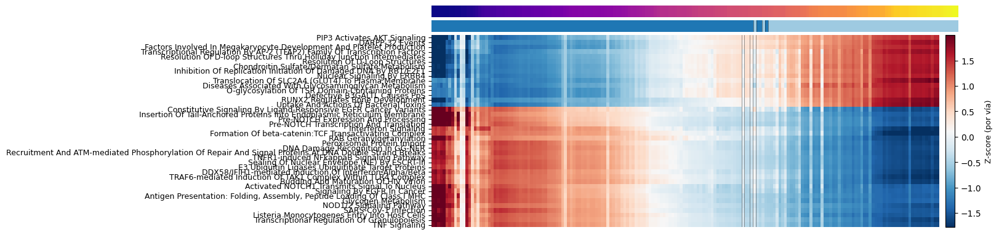

✅ Guardado:
- ./figs/heatmap_pt_cells_TOPLINEAL.png
- ./figs/heatmap_pt_cells_TOPLINEAL.pdf


In [ ]:
# =============================================================================
# EJECUCIÓN (ajusta ids_path si quieres). Deben existir en ad12.obs_names.
# =============================================================================
ids_path = ["3006","6944"]  # <-- anclas dentro del SUBSET 1+2 (verifica que existan)

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Visualización (estilo PHATE pero sobre UMAP 2D del subset)
plot_umap_path_with_pseudotime(
    ad2, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=ids_path
)



# Heatmap alineado por pseudotiempo (lista manual o auto si vacía)
heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    row_cluster=True,  # ← si quieres agrupar filas: True
    width=16, height=3.5,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)


# --------- Heatmap EXTRA: top vías mejor alineadas linealmente con PT ---------
top_cols, r_series = select_scores_by_linear_alignment(
    ad2, score_cols=None, pt_key=PT_KEY, min_var=1e-12, top_k=40
)
# Puedes guardar la tabla de correlaciones si quieres:
corr_tab = r_series.sort_values(key=lambda s: s.abs(), ascending=False)
os.makedirs("./figs", exist_ok=True)
corr_tab.to_csv("./figs/score_vs_pt_correlations.csv")
print("📄 Guardado ranking de correlaciones en ./figs/score_vs_pt_correlations.csv")

# Heatmap con esas top vías (orden de filas por clustering jerárquico activado)
heatmap_for_cells_with_pt(
    ad2, top_cols,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    row_cluster=True, row_cluster_metric="correlation", row_cluster_method="average",
    width=16, height=4.2,
    out_png="./figs/heatmap_pt_cells_TOPLINEAL.png",
    out_pdf="./figs/heatmap_pt_cells_TOPLINEAL.pdf"
)


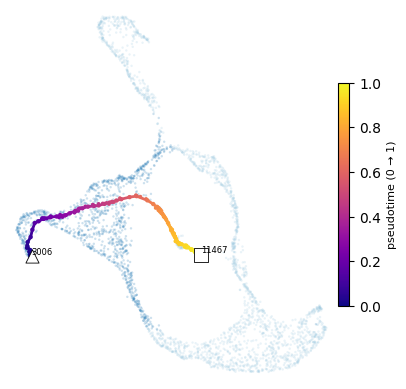

✅ Guardado:
- ./figs/umap_path_with_pseudotime.pdf
- ./figs/umap_path_with_pseudotime.png


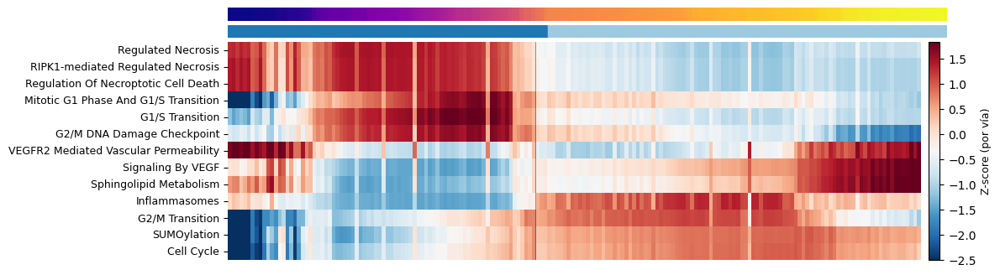

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf
✅ Seleccionadas top40 por |r| con PT. Mejores ejemplos: ['Arachidonic Acid Metabolism R-HSA-2142753_SCORE', 'NOD1/2 Signaling Pathway R-HSA-168638_SCORE', 'Synthesis Of Bile Acids And Bile Salts Via 7Alpha-Hydroxycholesterol R-HSA-193368_SCORE', 'Synthesis Of Bile Acids And Bile Salts Via 24-Hydroxycholesterol R-HSA-193775_SCORE', 'RAB Geranylgeranylation R-HSA-8873719_SCORE']
📄 Guardado ranking de correlaciones en ./figs/score_vs_pt_correlations.csv


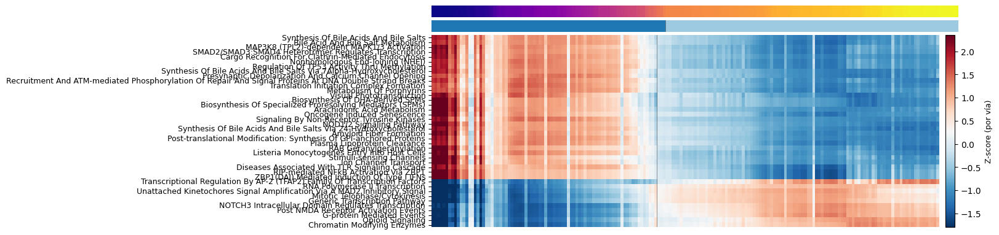

✅ Guardado:
- ./figs/heatmap_pt_cells_TOPLINEAL.png
- ./figs/heatmap_pt_cells_TOPLINEAL.pdf


In [ ]:
# =============================================================================
# EJECUCIÓN (ajusta ids_path si quieres). Deben existir en ad12.obs_names.
# =============================================================================
ids_path = ["3006","11467"]  # <-- anclas dentro del SUBSET 1+2 (verifica que existan)

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Visualización (estilo PHATE pero sobre UMAP 2D del subset)
plot_umap_path_with_pseudotime(
    ad2, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=ids_path
)



# Heatmap alineado por pseudotiempo (lista manual o auto si vacía)
heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    row_cluster=True,  # ← si quieres agrupar filas: True
    width=16, height=3.5,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)


# --------- Heatmap EXTRA: top vías mejor alineadas linealmente con PT ---------
top_cols, r_series = select_scores_by_linear_alignment(
    ad2, score_cols=None, pt_key=PT_KEY, min_var=1e-12, top_k=40
)
# Puedes guardar la tabla de correlaciones si quieres:
corr_tab = r_series.sort_values(key=lambda s: s.abs(), ascending=False)
os.makedirs("./figs", exist_ok=True)
corr_tab.to_csv("./figs/score_vs_pt_correlations.csv")
print("📄 Guardado ranking de correlaciones en ./figs/score_vs_pt_correlations.csv")

# Heatmap con esas top vías (orden de filas por clustering jerárquico activado)
heatmap_for_cells_with_pt(
    ad2, top_cols,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    row_cluster=True, row_cluster_metric="correlation", row_cluster_method="average",
    width=16, height=4.2,
    out_png="./figs/heatmap_pt_cells_TOPLINEAL.png",
    out_pdf="./figs/heatmap_pt_cells_TOPLINEAL.pdf"
)


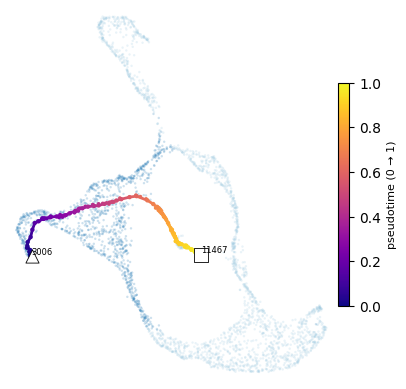

✅ Guardado:
- ./figs/umap_path_with_pseudotime.pdf
- ./figs/umap_path_with_pseudotime.png


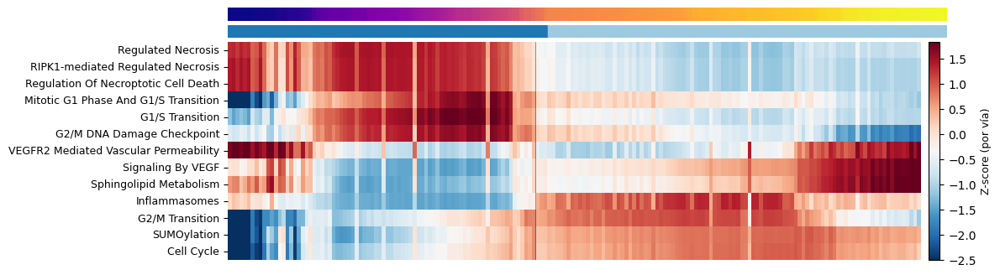

✅ Guardado:
- ./figs/heatmap_pt_cells.png
- ./figs/heatmap_pt_cells.pdf
✅ Seleccionadas top40 por |r| con PT. Mejores ejemplos: ['Arachidonic Acid Metabolism R-HSA-2142753_SCORE', 'NOD1/2 Signaling Pathway R-HSA-168638_SCORE', 'Synthesis Of Bile Acids And Bile Salts Via 7Alpha-Hydroxycholesterol R-HSA-193368_SCORE', 'Synthesis Of Bile Acids And Bile Salts Via 24-Hydroxycholesterol R-HSA-193775_SCORE', 'RAB Geranylgeranylation R-HSA-8873719_SCORE']
📄 Guardado ranking de correlaciones en ./figs/score_vs_pt_correlations.csv


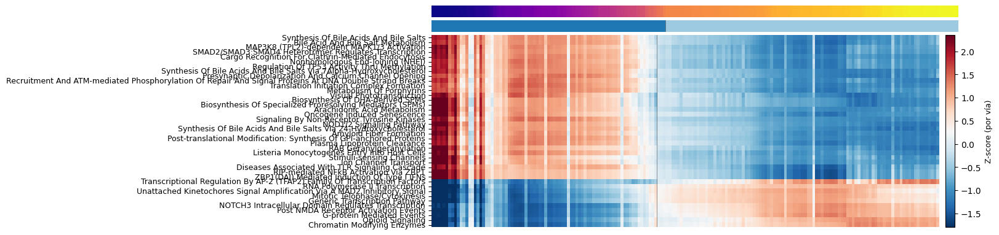

✅ Guardado:
- ./figs/heatmap_pt_cells_TOPLINEAL.png
- ./figs/heatmap_pt_cells_TOPLINEAL.pdf


In [ ]:
# =============================================================================
# EJECUCIÓN (ajusta ids_path si quieres). Deben existir en ad12.obs_names.
# =============================================================================
ids_path = ["3006","11467"]  # <-- anclas dentro del SUBSET 1+2 (verifica que existan)

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# Visualización (estilo PHATE pero sobre UMAP 2D del subset)
plot_umap_path_with_pseudotime(
    ad2, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=ids_path
)



# Heatmap alineado por pseudotiempo (lista manual o auto si vacía)
heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    row_cluster=True,  # ← si quieres agrupar filas: True
    width=16, height=3.5,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)


# --------- Heatmap EXTRA: top vías mejor alineadas linealmente con PT ---------
top_cols, r_series = select_scores_by_linear_alignment(
    ad2, score_cols=None, pt_key=PT_KEY, min_var=1e-12, top_k=40
)
# Puedes guardar la tabla de correlaciones si quieres:
corr_tab = r_series.sort_values(key=lambda s: s.abs(), ascending=False)
os.makedirs("./figs", exist_ok=True)
corr_tab.to_csv("./figs/score_vs_pt_correlations.csv")
print("📄 Guardado ranking de correlaciones en ./figs/score_vs_pt_correlations.csv")

# Heatmap con esas top vías (orden de filas por clustering jerárquico activado)
heatmap_for_cells_with_pt(
    ad2, top_cols,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    row_cluster=True, row_cluster_metric="correlation", row_cluster_method="average",
    width=16, height=4.2,
    out_png="./figs/heatmap_pt_cells_TOPLINEAL.png",
    out_pdf="./figs/heatmap_pt_cells_TOPLINEAL.pdf"
)


✅ Subset hierarchical_cluster en ['1', '2']: 3233 células
ℹ️  Recalculando '2D_UMAP_RECLUSTERING' desde *_SCORE en el subset…
✅ UMAP 2D guardado en ad_sub.obsm['2D_UMAP_RECLUSTERING'] (k=1000)


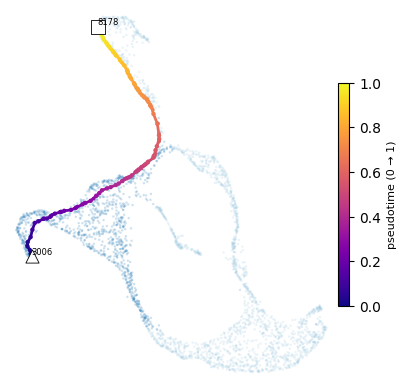

✅ Guardado:
- ./figs/umap_path_with_pseudotime.pdf
- ./figs/umap_path_with_pseudotime.png


ValueError: Value of 'hover_data_2' is not the name of a column in 'data_frame'. Expected one of ['x', 'y', 'index', 'cell_id', 'pseudotime', 'cluster'] but received: hierarchical_cluster

In [ ]:
# =============================================================================
# SUBSET (meta 1 y 2) + RUTA + EXPANSIÓN + VISUALIZACIÓN + HEATMAP (+ suavizado)
# UMAP 2D REECLUSTERIZADO del subset (obsm["2D_UMAP_RECLUSTERING"])
# + UMAP Plotly con índices + selección de vías más lineales vs. pseudotiempo
# =============================================================================
import os, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from sklearn.neighbors import NearestNeighbors
from scipy.sparse.csgraph import dijkstra
from scipy import sparse as sps

# --- para el bloque de rescate / UMAP ---
import scanpy as sc
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# --- para clustering jerárquico opcional en el heatmap ---
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, leaves_list

# --- para UMAP interactivo ---
import plotly.express as px

# ----------------------- Parámetros clave (AJUSTABLES) -----------------------
KEEP_META = ["1","2"]                      # metaclústeres a conservar
STORE_UMAP_KEY = "2D_UMAP_RECLUSTERIZING"  # si tu clave real es '2D_UMAP_RECLUSTERING', sustitúyela
STORE_UMAP_KEY = "2D_UMAP_RECLUSTERING"    # <-- usa la clave real
WEIGHT_KEY     = STORE_UMAP_KEY            # mismo embedding para pesos del grafo

N_NEIGHBORS    = 25                        # k del grafo para Dijkstra
EXPAND_KNN     = 15                        # k vecinos por nodo de ruta (expansión)
EXPAND_RADIUS  = 0.30                      # radio geométrico a la polilínea (expansión)
EXPAND_TO_N    = 180                       # objetivo total ruta + extras

PT_KEY         = "pseudotime_guided"
PATH_FLAG_KEY  = "guided_path_flag"
EXPAND_FLAG_KEY= "guided_expanded_flag"

# Suavizado (UNA ESTRATEGIA: media móvil centrada)
SMOOTH_SCORES      = True      # activar/desactivar
SMOOTH_WINDOW      = 41        # ventana impar recomendada (ajústala)
SMOOTH_MIN_PERIODS = 1         # mínimo de puntos válidos por ventana

# Selección de vías lineales
TOP_LINEAR_K = 20              # cuántas vías seleccionar por |r| con el pseudotiempo
USE_ABS_R    = True            # usa correlación absoluta

# Paleta fija opcional (fondo por clúster)
CL_COL = {"1":"#1f77b4","2":"#9ecae1","3":"#e6550d","4":"#fdae6b","5":"#2ca02c","6":"#a1d99b"}

# ----------------------- Detectar columna de meta/cluster --------------------
def find_meta_col(ad):
    for c in [
        "meta_cluster","metacluster","MetaCluster",
        "meta_cluster_id","metacluster_id","metacluster_label",
        "hierarchical_metacluster","hierarchical_cluster",
    ]:
        if c in ad.obs.columns:
            return c
    raise KeyError("No encontré columna de meta-clúster/clúster en ad.obs.")

assert 'adata' in globals(), "Debes tener un AnnData llamado 'adata'."
meta_col = find_meta_col(adata)

# ---------------------- Subset SOLO 1 y 2 (se conserva obsm) -----------------
mask = adata.obs[meta_col].astype(str).isin(KEEP_META)
ad12 = adata[mask].copy()
print(f"✅ Subset {meta_col} en {KEEP_META}: {ad12.n_obs} células")

# ============================= BLOQUE DE RESCATE =============================
# Asegurar ad12.obsm[STORE_UMAP_KEY] heredándolo del padre si existe
# o recalculándolo desde *_SCORE -> PCA -> vecinos -> UMAP.

MIN_VAR = 1e-12
RANDOM_STATE = 0
MIN_DIST = 0.5
N_NEIGHBORS_UMAP = 1000
STORE_PCA_KEY = "X_pca_scores"

def _build_score_matrix(ad, score_cols=None, min_var=1e-12, standardize=True):
    if score_cols is None:
        score_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
    if not score_cols:
        raise ValueError("No se encontraron columnas *_SCORE en ad.obs.")
    df = ad.obs[score_cols].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)
    var = df.var(axis=0, ddof=0).values
    keep = var > float(min_var)
    if keep.sum() < 3:
        raise ValueError(f"Quedan <3 scores con var>0 (mantienen {keep.sum()}).")
    df = df.loc[:, keep]
    X = df.values
    if standardize:
        X = StandardScaler(with_mean=True, with_std=True).fit_transform(X)
    return X.astype(np.float32, copy=False), list(df.columns)

def ensure_umap_for_subset(ad_parent, ad_sub, store_umap_key=STORE_UMAP_KEY):
    # 1) Si ya está, nada que hacer
    if store_umap_key in ad_sub.obsm:
        print(f"✅ Ya existe ad_sub.obsm['{store_umap_key}']")
        return ad_sub

    # 2) Intentar heredar del AnnData padre (alineando por obs_names)
    if store_umap_key in ad_parent.obsm:
        U_parent = pd.DataFrame(ad_parent.obsm[store_umap_key], index=ad_parent.obs_names)
        try:
            U_sub = U_parent.loc[ad_sub.obs_names].values
            ad_sub.obsm[store_umap_key] = U_sub.astype(np.float32)
            print(f"✅ Heredado '{store_umap_key}' desde el AnnData padre (mismo embedding).")
            return ad_sub
        except KeyError:
            pass  # faltan celdas -> recalculamos

    # 3) Recalcular desde *_SCORE → PCA → vecinos → UMAP
    print(f"ℹ️  Recalculando '{store_umap_key}' desde *_SCORE en el subset…")
    X_scores, used_scores = _build_score_matrix(ad_sub, score_cols=None, min_var=MIN_VAR, standardize=True)
    n_comps = int(min(15, X_scores.shape[1], max(2, ad_sub.n_obs - 1)))
    pca = PCA(n_components=n_comps, svd_solver='randomized', random_state=RANDOM_STATE)
    Xp = pca.fit_transform(X_scores)
    ad_sub.obsm[STORE_PCA_KEY] = np.asarray(Xp, dtype=np.float32)
    k = int(max(2, min(N_NEIGHBORS_UMAP, ad_sub.n_obs - 1)))
    sc.pp.neighbors(ad_sub, use_rep=STORE_PCA_KEY, n_neighbors=k, metric="cosine")
    sc.tl.umap(ad_sub, n_components=2, random_state=RANDOM_STATE, min_dist=MIN_DIST, spread=1.0)
    ad_sub.obsm[store_umap_key] = ad_sub.obsm["X_umap"].copy()
    print(f"✅ UMAP 2D guardado en ad_sub.obsm['{store_umap_key}'] (k={k})")
    return ad_sub

# Ejecutar rescate
ad12 = ensure_umap_for_subset(adata, ad12, store_umap_key=STORE_UMAP_KEY)
# =========================== FIN BLOQUE DE RESCATE ===========================

# =============================================================================
# Utilidades geométricas y de grafo (fundamento estilo PHATE)
# =============================================================================
def _arc_length(P: np.ndarray) -> np.ndarray:
    P = np.asarray(P)
    if P.shape[0] < 2: return np.array([0.0], float)
    seg = np.linalg.norm(P[1:] - P[:-1], axis=1)
    return np.concatenate([[0.0], np.cumsum(seg)])

def _project_points_onto_polyline(P: np.ndarray, cum: np.ndarray, Q: np.ndarray, return_dist=False):
    P = np.asarray(P); Q = np.asarray(Q); cum = np.asarray(cum)
    n_seg = P.shape[0] - 1
    if n_seg <= 0:
        if return_dist: return np.zeros(Q.shape[0], float), np.linalg.norm(Q - P[0], axis=1)
        return np.zeros(Q.shape[0], float)
    total = float(cum[-1]) if cum[-1] > 0 else 1.0
    t_out = np.zeros(Q.shape[0], float); d_out = np.full(Q.shape[0], np.inf, float)
    for qi, q in enumerate(Q):
        best_d2, best_t = np.inf, 0.0
        for i in range(n_seg):
            a = P[i]; b = P[i+1]; v = b - a; L2 = float(np.dot(v, v))
            if L2 == 0.0:
                u = 0.0; d2 = float(np.dot(q - a, q - a))
            else:
                u = float(np.dot(q - a, v) / L2); u = 0.0 if u < 0.0 else (1.0 if u > 1.0 else u)
                proj = a + u * v; d2 = float(np.dot(q - proj, q - proj))
            if d2 < best_d2:
                best_d2 = d2; best_t = (cum[i] + u * np.sqrt(L2)) / total
        t_out[qi] = best_t; d_out[qi] = np.sqrt(best_d2)
    return (t_out, d_out) if return_dist else t_out

def _build_knn_graph_safe(ad, rep_key=STORE_UMAP_KEY, n_neighbors=N_NEIGHBORS, weight_embed_key=WEIGHT_KEY):
    assert rep_key in ad.obsm and weight_embed_key in ad.obsm
    X = np.asarray(ad.obsm[rep_key]); W = np.asarray(ad.obsm[weight_embed_key])
    k = int(min(max(2, n_neighbors), X.shape[0]-1))
    nbrs = NearestNeighbors(n_neighbors=k+1, metric="euclidean").fit(X)
    _, inds = nbrs.kneighbors(X, return_distance=True)
    rows, cols, data = [], [], []
    n = ad.n_obs
    for i in range(n):
        js = inds[i, 1:]
        wi = W[i]
        for j in js:
            w = float(np.linalg.norm(wi - W[j])); w = 1.0 if not np.isfinite(w) else w
            rows.append(i); cols.append(j); data.append(w)
    G = sps.csr_matrix((data, (rows, cols)), shape=(n, n))
    return sps.csr_matrix.minimum(G, G.T)

def _shortest_path_indices_safe(G, src, dst):
    dist, pred = dijkstra(G, directed=False, indices=src, return_predecessors=True)
    if not np.isfinite(dist[dst]): return None
    path = [dst]; cur = dst
    while cur != src:
        cur = pred[cur]
        if cur == -9999: return None
        path.append(cur)
    return path[::-1]

# ---------------- Ruta guiada + expansión combinada + pseudotiempo -----------
def guided_pseudotime_by_ids_safe(
    ad, ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_to_n=EXPAND_TO_N, expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS
):
    ad = ad.copy()
    name_to_idx = {str(n): i for i,n in enumerate(ad.obs_names.astype(str))}
    miss = [cid for cid in ids_path if str(cid) not in name_to_idx]
    if miss: raise KeyError(f"IDs no encontrados en el subset 1+2: {miss}")

    G = _build_knn_graph_safe(ad, rep_key=rep_key, n_neighbors=n_neighbors, weight_embed_key=weight_embed_key)
    anchors = [name_to_idx[str(a)] for a in ids_path]

    route = []
    for ia, ib in zip(anchors[:-1], anchors[1:]):
        seg = _shortest_path_indices_safe(G, ia, ib)
        if not seg:
            raise ValueError(f"No hay camino entre '{ad.obs_names[ia]}' y '{ad.obs_names[ib]}'. Sube n_neighbors (p.ej., 30).")
        route.extend(seg[1:] if (route and seg[0]==route[-1]) else seg)
    route = np.array(route, int)

    W = np.asarray(ad.obsm[weight_embed_key])
    W_route = W[route]
    cum = _arc_length(W_route)
    pt_route = (cum / cum[-1]) if cum[-1] > 0 else np.linspace(0, 1, route.size)

    PT = np.full(ad.n_obs, np.nan, float); PT[route] = pt_route
    path_flag = np.zeros(ad.n_obs, bool); path_flag[route] = True
    expanded_flag = path_flag.copy()

    # Candidatos por kNN y/o radio
    cand = np.array([], int)
    if (expand_knn is not None) and (expand_knn > 0):
        kexp = int(min(expand_knn, ad.n_obs-1))
        nbrs = NearestNeighbors(n_neighbors=kexp+1, metric="euclidean").fit(W)
        _, inds = nbrs.kneighbors(W_route)
        knn_idx = np.unique(inds[:, 1:].ravel())
        knn_idx = knn_idx[~np.isin(knn_idx, route)]
        cand = knn_idx if cand.size == 0 else np.unique(np.concatenate([cand, knn_idx]))

    if (expand_radius is not None) and (expand_radius > 0):
        _, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)
        rad_idx = np.where(d_all <= float(expand_radius))[0]
        rad_idx = rad_idx[~np.isin(rad_idx, route)]
        cand = rad_idx if cand.size == 0 else np.unique(np.concatenate([cand, rad_idx]))

    # Ajustar a N total
    extras = cand
    if (extras.size > 0) or (expand_to_n is not None):
        t_all, d_all = _project_points_onto_polyline(W_route, cum, W, return_dist=True)

    if expand_to_n is not None:
        need_total = max(int(expand_to_n) - route.size, 0)
        if extras.size > need_total > 0:
            order = np.argsort(d_all[extras]); extras = extras[order][:need_total]
        elif extras.size < need_total:
            mask2 = np.ones(ad.n_obs, bool); mask2[route] = False
            if extras.size > 0: mask2[extras] = False
            pool = np.where(mask2)[0]
            if pool.size > 0:
                order = np.argsort(d_all[pool])
                fill = pool[order][: (need_total - extras.size)]
                extras = fill if extras.size == 0 else np.unique(np.concatenate([extras, fill]))

    if extras.size > 0:
        t_extra = _project_points_onto_polyline(W_route, cum, W[extras])
        PT[extras] = t_extra
        expanded = np.unique(np.concatenate([route, extras])).astype(int)
        expanded_flag[:] = False; expanded_flag[expanded] = True

    ad.obs[out_key] = PT
    ad.obs[path_flag_key] = path_flag
    ad.obs[expanded_flag_key] = expanded_flag
    return ad, route

# ----------------------------- Visualización (UMAP 2D) -----------------------
def plot_umap_path_with_pseudotime(
    ad, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    bg_mode="cluster", s_bg=3.0, alpha_bg=0.22,
    s_expanded=7, s_route=10, lw=2.0, cmap="plasma",
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=None, label_fontsize=6, rasterize_axes=True
):
    assert coords_key in ad.obsm, f"Falta ad.obsm['{coords_key}']"
    XY = np.asarray(ad.obsm[coords_key]); assert XY.shape[1] == 2
    route_idx = np.asarray(route_idx, int); xy_path = XY[route_idx]
    if pt_key not in ad.obs.columns: raise KeyError(f"Falta ad.obs['{pt_key}']")
    PT = np.asarray(ad.obs[pt_key].values, float)

    os.makedirs(os.path.dirname(out_pdf) or ".", exist_ok=True)
    fig, ax = plt.subplots(figsize=(4.8, 4.8))   # sin constrained_layout; guardamos con tight
    if rasterize_axes: ax.set_rasterization_zorder(1)

    # Fondo
    if (bg_mode == "cluster") and (cluster_col in ad.obs.columns):
        cl = ad.obs[cluster_col].astype(str).values
        pal = palette or {}
        if not pal:
            uniq = np.unique(cl); tab = plt.cm.get_cmap("tab20", len(uniq))
            pal = {u: tab(i) for i, u in enumerate(uniq)}
        ax.scatter(XY[:,0], XY[:,1], s=s_bg,
                   c=[pal.get(c, "#bdbdbd") for c in cl],
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)
    else:
        ax.scatter(XY[:,0], XY[:,1], s=s_bg, c="#9e9e9e",
                   alpha=alpha_bg, linewidths=0, rasterized=True, zorder=0)

    # Expandidas (sin repetir ruta)
    if expanded_flag_key in ad.obs.columns:
        expanded_mask = ad.obs[expanded_flag_key].values.astype(bool)
        if path_flag_key in ad.obs.columns:
            expanded_mask &= ~ad.obs[path_flag_key].values.astype(bool)
        valid = expanded_mask & np.isfinite(PT)
        if valid.any():
            ax.scatter(XY[valid,0], XY[valid,1],
                       c=PT[valid], cmap=cmap, s=s_expanded,
                       linewidths=0, zorder=1.5, rasterized=True)

    # Polilínea coloreada por PT
    if route_idx.size >= 2:
        segs = np.stack([xy_path[:-1], xy_path[1:]], axis=1)
        pt_path = PT[route_idx]
        if not np.isfinite(pt_path).all():
            n = pt_path.size; x = np.arange(n); good = np.isfinite(pt_path)
            pt_path = np.interp(x, x[good], pt_path[good])
        lc = LineCollection(segs, cmap=cmap, linewidths=lw, zorder=3)
        lc.set_array(pt_path[:-1]); ax.add_collection(lc)

    sc_route = ax.scatter(xy_path[:,0], xy_path[:,1],
                          c=PT[route_idx], cmap=cmap,
                          s=s_route, linewidths=0, zorder=3.2)

    # Inicio/fin
    ax.scatter(*xy_path[0],  marker="^", s=s_route*9, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)
    ax.scatter(*xy_path[-1], marker="s", s=s_route*10, facecolor="white",
               edgecolor="black", linewidths=0.6, zorder=4)

    # IDs ancla
    if show_ids:
        name_to_idx = {str(n): i for i,n in enumerate(ad.obs_names.astype(str))}
        for oid in show_ids:
            k = name_to_idx.get(str(oid))
            if k is None: continue
            if np.any(route_idx == k):
                x, y = XY[k]
                ax.text(x, y, str(oid), fontsize=label_fontsize,
                        ha="left", va="bottom", zorder=5)

    # Límites
    if extent == "all":
        x_min, x_max = XY[:,0].min(), XY[:,0].max()
        y_min, y_max = XY[:,1].min(), XY[:,1].max()
        dx, dy = (x_max - x_min), (y_max - y_min)
    else:
        x_min, x_max = xy_path[:,0].min(), xy_path[:,0].max()
        y_min, y_max = xy_path[:,1].min(), xy_path[:,1].max()
        dx, dy = np.ptp(xy_path[:,0]), np.ptp(xy_path[:,1])
    pad = float(pad)
    ax.set_xlim(x_min - pad*max(dx,1e-9), x_max + pad*max(dx,1e-9))
    ax.set_ylim(y_min - pad*max(dy,1e-9), y_max + pad*max(dy,1e-9))
    ax.set_aspect("equal","box"); ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values(): sp.set_visible(False)

    cbar = fig.colorbar(sc_route, ax=ax, fraction=0.03, pad=0.015)
    cbar.set_label("pseudotime (0 → 1)", fontsize=8)

    os.makedirs("./figs", exist_ok=True)
    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_png, dpi=500, bbox_inches="tight", pad_inches=0.02)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_pdf}\n- {out_png}")

# --------------------------- UMAP Plotly con índices --------------------------
def plot_umap_plotly_with_indices(
    ad, coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    cluster_col=meta_col, title="UMAP (interactivo) con índices"
):
    assert coords_key in ad.obsm, f"Falta ad.obsm['{coords_key}']"
    XY = np.asarray(ad.obsm[coords_key]); assert XY.shape[1] == 2
    df = pd.DataFrame({
        "x": XY[:,0],
        "y": XY[:,1],
        "index": np.arange(ad.n_obs),                   # índice numérico
        "cell_id": ad.obs_names.astype(str).values,     # ID
    })
    if pt_key in ad.obs.columns:
        df["pseudotime"] = ad.obs[pt_key].values
    if cluster_col in ad.obs.columns:
        df["cluster"] = ad.obs[cluster_col].astype(str).values

    color_col = "pseudotime" if "pseudotime" in df.columns else ("cluster" if "cluster" in df.columns else None)
    fig = px.scatter(
        df, x="x", y="y",
        color=color_col,
        hover_data=["index","cell_id"] + ([cluster_col] if "cluster" in df.columns else []),
        title=title,
        width=700, height=650
    )
    fig.update_traces(marker=dict(size=5), selector=dict(mode='markers'))
    fig.update_layout(template="simple_white")
    fig.show()
    return df  # por si quieres usar el DataFrame

# --------------------- Suavizado: media móvil centrada -----------------------
def _smooth_scores_moving_mean(ad, cells_ordered, score_cols, window=SMOOTH_WINDOW, min_periods=SMOOTH_MIN_PERIODS):
    """
    Devuelve DataFrame (celdas × vías) con *_SCORE suavizados
    siguiendo el orden de 'cells_ordered' (ya ordenadas por pseudotiempo).
    Estrategia única: media móvil centrada.
    """
    df = ad.obs.loc[cells_ordered, score_cols].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)
    w = int(max(1, window))
    if w > 1 and (w % 2 == 0):  # mejor impar
        w += 1
    out = df.rolling(window=w, min_periods=int(min_periods), center=True).mean()
    out = out.fillna(method="bfill").fillna(method="ffill")
    return out

# ------------------------------ Heatmap alineado ------------------------------
def _short_lbl(s: str) -> str:
    s = re.sub(r"\s*SCORE\s*$", "", s, flags=re.I)
    s = re.sub(r"\s*R-HSA-\d+(\.\d+)?\s*", "", s, flags=re.I)
    return s.replace("_"," ").strip()

def heatmap_for_cells_with_pt(
    ad, selected_scores, pt_key=PT_KEY,
    use_flag_key=EXPAND_FLAG_KEY,       # o PATH_FLAG_KEY para solo ruta
    cluster_col=meta_col, palette=CL_COL,
    zscore_per_row=True, cmap="RdBu_r",
    show_pt_track=True, pt_cmap="plasma",
    show_pt_ticks=False,
    # ordenar filas por clustering jerárquico (sin dendrograma)
    row_cluster=False, row_cluster_metric="correlation", row_cluster_method="average",
    # suavizado (solo media móvil)
    smooth_scores=SMOOTH_SCORES, smooth_window=SMOOTH_WINDOW, smooth_min_periods=SMOOTH_MIN_PERIODS,
    width=None, height=None, per_col=0.012, per_row=0.35,
    min_w=7.0, max_w=18.5, min_h=4.8,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
):
    import matplotlib.pyplot as plt
    from matplotlib.colors import to_rgba

    assert pt_key in ad.obs.columns, f"Falta ad.obs['{pt_key}']"
    mask = ad.obs[pt_key].notna()
    if use_flag_key in ad.obs.columns: mask &= ad.obs[use_flag_key].astype(bool)
    cells = ad.obs_names[mask]
    if cells.size == 0: raise ValueError("No hay células con pseudotiempo para mostrar.")

    # Orden por pseudotiempo (columnas)
    pt = ad.obs.loc[cells, pt_key].astype(float).values
    order = np.argsort(pt); cells = cells[order]; pt = pt[order]

    # Selección de vías (si lista vacía o ninguna existe, auto *_SCORE)
    cols_exist = [c for c in (selected_scores or []) if c in ad.obs.columns]
    if not cols_exist:
        auto_cols = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
        if len(auto_cols) == 0:
            raise ValueError("No hay columnas *_SCORE en ad.obs para el heatmap.")
        cols_exist = auto_cols

    # Suavizado (celdas × vías) y matriz (vías × celdas)
    if smooth_scores:
        df_smooth = _smooth_scores_moving_mean(ad, cells, cols_exist, window=smooth_window, min_periods=smooth_min_periods)
        M = df_smooth.T
        cbar_label_base = f"Score (media móvil {smooth_window})"
    else:
        df = ad.obs.loc[cells, cols_exist].apply(pd.to_numeric, errors="coerce")
        df = df.apply(lambda s: s.fillna(s.median()), axis=0)
        M = df.T
        cbar_label_base = "Score"

    # Z-score por fila (opcional)
    if zscore_per_row:
        mu = M.mean(axis=1).values[:, None]
        sd = M.std(axis=1).replace(0, np.nan).values[:, None]
        Z = (M.values - mu) / sd
        Z = np.nan_to_num(Z, nan=0.0)
        data = Z; cbar_label = "Z-score (por vía)"
    else:
        data = M.values; cbar_label = cbar_label_base

    row_labels = [_short_lbl(c) for c in M.index]
    n_rows, n_cols = data.shape

    # ordenar filas por clustering jerárquico (sin dendrograma)
    if row_cluster and n_rows >= 3:
        try:
            D = pdist(data, metric=row_cluster_metric)
            if row_cluster_method == "ward" and row_cluster_metric != "euclidean":
                D = pdist(data, metric="euclidean")
            Zlink = linkage(D, method=row_cluster_method)
            leaves = leaves_list(Zlink)
            data = data[leaves, :]
            row_labels = [row_labels[i] for i in leaves]
        except Exception as e:
            print(f"⚠️ No se pudo ordenar filas por clustering ({type(e).__name__}: {e}).")

    # tira de cluster
    strip_rgba, bounds = None, np.array([], int)
    if (cluster_col is not None) and (cluster_col in ad.obs.columns):
        cl_ord = ad.obs.loc[cells, cluster_col].astype(str).values
        pal = palette or {}
        if not pal:
            uniq = np.unique(cl_ord); tab = plt.cm.get_cmap("tab20", len(uniq))
            pal = {u: tab(i) for i, u in enumerate(uniq)}
        strip_rgba = np.array([to_rgba(pal.get(x, "#bdbdbd")) for x in cl_ord], float)[None, :, :]
        bounds = np.where(cl_ord[1:] != cl_ord[:-1])[0] + 1

    # tamaños
    have_pttrk = bool(show_pt_track); have_strip = strip_rgba is not None
    ratios = []
    if have_pttrk: ratios.append(0.55)
    if have_strip: ratios.append(0.55)
    ratios.append(9.4)

    if width is None:  fig_w = max(min_w, min(max_w, 6.5 + per_col*n_cols))
    else:              fig_w = float(width)
    extra_h = (0.25 if have_pttrk else 0) + (0.25 if have_strip else 0)
    if height is None: fig_h = max(min_h, 2.2 + per_row*n_rows + extra_h)
    else:              fig_h = float(height)

    os.makedirs(os.path.dirname(out_png) or ".", exist_ok=True)
    fig, axes = plt.subplots(len(ratios), 1, sharex=True,
                             gridspec_kw={"height_ratios": ratios},
                             figsize=(fig_w, fig_h))  # sin constrained_layout
    if not isinstance(axes, (list, np.ndarray)): axes = [axes]
    ax_idx = 0

    max_lbl = max(len(x) for x in row_labels) if row_labels else 12
    left_margin = min(0.45, 0.14 + 0.009*max_lbl)
    fig.subplots_adjust(left=left_margin, right=0.985, top=0.92, bottom=0.06, hspace=0.05)

    # (1) PT track
    if have_pttrk:
        ax_pt = axes[ax_idx]; ax_idx += 1
        ax_pt.imshow(pt[None, :], aspect="auto", cmap=pt_cmap,
                     interpolation="nearest", origin="upper",
                     extent=(-0.5, n_cols-0.5, 0.5, -0.5), rasterized=True)
        ax_pt.set_yticks([]); ax_pt.set_xticks([])
        for sp in ax_pt.spines.values(): sp.set_visible(False)
        if show_pt_ticks:
            ax_pt_top = ax_pt.secondary_xaxis("top")
            ax_pt_top.set_xticks([0.0, 0.5, 1.0], labels=["0.0","0.5","1.0"])
            ax_pt_top.set_xlabel("Pseudotime", fontsize=9)
            ax_pt_top.tick_params(labelsize=8)

    # (2) strip cluster
    if have_strip:
        ax_strip_ax = axes[ax_idx]; ax_idx += 1
        ax_strip_ax.imshow(strip_rgba, aspect="auto", interpolation="nearest",
                           origin="upper", rasterized=True,
                           extent=(-0.5, n_cols-0.5, 0.5, -0.5))
        ax_strip_ax.set_yticks([]); ax_strip_ax.set_xticks([])
        for b in bounds: ax_strip_ax.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
        for sp in ax_strip_ax.spines.values(): sp.set_visible(False)

    # (3) Heatmap
    ax_hm = axes[ax_idx]
    vmin, vmax = np.percentile(data, 1), np.percentile(data, 99)
    im = ax_hm.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax,
                      interpolation="nearest", aspect="auto",
                      origin="upper", rasterized=True,
                      extent=(-0.5, n_cols-0.5, n_rows-0.5, -0.5))
    ax_hm.set_yticks(np.arange(data.shape[0]))
    ax_hm.set_yticklabels(row_labels, fontsize=9, va="center")
    ax_hm.set_ylim(data.shape[0]-0.5, -0.5); ax_hm.set_xticks([])
    for b in bounds: ax_hm.axvline(b-0.5, color="black", lw=0.4, alpha=0.7)
    for sp in ax_hm.spines.values(): sp.set_visible(False)

    cbar = fig.colorbar(im, ax=ax_hm, fraction=0.025, pad=0.012)
    cbar.set_label(cbar_label, fontsize=9)

    # ✅ usa bbox_inches="tight"
    fig.savefig(out_png, dpi=500, bbox_inches="tight", pad_inches=0.02)
    fig.savefig(out_pdf, dpi=500, bbox_inches="tight", pad_inches=0.02)
    plt.show(); plt.close(fig)
    print(f"✅ Guardado:\n- {out_png}\n- {out_pdf}")

# ------- Vías más lineales con el pseudotiempo (Pearson |r|) -----------------
def select_top_linearly_aligned_scores(
    ad, pt_key=PT_KEY, candidates=None, top_k=TOP_LINEAR_K, use_abs=USE_ABS_R,
    use_flag_key=EXPAND_FLAG_KEY, smooth_for_r=SMOOTH_SCORES,
    smooth_window=SMOOTH_WINDOW, smooth_min_periods=SMOOTH_MIN_PERIODS
):
    """
    Devuelve lista con las 'top_k' columnas *_SCORE más lineales con el pseudotiempo
    (por |corr| Pearson). Usa las células válidas (y flag si se da),
    ordenadas por PT; opcionalmente suaviza antes de correlacionar.
    """
    assert pt_key in ad.obs.columns, f"Falta ad.obs['{pt_key}']"
    mask = ad.obs[pt_key].notna()
    if use_flag_key in ad.obs.columns:
        mask &= ad.obs[use_flag_key].astype(bool)
    cells = ad.obs_names[mask]
    if cells.size == 0:
        raise ValueError("No hay células con pseudotiempo para ranking.")

    pt = ad.obs.loc[cells, pt_key].astype(float).values
    order = np.argsort(pt); cells = cells[order]; pt = pt[order]

    # candidatos
    if candidates is None or len(candidates) == 0:
        candidates = [c for c in ad.obs.columns if re.search(r"SCORE$", str(c), flags=re.I)]
    # matriz (celdas × vías)
    df = ad.obs.loc[cells, candidates].apply(pd.to_numeric, errors="coerce")
    df = df.apply(lambda s: s.fillna(s.median()), axis=0)

    if smooth_for_r:
        df = _smooth_scores_moving_mean(ad, cells, candidates, window=smooth_window, min_periods=smooth_min_periods)

    # correlación por columna vs pt
    rvals = {}
    for c in df.columns:
        x = df[c].values.astype(float)
        if np.std(x) <= 1e-9:
            r = 0.0
        else:
            r = np.corrcoef(x, pt)[0,1]
        rvals[c] = abs(r) if use_abs else r

    ranked = sorted(rvals.items(), key=lambda kv: kv[1], reverse=True)
    top = [name for name, _ in ranked[:int(top_k)]]
    return top, pd.Series(rvals).sort_values(ascending=False)

def heatmap_top_linear_scores(
    ad, pt_key=PT_KEY, candidates=None, top_k=TOP_LINEAR_K, **heatmap_kwargs
):
    top, rseries = select_top_linearly_aligned_scores(
        ad, pt_key=pt_key, candidates=candidates, top_k=top_k
    )
    print("🔝 Top vías por |r| con PT:", top[:min(10,len(top))], ("..." if len(top)>10 else ""))
    return heatmap_for_cells_with_pt(ad, top, pt_key=pt_key, **heatmap_kwargs)

# =============================================================================
# VÍAS (puedes cambiar esta lista; si queda vacía o ninguna existe, auto *_SCORE)
# =============================================================================
SELECTED_SCORES = [
 'SUMOylation R-HSA-2990846_SCORE','Cell Cycle R-HSA-1640170_SCORE',
 'RIPK1-mediated Regulated Necrosis R-HSA-5213460_SCORE','Regulated Necrosis R-HSA-5218859_SCORE',
 'Regulation Of Necroptotic Cell Death R-HSA-5675482_SCORE','Inflammasomes R-HSA-622312_SCORE',
 'G1/S Transition R-HSA-69206_SCORE','Mitotic G1 Phase And G1/S Transition R-HSA-453279_SCORE',
 'VEGFR2 Mediated Vascular Permeability R-HSA-5218920_SCORE','Signaling By VEGF R-HSA-194138_SCORE',
 'G2/M DNA Damage Checkpoint R-HSA-69473_SCORE','G2/M Transition R-HSA-69275_SCORE',
 'Sphingolipid Metabolism R-HSA-428157_SCORE'
]

# =============================================================================
# EJECUCIÓN (ajusta ids_path si quieres). Deben existir en ad12.obs_names.
# =============================================================================
ids_path = ["3006","8178"]  # <-- tus anclas dentro del SUBSET 1+2

# Verificar IDs en el subset
_missing = [i for i in ids_path if str(i) not in ad12.obs_names.astype(str)]
if _missing:
    raise KeyError(f"IDs no presentes en el subset 1+2: {_missing}")

# Pseudotiempo guiado en el UMAP 2D del subset
ad2, route_idx = guided_pseudotime_by_ids_safe(
    ad12, ids_path=ids_path,
    rep_key=STORE_UMAP_KEY, weight_embed_key=WEIGHT_KEY,
    n_neighbors=N_NEIGHBORS,
    out_key=PT_KEY, path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    expand_knn=EXPAND_KNN, expand_radius=EXPAND_RADIUS, expand_to_n=EXPAND_TO_N
)

# ----------------------------- PLOTS RECAP -----------------------------------
# 1) UMAP (Matplotlib) estilo PHATE sobre UMAP 2D del subset
plot_umap_path_with_pseudotime(
    ad2, route_idx,
    coords_key=STORE_UMAP_KEY, pt_key=PT_KEY,
    path_flag_key=PATH_FLAG_KEY, expanded_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    extent="all", pad=0.02,
    out_pdf="./figs/umap_path_with_pseudotime.pdf",
    out_png="./figs/umap_path_with_pseudotime.png",
    show_ids=ids_path
)

# 2) UMAP interactivo (Plotly) mostrando índice e ID en hover
_ = plot_umap_plotly_with_indices(
    ad2, coords_key=STORE_UMAP_KEY, pt_key=PT_KEY, cluster_col=meta_col,
    title="UMAP 2D (subset 1+2) · hover=index, cell_id"
)

# 3) Heatmap alineado por pseudotiempo (lista fija o auto) con suavizado
heatmap_for_cells_with_pt(
    ad2, SELECTED_SCORES,
    pt_key=PT_KEY, use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    # visual
    show_pt_track=True, pt_cmap="plasma", show_pt_ticks=False,
    # suavizado (media móvil)
    smooth_scores=SMOOTH_SCORES, smooth_window=SMOOTH_WINDOW,
    # ordenar filas con clustering (si quieres)
    row_cluster=True, row_cluster_metric="correlation", row_cluster_method="average",
    width=16, height=3.8,
    out_png="./figs/heatmap_pt_cells.png",
    out_pdf="./figs/heatmap_pt_cells.pdf"
)

# 4) Heatmap de TOP vías más lineales con el pseudotiempo (Pearson |r|)
heatmap_top_linear_scores(
    ad2, pt_key=PT_KEY, candidates=SELECTED_SCORES, top_k=TOP_LINEAR_K,
    use_flag_key=EXPAND_FLAG_KEY,
    cluster_col=meta_col, palette=CL_COL,
    show_pt_track=True, pt_cmap="plasma",
    smooth_scores=SMOOTH_SCORES, smooth_window=SMOOTH_WINDOW,
    row_cluster=True, row_cluster_metric="correlation", row_cluster_method="average",
    width=16, height=3.8,
    out_png="./figs/heatmap_pt_cells_TOPlinear.png",
    out_pdf="./figs/heatmap_pt_cells_TOPlinear.pdf"
)

print("🎉 ¡Listo todo!")
